# Inventory & orders analysis

This refined notebook walks through the data pipeline from raw CSVs to business insights. Each step is explicitly commented and explained.

### Table of contents
1. [Import Libraries](#import-libraries)
2. [Load Raw Data](#load-data)
3. [Data Preparation](#data-preparation)
4. [Exploratory Data Analysis](#eda)
5. [Insights](#insights)
6. [Conclusions](#conclusions)

### 1. import libraries
We start by importing the required Python libraries used throughout this notebook.

### Step 1: data manipulation / transformation.

This cell data manipulation / transformation.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import matplotlib.cm as cm

### 2. load the datasets
Here, we read the inventory and order datasets for analysis.

### Step 2: load dataset(s) into dataframe(s).

This cell load dataset(s) into dataframe(s).

In [3]:
inv = pd.read_csv('C:\\Users\\abdel\\Downloads\\Project phase 2\\inventory.csv', encoding='ISO-8859-1')
df = pd.read_csv('C:\\Users\\abdel\\Downloads\\Project phase 2\\orders_and_shipments.csv', encoding='ISO-8859-1')
df.head()

,Order ID,Order Item ID,Order YearMonth,Order Year,Order Month,Order Day,Order Time,Order Quantity,Product Department,Product Category,...,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit
0,3535,8793,201502,2015,2,21,14:07,1,Fan Shop,Fishing,...,Mexico,Puerto Rico,2015,2,27,Standard Class,4,400,0.25,200
1,4133,10320,201503,2015,3,2,07:37,1,Fan Shop,Fishing,...,Brazil,Puerto Rico,2015,3,6,Standard Class,4,400,0.09,200
2,7396,18517,201504,2015,4,18,22:47,1,Fan Shop,Fishing,...,Mexico,Puerto Rico,2015,4,20,Standard Class,4,400,0.06,200
3,11026,27608,201506,2015,6,10,22:32,1,Fan Shop,Fishing,...,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400,0.15,200
4,11026,27609,201506,2015,6,10,22:32,1,Fan Shop,Fishing,...,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400,0.13,200


### Step 3: data manipulation / transformation.

This cell data manipulation / transformation.

In [4]:
print(df.columns)

Index([' Order ID ', ' Order Item ID ', ' Order YearMonth ', ' Order Year ',
       ' Order Month ', ' Order Day ', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name',
       ' Customer ID ', 'Customer Market', 'Customer Region',
       'Customer Country', 'Warehouse Country', 'Shipment Year',
       'Shipment Month', 'Shipment Day', 'Shipment Mode',
       ' Shipment Days - Scheduled ', ' Gross Sales ', ' Discount % ',
       ' Profit '],
      dtype='object')


### Step 4: data manipulation / transformation.

This cell data manipulation / transformation.

In [5]:
print(df.shape)

(30871, 24)


### 3. data quality check
We identify missing and duplicate values that could affect our analysis.

### Step 5: data manipulation / transformation.

This cell data manipulation / transformation.

In [6]:
df.isnull().sum()

 Order ID                      0
 Order Item ID                 0
 Order YearMonth               0
 Order Year                    0
 Order Month                   0
 Order Day                     0
Order Time                     0
Order Quantity                 0
Product Department             0
Product Category               0
Product Name                   0
 Customer ID                   0
Customer Market                0
Customer Region                0
Customer Country               0
Warehouse Country              0
Shipment Year                  0
Shipment Month                 0
Shipment Day                   0
Shipment Mode                  0
 Shipment Days - Scheduled     0
 Gross Sales                   0
 Discount %                    0
 Profit                        0
dtype: int64

### Step 6: data manipulation / transformation.

This cell data manipulation / transformation.

In [7]:
df.duplicated().sum()

0

### Step 7: data manipulation / transformation.

This cell data manipulation / transformation.

In [8]:
for col in df.columns:
    df.loc[df.sample(frac=0.1).index, col] = np.nan

### Step 8: data manipulation / transformation.

This cell data manipulation / transformation.

In [9]:
df.isnull().sum()

 Order ID                      3087
 Order Item ID                 3087
 Order YearMonth               3087
 Order Year                    3087
 Order Month                   3087
 Order Day                     3087
Order Time                     3087
Order Quantity                 3087
Product Department             3087
Product Category               3087
Product Name                   3087
 Customer ID                   3087
Customer Market                3087
Customer Region                3087
Customer Country               3087
Warehouse Country              3087
Shipment Year                  3087
Shipment Month                 3087
Shipment Day                   3087
Shipment Mode                  3087
 Shipment Days - Scheduled     3087
 Gross Sales                   3087
 Discount %                    3087
 Profit                        3087
dtype: int64

### Step 9: data manipulation / transformation.

This cell data manipulation / transformation.

In [10]:
df = df.bfill().ffill()

### Step 10: data manipulation / transformation.

This cell data manipulation / transformation.

In [11]:
df.isnull().sum()

 Order ID                      0
 Order Item ID                 0
 Order YearMonth               0
 Order Year                    0
 Order Month                   0
 Order Day                     0
Order Time                     0
Order Quantity                 0
Product Department             0
Product Category               0
Product Name                   0
 Customer ID                   0
Customer Market                0
Customer Region                0
Customer Country               0
Warehouse Country              0
Shipment Year                  0
Shipment Month                 0
Shipment Day                   0
Shipment Mode                  0
 Shipment Days - Scheduled     0
 Gross Sales                   0
 Discount %                    0
 Profit                        0
dtype: int64

# Remove spaces from the column names

### Step 11: data manipulation / transformation.

This cell data manipulation / transformation.

In [12]:
df.columns = df.columns.str.strip()

### Step 12: data manipulation / transformation.

This cell data manipulation / transformation.

In [13]:
print(df.columns)

Index(['Order ID', 'Order Item ID', 'Order YearMonth', 'Order Year',
       'Order Month', 'Order Day', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name', 'Customer ID',
       'Customer Market', 'Customer Region', 'Customer Country',
       'Warehouse Country', 'Shipment Year', 'Shipment Month', 'Shipment Day',
       'Shipment Mode', 'Shipment Days - Scheduled', 'Gross Sales',
       'Discount %', 'Profit'],
      dtype='object')


### Step 13: data manipulation / transformation.

This cell data manipulation / transformation.

In [14]:
print(df.shape)

(30871, 24)


### Step 14: clean missing data.

This cell clean missing data.

In [15]:
int_columns = ['Order ID', 'Order Item ID', 'Order Year', 'Order Month', 'Order Day', 'Order Quantity', 'Customer ID', 'Shipment Year', 'Shipment Month', 'Shipment Day', 'Shipment Days - Scheduled', 'Gross Sales', 'Profit']
for col in int_columns:
    df[col] = df[col].fillna(0).astype(int)

### Step 15: data manipulation / transformation.

This cell data manipulation / transformation.

In [16]:
print(df.dtypes)

Order ID                       int32
Order Item ID                  int32
Order YearMonth              float64
Order Year                     int32
Order Month                    int32
Order Day                      int32
Order Time                    object
Order Quantity                 int32
Product Department            object
Product Category              object
Product Name                  object
Customer ID                    int32
Customer Market               object
Customer Region               object
Customer Country              object
Warehouse Country             object
Shipment Year                  int32
Shipment Month                 int32
Shipment Day                   int32
Shipment Mode                 object
Shipment Days - Scheduled      int32
Gross Sales                    int32
Discount %                    object
Profit                         int32
dtype: object


### Step 16: data manipulation / transformation.

This cell data manipulation / transformation.

In [17]:
print(df.shape)

(30871, 24)


# Concatenate year, month and day of order and shipment features using datetime to have 2 addition new features which are order date and shipment date

### Step 17: merge or join dataframes.

This cell merge or join dataframes.

In [18]:
df['Order Date'] = pd.to_datetime(df[['Order Year', 'Order Month', 'Order Day']].astype(str).agg('-'.join, axis=1), errors='coerce')
df['Shipment Date'] = pd.to_datetime(df[['Shipment Year', 'Shipment Month', 'Shipment Day']].astype(str).agg('-'.join, axis=1), errors='coerce')
df[['Order Date', 'Shipment Date']].head()

,Order Date,Shipment Date
0,2015-02-21,2015-02-27
1,2015-03-02,2015-03-06
2,2015-04-18,2015-04-20
3,2015-06-10,2015-06-12
4,2015-06-10,2015-06-12


# Drop unnecessary columns like order yearmonth

### Step 18: data manipulation / transformation.

This cell data manipulation / transformation.

In [19]:
df.columns

Index(['Order ID', 'Order Item ID', 'Order YearMonth', 'Order Year',
       'Order Month', 'Order Day', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name', 'Customer ID',
       'Customer Market', 'Customer Region', 'Customer Country',
       'Warehouse Country', 'Shipment Year', 'Shipment Month', 'Shipment Day',
       'Shipment Mode', 'Shipment Days - Scheduled', 'Gross Sales',
       'Discount %', 'Profit', 'Order Date', 'Shipment Date'],
      dtype='object')

### Step 19: data manipulation / transformation.

This cell data manipulation / transformation.

In [20]:
df = df.drop(columns=['Order YearMonth'])
df = df.drop(columns=['Order Year', 'Order Month', 'Order Day'])
df = df.drop(columns=['Shipment Year', 'Shipment Month', 'Shipment Day'])

### Step 20: data manipulation / transformation.

This cell data manipulation / transformation.

In [21]:
df.columns

Index(['Order ID', 'Order Item ID', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name', 'Customer ID',
       'Customer Market', 'Customer Region', 'Customer Country',
       'Warehouse Country', 'Shipment Mode', 'Shipment Days - Scheduled',
       'Gross Sales', 'Discount %', 'Profit', 'Order Date', 'Shipment Date'],
      dtype='object')

# Add a 'product id' column. calculate delivery delays by comparing 'shipment date' and 'order date' while considering scheduled shipment days. identify if an order is delayed, including same-day shipments. set negative delays to 0. finally, test the results.

### Step 21: data manipulation / transformation.

This cell data manipulation / transformation.

In [22]:
print(df.shape)

(30871, 19)


### Step 22: type casting.

This cell type casting.

In [23]:
df['Product ID'] = df['Order ID'].astype(str) + '-' + df['Order Item ID'].astype(str)
df['Delivery Days'] = (df['Shipment Date'] - df['Order Date']).dt.days
df['IsDelayed'] = (df['Delivery Days'] > df['Shipment Days - Scheduled']) | (df['Shipment Mode'] == 'Same Day') & (df['Delivery Days'] > 0)
df['Delays'] = df['Delivery Days'] - df['Shipment Days - Scheduled']
df['Delays'] = df['Delays'].apply(lambda x: x if x > 0 else 0)
df

,Order ID,Order Item ID,Order Time,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,...,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Product ID,Delivery Days,IsDelayed,Delays
0,3535,8793,14:07,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,...,4,400,0.25,200,2015-02-21,2015-02-27,3535-8793,6.0,True,2.0
1,4133,10320,07:37,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,...,4,400,0.09,200,2015-03-02,2015-03-06,4133-10320,4.0,False,0.0
2,7396,18517,22:47,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Northern Europe,...,4,400,0.06,200,2015-04-18,2015-04-20,7396-18517,2.0,False,0.0
3,11026,27608,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,...,4,400,0.13,200,2015-06-10,2015-06-12,11026-27608,2.0,False,0.0
4,11026,27609,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,...,4,400,0.13,200,2015-06-10,2015-06-12,11026-27609,2.0,False,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30866,73246,176561,04:59,1,Fan Shop,Toys,Toys,16799,Pacific Asia,South America,...,4,12,0.06,6,2017-12-05,2017-12-11,73246-176561,6.0,True,2.0
30867,7908,19762,10:10,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,11950,LATAM,South America,...,2,30,0.12,68,2015-04-26,2015-03-30,7908-19762,-27.0,False,0.0
30868,29326,73368,01:51,1,Fan Shop,Water Sports,insta-bed Neverflat Air Mattress,8161,Pacific Asia,South Asia,...,2,30,0.09,68,2016-07-04,2016-03-06,29326-73368,-120.0,False,0.0
30869,63308,158284,03:15,1,Fan Shop,Water Sports,insta-bed Neverflat Air Mattress,5733,Europe,Western Europe,...,2,150,0.02,60,2017-07-13,2017-07-17,63308-158284,4.0,True,2.0


### Step 23: data manipulation / transformation.

This cell data manipulation / transformation.

In [24]:
print(df.shape)

(30871, 23)


### Step 24: data manipulation / transformation.

This cell data manipulation / transformation.

In [25]:
def get_filtered_data(df):
    return df[['Order Date', 'Shipment Date', 'Shipment Mode', 'Shipment Days - Scheduled', 'Order Time', 'IsDelayed', 'Delays']].head(50)
get_filtered_data(df)

,Order Date,Shipment Date,Shipment Mode,Shipment Days - Scheduled,Order Time,IsDelayed,Delays
0,2015-02-21,2015-02-27,Standard Class,4,14:07,True,2.0
1,2015-03-02,2015-03-06,Standard Class,4,07:37,False,0.0
2,2015-04-18,2015-04-20,Standard Class,4,22:47,False,0.0
3,2015-06-10,2015-06-12,Standard Class,4,22:32,False,0.0
4,2015-06-10,2015-06-12,Standard Class,4,22:32,False,0.0
5,2015-06-10,2015-06-12,Standard Class,4,22:32,False,0.0
6,2015-10-13,2015-10-13,Standard Class,4,07:50,False,0.0
7,2015-10-13,2015-10-12,Standard Class,4,14:29,False,0.0
8,2015-11-06,2015-11-12,Standard Class,4,16:12,True,2.0
9,2015-11-15,2015-11-17,Standard Class,4,21:16,False,0.0


### Step 25: data manipulation / transformation.

This cell data manipulation / transformation.

In [26]:
print(df.shape)

(30871, 23)


# Filter data where order date is greater than shipment date. also dropping records

# Also Dropping all records with missing Values and Duplicates in the DataSet and resetting index after cleaning

### Step 26: data manipulation / transformation.

This cell data manipulation / transformation.

In [27]:
invalid_dates = df[df['Order Date'] > df['Shipment Date']]
invalid_dates

,Order ID,Order Item ID,Order Time,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,...,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Product ID,Delivery Days,IsDelayed,Delays
7,19566,48912,14:29,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,12088,Europe,Western Europe,...,4,400,0.12,200,2015-10-13,2015-10-12,19566-48912,-1.0,False,0.0
43,4305,10784,11:25,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,5605,LATAM,Caribbean,...,3,400,0.02,200,2015-06-13,2015-04-13,4305-10784,-61.0,False,0.0
44,4305,10784,13:40,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7223,LATAM,Caribbean,...,3,400,0.01,200,2015-06-28,2015-05-04,4305-10784,-55.0,False,0.0
46,21968,163081,12:22,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,509,Pacific Asia,Eastern Asia,...,2,400,0.12,200,2017-10-27,2015-10-29,21968-163081,-729.0,False,0.0
50,15811,39522,17:44,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3953,Europe,Western Europe,...,1,400,0.02,200,2015-10-10,2015-08-12,15811-39522,-59.0,False,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30754,41391,103308,04:45,1,Fan Shop,Indoor/Outdoor Games,O'Brien Men's Neoprene Life Vest,12104,Europe,Canada,...,4,50,0.25,125,2016-11-27,2016-08-29,41391-103308,-90.0,False,0.0
30801,21943,54894,21:15,1,Fan Shop,Indoor/Outdoor Games,O'Brien Men's Neoprene Life Vest,4455,Pacific Asia,Oceania,...,3,50,0.18,125,2015-11-04,2015-04-17,21943-54894,-201.0,False,0.0
30828,65013,162503,00:35,1,Fan Shop,Indoor/Outdoor Games,O'Brien Men's Neoprene Life Vest,326,Europe,Western Europe,...,4,50,0.09,125,2017-08-16,2017-08-11,65013-162503,-5.0,False,0.0
30867,7908,19762,10:10,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,11950,LATAM,South America,...,2,30,0.12,68,2015-04-26,2015-03-30,7908-19762,-27.0,False,0.0


### Step 27: data manipulation / transformation.

This cell data manipulation / transformation.

In [28]:
print(df.shape)

(30871, 23)


### Step 28: clean missing data.

This cell clean missing data.

In [29]:
df = df[df['Order Date'] <= df['Shipment Date']]
df = df.dropna()
df = df.drop_duplicates()
df = df.reset_index(drop=True)

### Step 29: data manipulation / transformation.

This cell data manipulation / transformation.

In [30]:
print(df.shape)

(24883, 23)


### Step 30: generate visualization.

This cell generate visualization.

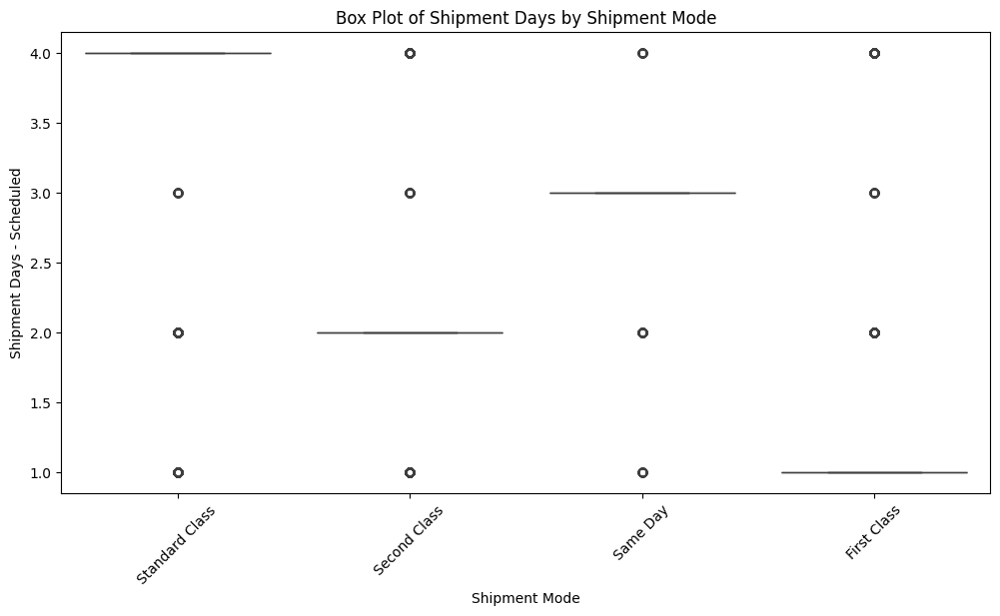

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['Shipment Mode'], y=df['Shipment Days - Scheduled'])
plt.xlabel('Shipment Mode')
plt.ylabel('Shipment Days - Scheduled')
plt.title('Box Plot of Shipment Days by Shipment Mode')
plt.xticks(rotation=45)
plt.show()

### **plot 1 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 1 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 31: generate visualization.

This cell generate visualization.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\462731863.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x="Shipment Mode", y="Shipment Days - Scheduled", data=df, estimator=lambda x: len(set(x)), ci=None)


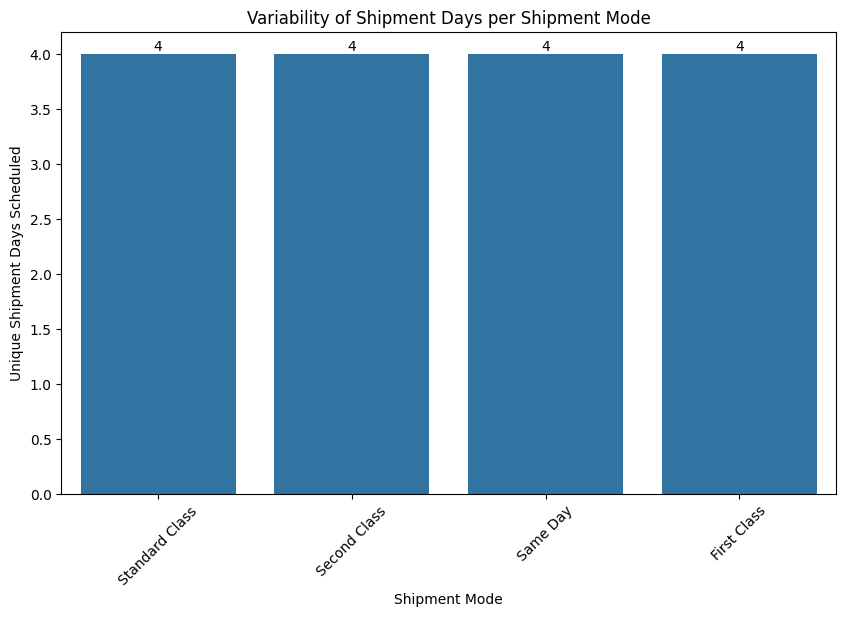

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Shipment Mode', y='Shipment Days - Scheduled', data=df, estimator=lambda x: len(set(x)), ci=None)
for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}', ha='center', va='bottom')
plt.xlabel('Shipment Mode')
plt.ylabel('Unique Shipment Days Scheduled')
plt.title('Variability of Shipment Days per Shipment Mode')
plt.xticks(rotation=45)
plt.show()

### **plot 2 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 2 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 32: generate visualization.

This cell generate visualization.

In [33]:
""" import matplotlib.pyplot as plt
import seaborn as sns  # Load required libraries

# Count the occurrences of each Shipment Days - Scheduled for each Shipment Mode
plt.figure(figsize=(10, 6))
sns.barplot(x="Shipment Mode", y="Shipment Days - Scheduled", data=df, estimator=lambda x: len(set(x)), ci=None)

# Labels and title
plt.xlabel("Shipment Mode")
plt.ylabel("Unique Shipment Days Scheduled")
plt.title("Variability of Shipment Days per Shipment Mode")
plt.xticks(rotation=45)

# Show the plot
plt.show()  """

' import matplotlib.pyplot as plt\nimport seaborn as sns  # Load required libraries\n\n# Count the occurrences of each Shipment Days - Scheduled for each Shipment Mode\nplt.figure(figsize=(10, 6))\nsns.barplot(x="Shipment Mode", y="Shipment Days - Scheduled", data=df, estimator=lambda x: len(set(x)), ci=None)\n\n# Labels and title\nplt.xlabel("Shipment Mode")\nplt.ylabel("Unique Shipment Days Scheduled")\nplt.title("Variability of Shipment Days per Shipment Mode")\nplt.xticks(rotation=45)\n\n# Show the plot\nplt.show()  '

### **plot 3 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 3 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 33: data manipulation / transformation.

This cell data manipulation / transformation.

In [34]:
print(df.shape)

(24883, 23)


### Step 34: generate visualization.

This cell generate visualization.

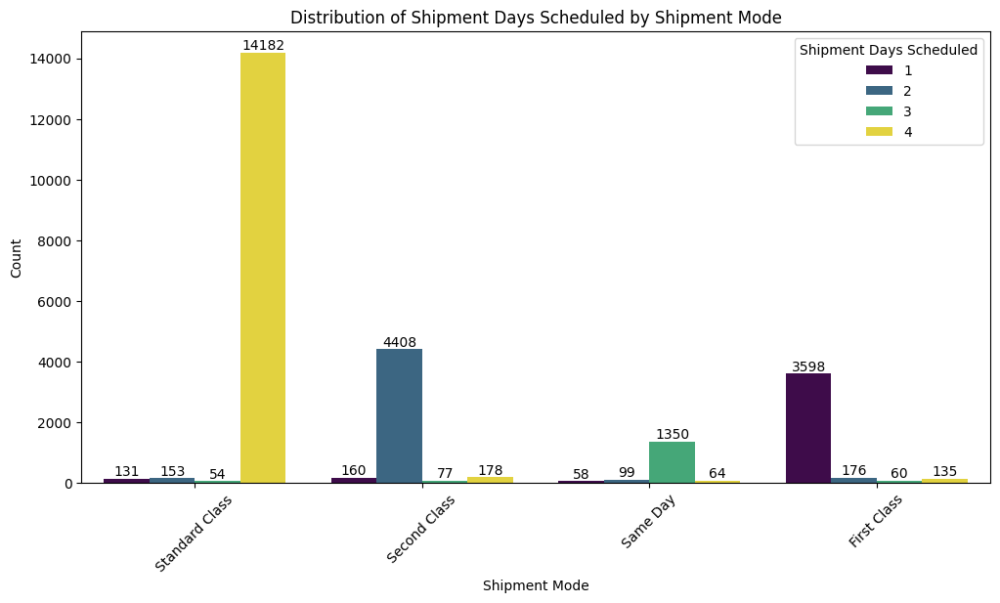

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
sns.countplot(x='Shipment Mode', hue='Shipment Days - Scheduled', data=df, palette='viridis')
ax = plt.gca()
for bar in ax.patches:
    height = bar.get_height()
    if height > 0:
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}', ha='center', va='bottom')
plt.xlabel('Shipment Mode')
plt.ylabel('Count')
plt.title('Distribution of Shipment Days Scheduled by Shipment Mode')
plt.xticks(rotation=45)
plt.legend(title='Shipment Days Scheduled')
plt.show()

### **plot 4 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 4 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 35: generate visualization.

This cell generate visualization.

In [36]:
""" import matplotlib.pyplot as plt
import seaborn as sns  # Load required libraries

# Set figure size
plt.figure(figsize=(12, 6))

# Create a bar chart showing the count of each shipment days scheduled per shipment mode
sns.countplot(x="Shipment Mode", hue="Shipment Days - Scheduled", data=df, palette="viridis")

# Labels and title
plt.xlabel("Shipment Mode")
plt.ylabel("Count")
plt.title("Distribution of Shipment Days Scheduled by Shipment Mode")
plt.xticks(rotation=45)

# Show the legend
plt.legend(title="Shipment Days Scheduled")

# Show the plot
plt.show() """

' import matplotlib.pyplot as plt\nimport seaborn as sns  # Load required libraries\n\n# Set figure size\nplt.figure(figsize=(12, 6))\n\n# Create a bar chart showing the count of each shipment days scheduled per shipment mode\nsns.countplot(x="Shipment Mode", hue="Shipment Days - Scheduled", data=df, palette="viridis")\n\n# Labels and title\nplt.xlabel("Shipment Mode")\nplt.ylabel("Count")\nplt.title("Distribution of Shipment Days Scheduled by Shipment Mode")\nplt.xticks(rotation=45)\n\n# Show the legend\nplt.legend(title="Shipment Days Scheduled")\n\n# Show the plot\nplt.show() '

### **plot 5 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 5 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 36: aggregate/group data.

This cell aggregate/group data.

In [37]:
shipment_mode_variability = df.groupby('Shipment Mode')['Shipment Days - Scheduled'].unique()
shipment_mode_variability = shipment_mode_variability.reset_index()
print(shipment_mode_variability)

    Shipment Mode Shipment Days - Scheduled
0     First Class              [1, 2, 4, 3]
1        Same Day              [3, 1, 4, 2]
2    Second Class              [2, 1, 3, 4]
3  Standard Class              [4, 1, 2, 3]


### Step 37: data manipulation / transformation.

This cell data manipulation / transformation.

In [38]:
print(df.shape)

(24883, 23)


### Step 38: data manipulation / transformation.

This cell data manipulation / transformation.

In [39]:
df['Order Year'] = df['Order Date'].dt.year
df['Shipment Year'] = df['Shipment Date'].dt.year

def find_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]
outliers_order_year = find_outliers(df, 'Order Year')
outliers_shipment_year = find_outliers(df, 'Shipment Year')
print('Outliers in Order Year:\n', outliers_order_year)
print('Outliers in Shipment Year:\n', outliers_shipment_year)

Outliers in Order Year:
 Empty DataFrame
Columns: [Order ID, Order Item ID, Order Time, Order Quantity, Product Department, Product Category, Product Name, Customer ID, Customer Market, Customer Region, Customer Country, Warehouse Country, Shipment Mode, Shipment Days - Scheduled, Gross Sales, Discount %, Profit, Order Date, Shipment Date, Product ID, Delivery Days, IsDelayed, Delays, Order Year, Shipment Year]
Index: []

[0 rows x 25 columns]
Outliers in Shipment Year:
 Empty DataFrame
Columns: [Order ID, Order Item ID, Order Time, Order Quantity, Product Department, Product Category, Product Name, Customer ID, Customer Market, Customer Region, Customer Country, Warehouse Country, Shipment Mode, Shipment Days - Scheduled, Gross Sales, Discount %, Profit, Order Date, Shipment Date, Product ID, Delivery Days, IsDelayed, Delays, Order Year, Shipment Year]
Index: []

[0 rows x 25 columns]


### Step 39: generate visualization.

This cell generate visualization.

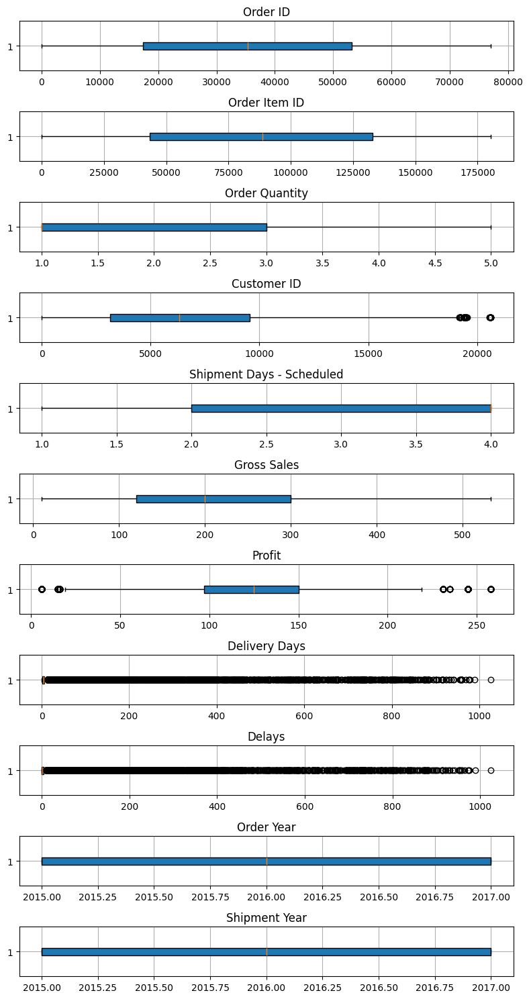

In [40]:
import matplotlib.pyplot as plt
numeric_cols = df.select_dtypes(include=['number'])
fig, axes = plt.subplots(nrows=len(numeric_cols.columns), figsize=(8, 15))
for i, col in enumerate(numeric_cols.columns):
    axes[i].boxplot(df[col], vert=False, patch_artist=True)
    axes[i].set_title(col)
    axes[i].grid(True)
plt.tight_layout()
plt.show()

### **plot 6 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 6 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 40: data manipulation / transformation.

This cell data manipulation / transformation.

In [41]:
df = df.drop(columns=['Delivery Days'])

### Step 41: data manipulation / transformation.

This cell data manipulation / transformation.

In [42]:
df = df[df['Shipment Mode'] != 'Same Day']
print(df)

       Order ID  Order Item ID Order Time  Order Quantity Product Department  \
0          3535           8793      14:07               1           Fan Shop   
1          4133          10320      07:37               1           Fan Shop   
2          7396          18517      22:47               1           Fan Shop   
3         11026          27608      22:32               1           Fan Shop   
4         11026          27609      22:32               1           Fan Shop   
...         ...            ...        ...             ...                ...   
24877     73373         176688      01:28               1           Fan Shop   
24879     73223         176538      20:55               1           Fan Shop   
24880     73246         176561      04:59               1           Fan Shop   
24881     63308         158284      03:15               1           Fan Shop   
24882     67951         169874      21:54               1           Fan Shop   

      Product Category                 

### Step 42: data manipulation / transformation.

This cell data manipulation / transformation.

In [43]:
print(df.shape)

(23312, 24)


### Step 43: generate visualization.

This cell generate visualization.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\788791937.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=delay_counts.index, y=delay_counts.values, palette=["green", "red"])


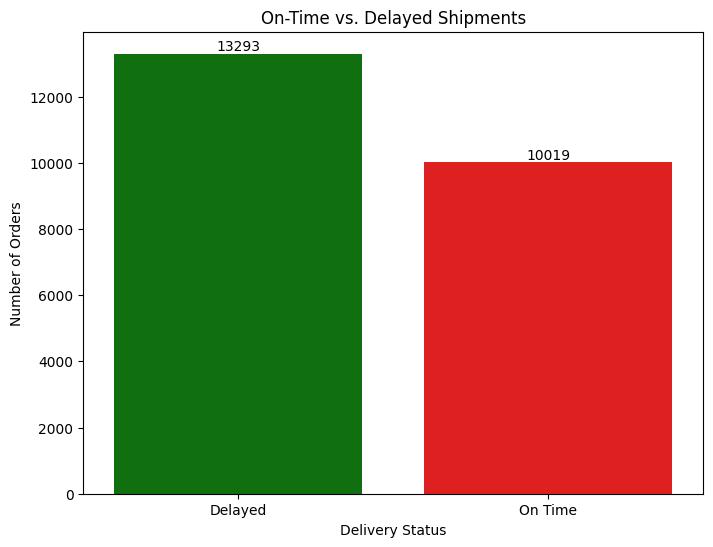

In [44]:
df['Delay Category'] = df['Delays'].apply(lambda x: 'On Time' if x == 0 else 'Delayed')
delay_counts = df['Delay Category'].value_counts()
plt.figure(figsize=(8, 6))
ax = sns.barplot(x=delay_counts.index, y=delay_counts.values, palette=['green', 'red'])
for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}', ha='center', va='bottom')
plt.xlabel('Delivery Status')
plt.ylabel('Number of Orders')
plt.title('On-Time vs. Delayed Shipments')
plt.show()

### **plot 7 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 7 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 44: generate visualization.

This cell generate visualization.

In [45]:
""" # Categorize shipments as 'On Time' or 'Delayed'
df["Delay Category"] = df["Delays"].apply(lambda x: "On Time" if x == 0 else "Delayed")

# Count occurrences
delay_counts = df["Delay Category"].value_counts()

# Plot bar chart
plt.figure(figsize=(8, 6))
sns.barplot(x=delay_counts.index, y=delay_counts.values, palette=["green", "red"])
plt.xlabel("Delivery Status")
plt.ylabel("Number of Orders")
plt.title("On-Time vs. Delayed Shipments")
plt.show() """

' # Categorize shipments as \'On Time\' or \'Delayed\'\ndf["Delay Category"] = df["Delays"].apply(lambda x: "On Time" if x == 0 else "Delayed")\n\n# Count occurrences\ndelay_counts = df["Delay Category"].value_counts()\n\n# Plot bar chart\nplt.figure(figsize=(8, 6))\nsns.barplot(x=delay_counts.index, y=delay_counts.values, palette=["green", "red"])\nplt.xlabel("Delivery Status")\nplt.ylabel("Number of Orders")\nplt.title("On-Time vs. Delayed Shipments")\nplt.show() '

### **plot 8 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 8 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 45: data manipulation / transformation.

This cell data manipulation / transformation.

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23312 entries, 0 to 24882
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Order ID                   23312 non-null  int32         
 1   Order Item ID              23312 non-null  int32         
 2   Order Time                 23312 non-null  object        
 3   Order Quantity             23312 non-null  int32         
 4   Product Department         23312 non-null  object        
 5   Product Category           23312 non-null  object        
 6   Product Name               23312 non-null  object        
 7   Customer ID                23312 non-null  int32         
 8   Customer Market            23312 non-null  object        
 9   Customer Region            23312 non-null  object        
 10  Customer Country           23312 non-null  object        
 11  Warehouse Country          23312 non-null  object        
 12  Shipment 

### Step 46: data manipulation / transformation.

This cell data manipulation / transformation.

In [47]:
q1_order = df['Order Date'].quantile(0.25)
q3_order = df['Order Date'].quantile(0.75)
iqr_order = q3_order - q1_order
q1_shipment = df['Shipment Date'].quantile(0.25)
q3_shipment = df['Shipment Date'].quantile(0.75)
iqr_shipment = q3_shipment - q1_shipment
lower_bound_order = q1_order - 1.5 * iqr_order
upper_bound_order = q3_order + 1.5 * iqr_order
lower_bound_shipment = q1_shipment - 1.5 * iqr_shipment
upper_bound_shipment = q3_shipment + 1.5 * iqr_shipment
outliers_order = df[(df['Order Date'] < lower_bound_order) | (df['Order Date'] > upper_bound_order)]
outliers_shipment = df[(df['Shipment Date'] < lower_bound_shipment) | (df['Shipment Date'] > upper_bound_shipment)]
(q1_order, q3_order, iqr_order, lower_bound_order, upper_bound_order, len(outliers_order), q1_shipment, q3_shipment, iqr_shipment, lower_bound_shipment, upper_bound_shipment, len(outliers_shipment))

(Timestamp('2015-08-21 00:00:00'),
 Timestamp('2017-01-27 00:00:00'),
 Timedelta('525 days 00:00:00'),
 Timestamp('2013-06-24 12:00:00'),
 Timestamp('2019-03-25 12:00:00'),
 0,
 Timestamp('2015-10-12 00:00:00'),
 Timestamp('2017-03-17 00:00:00'),
 Timedelta('522 days 00:00:00'),
 Timestamp('2013-08-20 00:00:00'),
 Timestamp('2019-05-09 00:00:00'),
 0)

### Step 47: generate visualization.

This cell generate visualization.

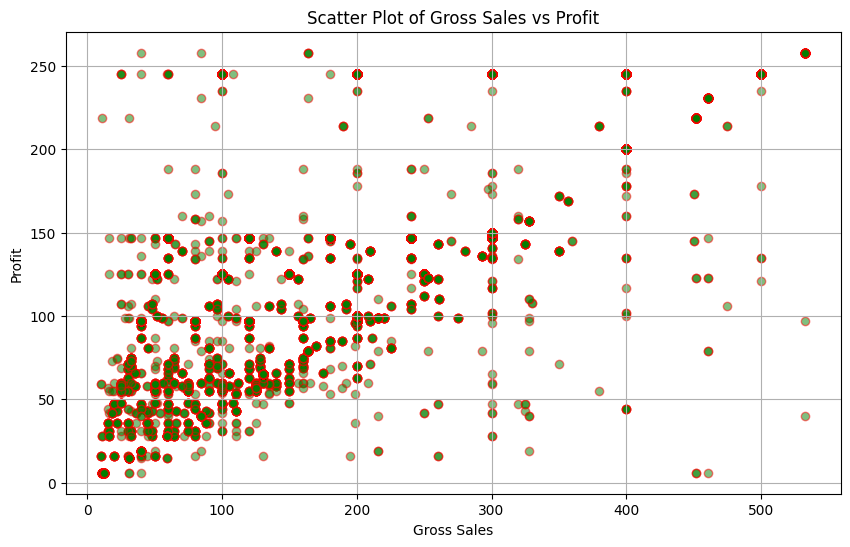

In [48]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Gross Sales'], df['Profit'], alpha=0.5, c='green', edgecolors='red')
plt.xlabel('Gross Sales')
plt.ylabel('Profit')
plt.title('Scatter Plot of Gross Sales vs Profit')
plt.grid(True)
plt.show()

### **plot 9 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 9 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 48: generate visualization.

This cell generate visualization.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\1382153577.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([df["Gross Sales"], df["Profit"]], labels=["Gross Sales", "Profit"], patch_artist=True)


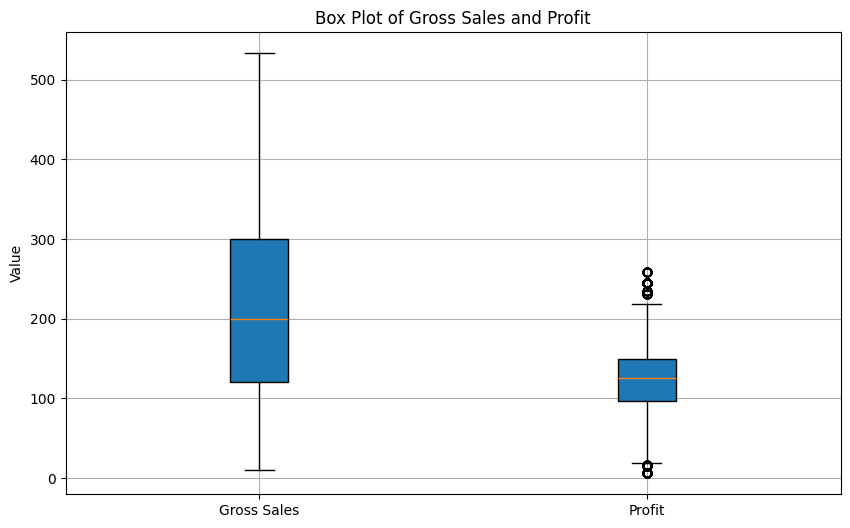

In [49]:
plt.figure(figsize=(10, 6))
plt.boxplot([df['Gross Sales'], df['Profit']], labels=['Gross Sales', 'Profit'], patch_artist=True)
plt.title('Box Plot of Gross Sales and Profit')
plt.ylabel('Value')
plt.grid(True)
plt.show()

### **plot 10 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 10 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 49: generate visualization.

This cell generate visualization.

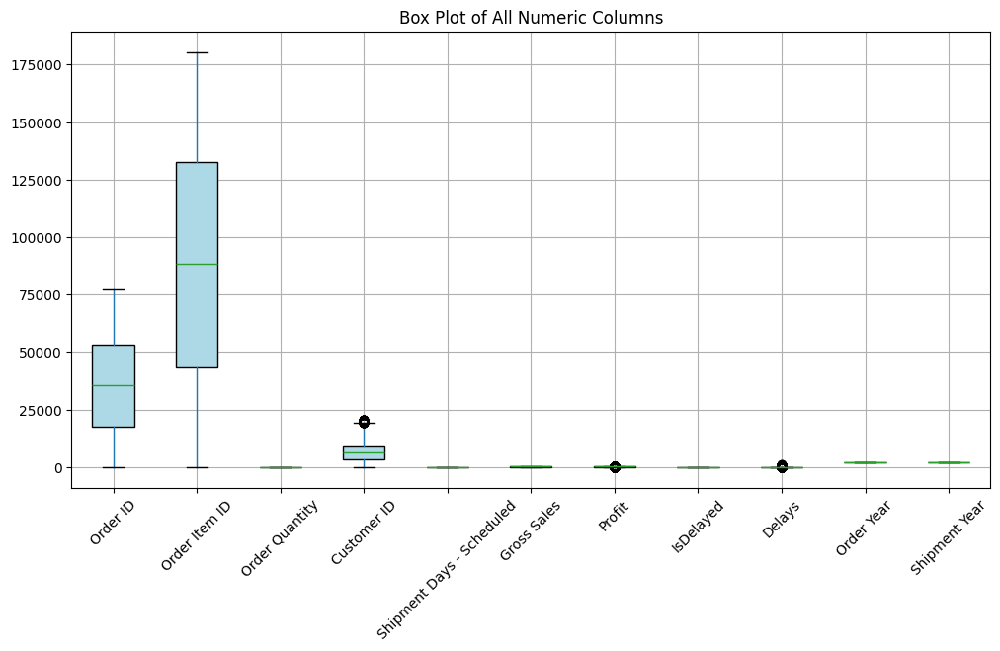

In [50]:
plt.figure(figsize=(12, 6))
df.boxplot(rot=45, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Box Plot of All Numeric Columns')
plt.grid(True)
plt.show()

### **plot 11 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 11 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 50: generate visualization.

This cell generate visualization.

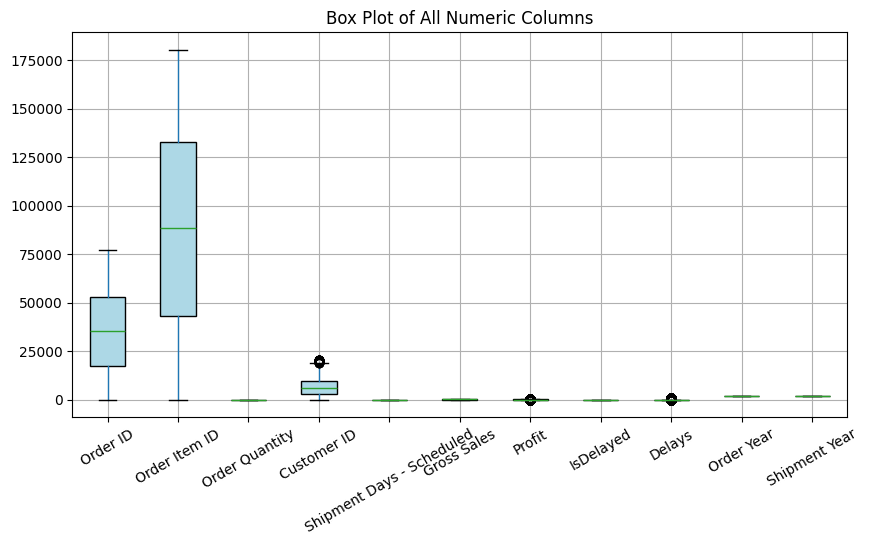

In [51]:
plt.figure(figsize=(10, 5))
df.boxplot(rot=30, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.title('Box Plot of All Numeric Columns')
plt.grid(True)
plt.show()

### **plot 12 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 12 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 51: generate visualization.

This cell generate visualization.

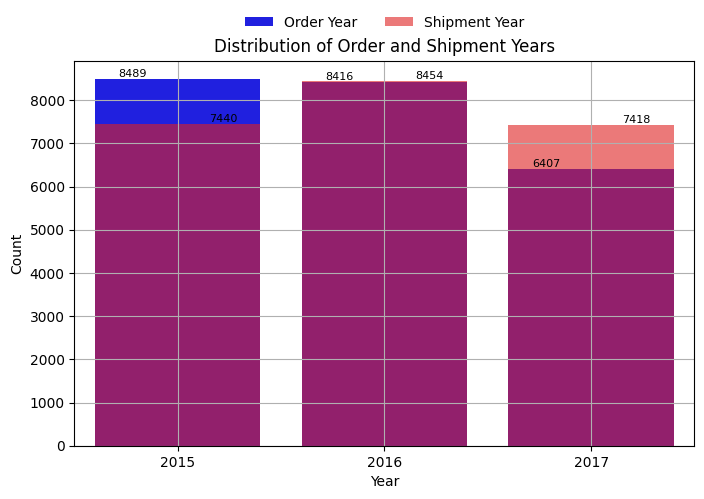

In [52]:
plt.figure(figsize=(8, 5))
sns.countplot(x=df['Order Year'], color='blue', label='Order Year')
sns.countplot(x=df['Shipment Year'], color='red', label='Shipment Year', alpha=0.6)
ax = plt.gca()
bar_positions = {}
for bar in ax.patches:
    x_center = round(bar.get_x() + bar.get_width() / 2, 2)
    height = bar.get_height()
    if x_center in bar_positions:
        ax.text(x_center + 0.15, height, f'{int(height)}', ha='left', va='bottom', fontsize=8)
    else:
        ax.text(x_center - 0.15, height, f'{int(height)}', ha='right', va='bottom', fontsize=8)
        bar_positions[x_center] = True
plt.title('Distribution of Order and Shipment Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=2, frameon=False)
plt.grid(True)
plt.show()

### **plot 13 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 13 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 52: generate visualization.

This cell generate visualization.

In [53]:
"""plt.figure(figsize=(8, 5))

# Count plot for Order Year
sns.countplot(x=df["Order Year"], color='blue', label="Order Year")

# Count plot for Shipment Year
sns.countplot(x=df["Shipment Year"], color='red', label="Shipment Year", alpha=0.6)

plt.title("Distribution of Order and Shipment Years")
plt.xlabel("Year")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

plt.show()  """

'plt.figure(figsize=(8, 5))\n\n# Count plot for Order Year\nsns.countplot(x=df["Order Year"], color=\'blue\', label="Order Year")\n\n# Count plot for Shipment Year\nsns.countplot(x=df["Shipment Year"], color=\'red\', label="Shipment Year", alpha=0.6)\n\nplt.title("Distribution of Order and Shipment Years")\nplt.xlabel("Year")\nplt.ylabel("Count")\nplt.legend()\nplt.grid(True)\n\nplt.show()  '

### **plot 14 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 14 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 53: data manipulation / transformation.

This cell data manipulation / transformation.

In [54]:
def find_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]
outliers_order_year = find_outliers(df, 'Order Year')
outliers_shipment_year = find_outliers(df, 'Shipment Year')
print('Outliers in Order Year:\n', outliers_order_year)
print('Outliers in Shipment Year:\n', outliers_shipment_year)

Outliers in Order Year:
 Empty DataFrame
Columns: [Order ID, Order Item ID, Order Time, Order Quantity, Product Department, Product Category, Product Name, Customer ID, Customer Market, Customer Region, Customer Country, Warehouse Country, Shipment Mode, Shipment Days - Scheduled, Gross Sales, Discount %, Profit, Order Date, Shipment Date, Product ID, IsDelayed, Delays, Order Year, Shipment Year, Delay Category]
Index: []

[0 rows x 25 columns]
Outliers in Shipment Year:
 Empty DataFrame
Columns: [Order ID, Order Item ID, Order Time, Order Quantity, Product Department, Product Category, Product Name, Customer ID, Customer Market, Customer Region, Customer Country, Warehouse Country, Shipment Mode, Shipment Days - Scheduled, Gross Sales, Discount %, Profit, Order Date, Shipment Date, Product ID, IsDelayed, Delays, Order Year, Shipment Year, Delay Category]
Index: []

[0 rows x 25 columns]


### Step 54: generate visualization.

This cell generate visualization.

Outliers in Order Year:
 Empty DataFrame
Columns: [Order ID, Order Item ID, Order Time, Order Quantity, Product Department, Product Category, Product Name, Customer ID, Customer Market, Customer Region, Customer Country, Warehouse Country, Shipment Mode, Shipment Days - Scheduled, Gross Sales, Discount %, Profit, Order Date, Shipment Date, Product ID, IsDelayed, Delays, Order Year, Shipment Year, Delay Category, Shipment Day]
Index: []

[0 rows x 26 columns]
Outliers in Shipment Year:
 Empty DataFrame
Columns: [Order ID, Order Item ID, Order Time, Order Quantity, Product Department, Product Category, Product Name, Customer ID, Customer Market, Customer Region, Customer Country, Warehouse Country, Shipment Mode, Shipment Days - Scheduled, Gross Sales, Discount %, Profit, Order Date, Shipment Date, Product ID, IsDelayed, Delays, Order Year, Shipment Year, Delay Category, Shipment Day]
Index: []

[0 rows x 26 columns]


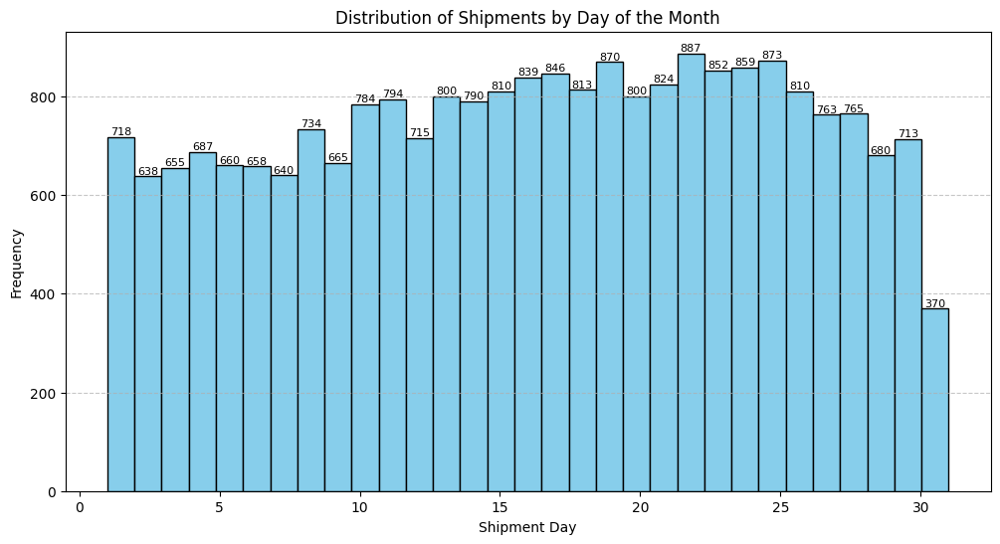

In [55]:
df['Shipment Day'] = df['Shipment Date'].dt.day

def find_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]
outliers_order_year = find_outliers(df, 'Order Year')
outliers_shipment_year = find_outliers(df, 'Shipment Year')
print('Outliers in Order Year:\n', outliers_order_year)
print('Outliers in Shipment Year:\n', outliers_shipment_year)
plt.figure(figsize=(12, 6))
n, bins, patches = plt.hist(df['Shipment Day'], bins=31, color='skyblue', edgecolor='black')
for i in range(len(bins) - 1):
    plt.text((bins[i] + bins[i + 1]) / 2, n[i] + 0.5, f'{int(n[i])}', ha='center', va='bottom', fontsize=8)
plt.xlabel('Shipment Day')
plt.ylabel('Frequency')
plt.title('Distribution of Shipments by Day of the Month')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### **plot 15 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 15 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 55: generate visualization.

This cell generate visualization.

In [56]:
""" # Extract Shipment Day
df["Shipment Day"] = df["Shipment Date"].dt.day

# Function to detect outliers using IQR
def find_outliers(df, column):
    Q1 = df[column].quantile(0.25)  # 25th percentile
    Q3 = df[column].quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

# Find outliers in Order Year and Shipment Year
outliers_order_year = find_outliers(df, "Order Year")
outliers_shipment_year = find_outliers(df, "Shipment Year")

# Print detected outliers
print("Outliers in Order Year:
", outliers_order_year)
print("Outliers in Shipment Year:
", outliers_shipment_year)

# Plot the distribution of Shipment Day
plt.figure(figsize=(8, 5))
plt.hist(df["Shipment Day"], bins=31, color="skyblue", edgecolor="black")
plt.xlabel("Shipment Day")
plt.ylabel("Frequency")
plt.title("Distribution of Shipments by Day of the Month")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()
"""

' # Extract Shipment Day\ndf["Shipment Day"] = df["Shipment Date"].dt.day\n\n# Function to detect outliers using IQR\ndef find_outliers(df, column):\n    Q1 = df[column].quantile(0.25)  # 25th percentile\n    Q3 = df[column].quantile(0.75)  # 75th percentile\n    IQR = Q3 - Q1  # Interquartile range\n    lower_bound = Q1 - 1.5 * IQR\n    upper_bound = Q3 + 1.5 * IQR\n    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]\n\n# Find outliers in Order Year and Shipment Year\noutliers_order_year = find_outliers(df, "Order Year")\noutliers_shipment_year = find_outliers(df, "Shipment Year")\n\n# Print detected outliers\nprint("Outliers in Order Year:\n", outliers_order_year)\nprint("Outliers in Shipment Year:\n", outliers_shipment_year)\n\n# Plot the distribution of Shipment Day\nplt.figure(figsize=(8, 5))\nplt.hist(df["Shipment Day"], bins=31, color="skyblue", edgecolor="black")\nplt.xlabel("Shipment Day")\nplt.ylabel("Frequency")\nplt.title("Distribution of Shipments by Day

### **plot 16 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 16 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 56: data manipulation / transformation.

This cell data manipulation / transformation.

In [57]:
df = df[df['Shipment Mode'] != 'Same Day']
df

,Order ID,Order Item ID,Order Time,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,...,Profit,Order Date,Shipment Date,Product ID,IsDelayed,Delays,Order Year,Shipment Year,Delay Category,Shipment Day
0,3535,8793,14:07,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,...,200,2015-02-21,2015-02-27,3535-8793,True,2.0,2015,2015,Delayed,27
1,4133,10320,07:37,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,...,200,2015-03-02,2015-03-06,4133-10320,False,0.0,2015,2015,On Time,6
2,7396,18517,22:47,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Northern Europe,...,200,2015-04-18,2015-04-20,7396-18517,False,0.0,2015,2015,On Time,20
3,11026,27608,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,...,200,2015-06-10,2015-06-12,11026-27608,False,0.0,2015,2015,On Time,12
4,11026,27609,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,...,200,2015-06-10,2015-06-12,11026-27609,False,0.0,2015,2015,On Time,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24877,73373,176688,01:28,1,Fan Shop,Toys,Toys,16926,Pacific Asia,Oceania,...,6,2017-12-07,2017-12-10,73373-176688,True,1.0,2017,2017,Delayed,10
24879,73223,176538,20:55,1,Fan Shop,Toys,Toys,16776,Pacific Asia,Southeast Asia,...,6,2017-12-04,2017-12-10,73223-176538,True,2.0,2017,2017,Delayed,10
24880,73246,176561,04:59,1,Fan Shop,Toys,Toys,16799,Pacific Asia,South America,...,6,2017-12-05,2017-12-11,73246-176561,True,2.0,2017,2017,Delayed,11
24881,63308,158284,03:15,1,Fan Shop,Water Sports,insta-bed Neverflat Air Mattress,5733,Europe,Western Europe,...,60,2017-07-13,2017-07-17,63308-158284,True,2.0,2017,2017,Delayed,17


### Step 57: generate visualization.

This cell generate visualization.

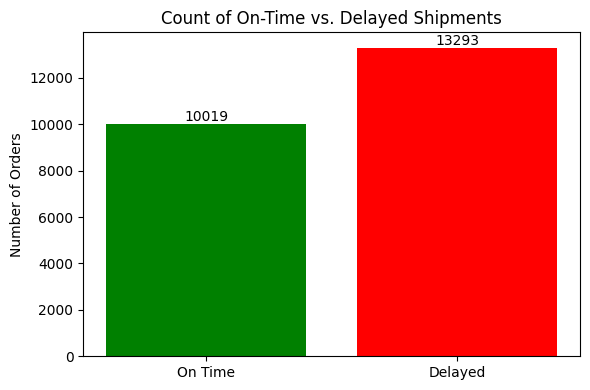

In [58]:
on_time_count = (df['Delays'] == 0).sum()
delayed_count = (df['Delays'] > 0).sum()
plt.figure(figsize=(6, 4))
bars = plt.bar(['On Time', 'Delayed'], [on_time_count, delayed_count], color=['green', 'red'])
plt.title('Count of On-Time vs. Delayed Shipments')
plt.ylabel('Number of Orders')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 1, str(height), ha='center', va='bottom')
plt.tight_layout()
plt.show()

### **plot 17 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 17 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 58: generate visualization.

This cell generate visualization.

In [59]:
"""# Count the number of on-time (0 delay) and delayed shipments
on_time_count = (df["Delays"] == 0).sum()
delayed_count = (df["Delays"] > 0).sum()

# Print the counts (optional)
print("On Time Count:", on_time_count)
print("Delayed Count:", delayed_count)

# Create a bar chart
plt.figure(figsize=(6, 4))
plt.bar(["On Time", "Delayed"], [on_time_count, delayed_count], color=["green", "red"])
plt.title("Count of On-Time vs. Delayed Shipments")
plt.ylabel("Number of Orders")
plt.show() """

'# Count the number of on-time (0 delay) and delayed shipments\non_time_count = (df["Delays"] == 0).sum()\ndelayed_count = (df["Delays"] > 0).sum()\n\n# Print the counts (optional)\nprint("On Time Count:", on_time_count)\nprint("Delayed Count:", delayed_count)\n\n# Create a bar chart\nplt.figure(figsize=(6, 4))\nplt.bar(["On Time", "Delayed"], [on_time_count, delayed_count], color=["green", "red"])\nplt.title("Count of On-Time vs. Delayed Shipments")\nplt.ylabel("Number of Orders")\nplt.show() '

### **plot 18 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 18 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 59: data manipulation / transformation.

This cell data manipulation / transformation.

In [60]:
print(df['Delays'].describe())

count    23312.000000
mean        39.782044
std        121.982578
min          0.000000
25%          0.000000
50%          1.000000
75%          4.000000
max       1025.000000
Name: Delays, dtype: float64


### Step 60: generate visualization.

This cell generate visualization.

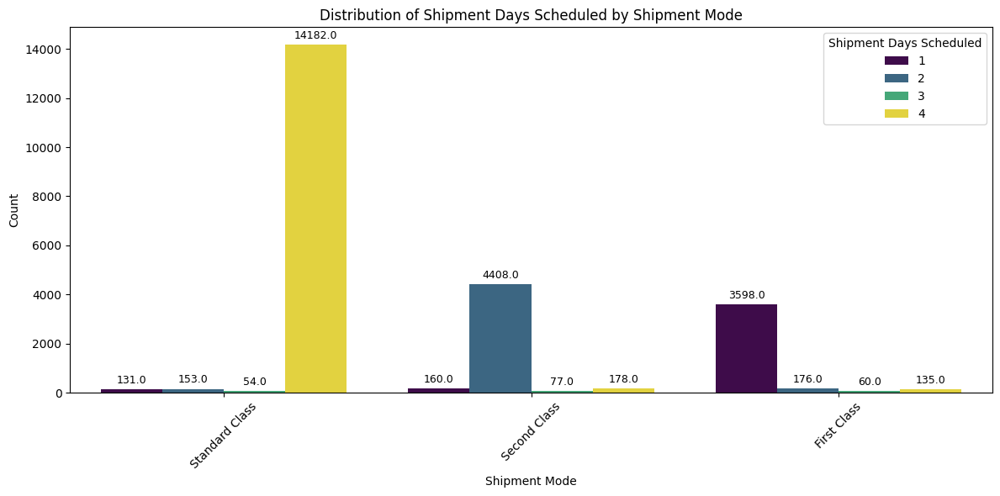

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
ax = sns.countplot(x='Shipment Mode', hue='Shipment Days - Scheduled', data=df, palette='viridis')
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='bottom', fontsize=9, color='black', xytext=(0, 3), textcoords='offset points')
plt.xlabel('Shipment Mode')
plt.ylabel('Count')
plt.title('Distribution of Shipment Days Scheduled by Shipment Mode')
plt.xticks(rotation=45)
plt.legend(title='Shipment Days Scheduled')
plt.tight_layout()
plt.show()

### **plot 19 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 19 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 61: generate visualization.

This cell generate visualization.

In [62]:
"""# Set figure size
plt.figure(figsize=(12, 6))

# Create a bar chart showing the count of each shipment days scheduled per shipment mode
sns.countplot(x="Shipment Mode", hue="Shipment Days - Scheduled", data=df, palette="viridis")

# Labels and title
plt.xlabel("Shipment Mode")
plt.ylabel("Count")
plt.title("Distribution of Shipment Days Scheduled by Shipment Mode")
plt.xticks(rotation=45)

# Show the legend
plt.legend(title="Shipment Days Scheduled")

# Show the plot
plt.show() """

'# Set figure size\nplt.figure(figsize=(12, 6))\n\n# Create a bar chart showing the count of each shipment days scheduled per shipment mode\nsns.countplot(x="Shipment Mode", hue="Shipment Days - Scheduled", data=df, palette="viridis")\n\n# Labels and title\nplt.xlabel("Shipment Mode")\nplt.ylabel("Count")\nplt.title("Distribution of Shipment Days Scheduled by Shipment Mode")\nplt.xticks(rotation=45)\n\n# Show the legend\nplt.legend(title="Shipment Days Scheduled")\n\n# Show the plot\nplt.show() '

### **plot 20 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 20 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 62: data manipulation / transformation.

This cell data manipulation / transformation.

In [63]:
q1 = df['Profit'].quantile(0.3)
q3 = df['Profit'].quantile(0.7)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
outliers = df[(df['Profit'] < lower_bound) | (df['Profit'] > upper_bound)]
print(outliers)

       Order ID  Order Item ID Order Time  Order Quantity Product Department  \
377        5536          13821      19:09               1           Footwear   
378       17003          42514      04:33               1           Footwear   
379       17316          43281      18:12               1           Footwear   
381        1563           8795      14:07               1           Footwear   
382        4728           8795      14:07               1           Footwear   
...         ...            ...        ...             ...                ...   
24874     73323         176638      07:57               1           Fan Shop   
24875     73331         176646      10:45               1           Fan Shop   
24877     73373         176688      01:28               1           Fan Shop   
24879     73223         176538      20:55               1           Fan Shop   
24880     73246         176561      04:59               1           Fan Shop   

       Product Category                

### Step 63: generate visualization.

This cell generate visualization.

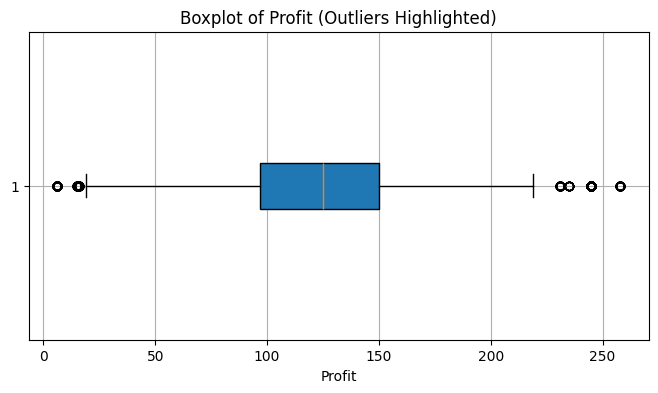

In [64]:
plt.figure(figsize=(8, 4))
plt.boxplot(df['Profit'], vert=False, patch_artist=True)
plt.title('Boxplot of Profit (Outliers Highlighted)')
plt.xlabel('Profit')
plt.grid(True)
plt.show()

### **plot 21 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 21 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 64: data manipulation / transformation.

This cell data manipulation / transformation.

In [65]:
max_profit = df['Profit'].max()
print('Maximum Profit:', max_profit)

Maximum Profit: 258


### Step 65: data manipulation / transformation.

This cell data manipulation / transformation.

In [66]:
q1 = df['Profit'].quantile(0.25)
q2 = df['Profit'].quantile(0.5)
q3 = df['Profit'].quantile(0.75)
qmax = df['Profit'].quantile(1.0)
print('Q1 (25th percentile):', q1)
print('Q2 (50th percentile / Median):', q2)
print('Q3 (75th percentile):', q3)
print('Qmax (100th percentile):', qmax)

Q1 (25th percentile): 97.0
Q2 (50th percentile / Median): 125.0
Q3 (75th percentile): 150.0
Qmax (100th percentile): 258.0


### Step 66: data manipulation / transformation.

This cell data manipulation / transformation.

In [67]:
print(df.columns)

Index(['Order ID', 'Order Item ID', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name', 'Customer ID',
       'Customer Market', 'Customer Region', 'Customer Country',
       'Warehouse Country', 'Shipment Mode', 'Shipment Days - Scheduled',
       'Gross Sales', 'Discount %', 'Profit', 'Order Date', 'Shipment Date',
       'Product ID', 'IsDelayed', 'Delays', 'Order Year', 'Shipment Year',
       'Delay Category', 'Shipment Day'],
      dtype='object')


### Step 67: generate visualization.

This cell generate visualization.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\2650335981.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='delay_category', data=df, palette={'Above 120': 'red', '120 or Below': 'blue'})


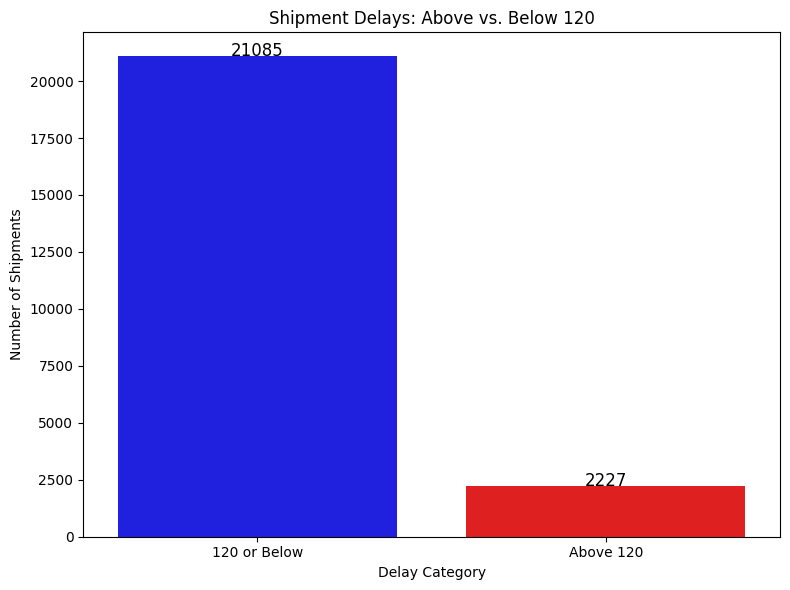

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
if 'Delays' not in df.columns:
    raise ValueError("The CSV does not contain a 'Delays' column.")
df['delay_category'] = df['Delays'].apply(lambda x: 'Above 120' if x > 120 else '120 or Below')
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='delay_category', data=df, palette={'Above 120': 'red', '120 or Below': 'blue'})
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.0, height + 1, int(height), ha='center', fontsize=12)
plt.title('Shipment Delays: Above vs. Below 120')
plt.xlabel('Delay Category')
plt.ylabel('Number of Shipments')
plt.tight_layout()
plt.show()

### **plot 22 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 22 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 68: generate visualization.

This cell generate visualization.

In [69]:
"""# Ensure 'Delays' column exists
if 'Delays' not in df.columns:  # Display all column names
    raise ValueError("The CSV does not contain a 'Delays' column.")

# Categorize the shipments based on delay (Threshold: 120)
df['delay_category'] = df['Delays'].apply(lambda x: 'Above 120' if x > 120 else '120 or Below')

# Plot the counts using seaborn
plt.figure(figsize=(8, 6))
sns.countplot(x='delay_category', data=df, palette={'Above 120': 'red', '120 or Below': 'blue'})

# Customize the plot
plt.title('Shipment Delays: Above vs. Below 120')
plt.xlabel('Delay Category')
plt.ylabel('Number of Shipments')
plt.show()"""

'# Ensure \'Delays\' column exists\nif \'Delays\' not in df.columns:  # Display all column names\n    raise ValueError("The CSV does not contain a \'Delays\' column.")\n\n# Categorize the shipments based on delay (Threshold: 120)\ndf[\'delay_category\'] = df[\'Delays\'].apply(lambda x: \'Above 120\' if x > 120 else \'120 or Below\')\n\n# Plot the counts using seaborn\nplt.figure(figsize=(8, 6))\nsns.countplot(x=\'delay_category\', data=df, palette={\'Above 120\': \'red\', \'120 or Below\': \'blue\'})\n\n# Customize the plot\nplt.title(\'Shipment Delays: Above vs. Below 120\')\nplt.xlabel(\'Delay Category\')\nplt.ylabel(\'Number of Shipments\')\nplt.show()'

### **plot 23 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 23 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 69: data manipulation / transformation.

This cell data manipulation / transformation.

In [70]:
if 'Delays' not in df.columns:
    raise ValueError("The CSV does not contain a 'Delays' column.")
df = df[df['Delays'] <= 120]
df.reset_index(drop=True, inplace=True)
print('Updated dataset shape:', df.shape)

Updated dataset shape: (21085, 27)


### Step 70: generate visualization.

This cell generate visualization.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\2570868718.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['delay_category'] = df['Delays'].apply(lambda x: 'Above 120' if x > 120 else '120 or Below')
C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\2570868718.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='delay_category', data=df, palette={'Above 120': 'red', '120 or Below': 'blue'})


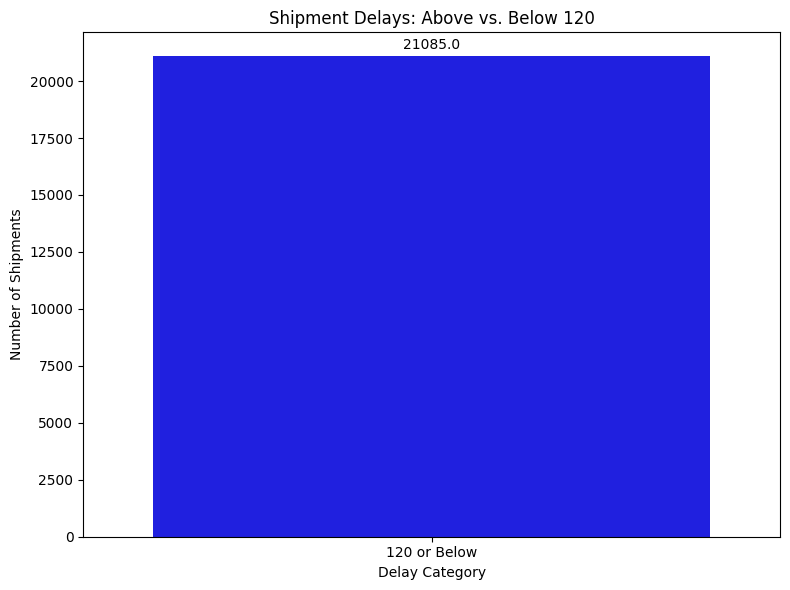

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
if 'Delays' not in df.columns:
    raise ValueError("The CSV does not contain a 'Delays' column.")
df['delay_category'] = df['Delays'].apply(lambda x: 'Above 120' if x > 120 else '120 or Below')
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='delay_category', data=df, palette={'Above 120': 'red', '120 or Below': 'blue'})
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='bottom', fontsize=10, xytext=(0, 3), textcoords='offset points')
plt.title('Shipment Delays: Above vs. Below 120')
plt.xlabel('Delay Category')
plt.ylabel('Number of Shipments')
plt.tight_layout()
plt.show()

### **plot 24 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 24 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 71: generate visualization.

This cell generate visualization.

In [72]:
"""# Ensure 'Delays' column exists
if 'Delays' not in df.columns:  # Display all column names
    raise ValueError("The CSV does not contain a 'Delays' column.")

# Categorize the shipments based on delay (Threshold: 120)
df['delay_category'] = df['Delays'].apply(lambda x: 'Above 120' if x > 120 else '120 or Below')

# Plot the counts using seaborn
plt.figure(figsize=(8, 6))
sns.countplot(x='delay_category', data=df, palette={'Above 120': 'red', '120 or Below': 'blue'})

# Customize the plot
plt.title('Shipment Delays: Above vs. Below 120')
plt.xlabel('Delay Category')
plt.ylabel('Number of Shipments')
plt.show() """

'# Ensure \'Delays\' column exists\nif \'Delays\' not in df.columns:  # Display all column names\n    raise ValueError("The CSV does not contain a \'Delays\' column.")\n\n# Categorize the shipments based on delay (Threshold: 120)\ndf[\'delay_category\'] = df[\'Delays\'].apply(lambda x: \'Above 120\' if x > 120 else \'120 or Below\')\n\n# Plot the counts using seaborn\nplt.figure(figsize=(8, 6))\nsns.countplot(x=\'delay_category\', data=df, palette={\'Above 120\': \'red\', \'120 or Below\': \'blue\'})\n\n# Customize the plot\nplt.title(\'Shipment Delays: Above vs. Below 120\')\nplt.xlabel(\'Delay Category\')\nplt.ylabel(\'Number of Shipments\')\nplt.show() '

### **plot 25 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 25 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 72: data manipulation / transformation.

This cell data manipulation / transformation.

In [73]:
df.shape

(21085, 27)

### Step 73: data manipulation / transformation.

This cell data manipulation / transformation.

In [74]:
df.columns

Index(['Order ID', 'Order Item ID', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name', 'Customer ID',
       'Customer Market', 'Customer Region', 'Customer Country',
       'Warehouse Country', 'Shipment Mode', 'Shipment Days - Scheduled',
       'Gross Sales', 'Discount %', 'Profit', 'Order Date', 'Shipment Date',
       'Product ID', 'IsDelayed', 'Delays', 'Order Year', 'Shipment Year',
       'Delay Category', 'Shipment Day', 'delay_category'],
      dtype='object')

### Step 74: data manipulation / transformation.

This cell data manipulation / transformation.

In [75]:
df.dtypes

Order ID                              int32
Order Item ID                         int32
Order Time                           object
Order Quantity                        int32
Product Department                   object
Product Category                     object
Product Name                         object
Customer ID                           int32
Customer Market                      object
Customer Region                      object
Customer Country                     object
Warehouse Country                    object
Shipment Mode                        object
Shipment Days - Scheduled             int32
Gross Sales                           int32
Discount %                           object
Profit                                int32
Order Date                   datetime64[ns]
Shipment Date                datetime64[ns]
Product ID                           object
IsDelayed                              bool
Delays                              float64
Order Year                      

### 1
1.	Which region has the most orders and highest delays?

Features Involved:
* Customer region
* Shipment date
* Order date
* Delay (difference between order and shipping day)
* Order item ID

### Step 75: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [76]:
df_copy = df.copy()
df_copy.loc[:, 'Delays'] = pd.to_numeric(df_copy['Delays'], errors='coerce').fillna(0).astype(int)
region_summary = df_copy.groupby('Customer Region').agg(total_orders=('Order Item ID', 'count'), avg_delay=('Delays', 'mean')).reset_index()

### Step 76: generate visualization.

This cell generate visualization.

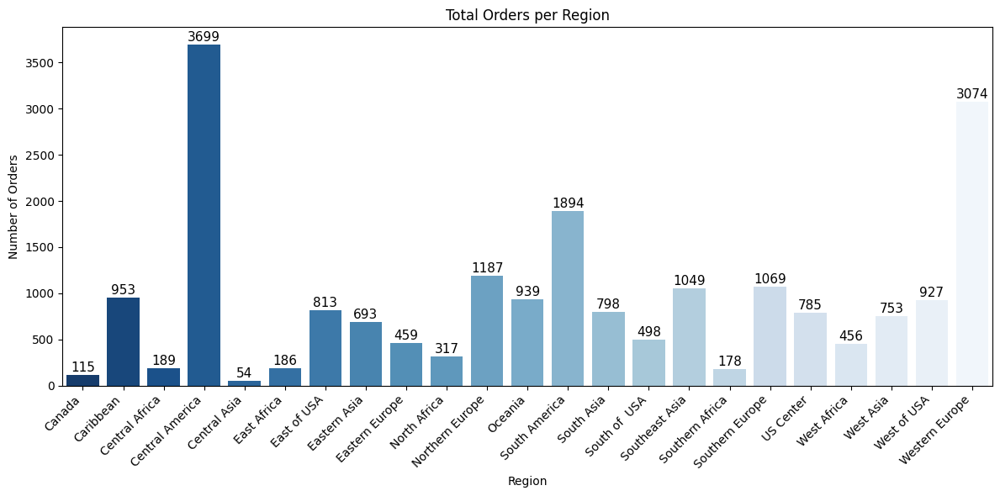

In [77]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Customer Region', y='total_orders', data=region_summary, hue='Customer Region', dodge=False, legend=False, palette='Blues_r')
plt.xticks(rotation=45, ha='right')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.0, height + max(region_summary['total_orders']) * 0.01, int(height), ha='center', fontsize=11)
plt.title('Total Orders per Region')
plt.xlabel('Region')
plt.ylabel('Number of Orders')
plt.tight_layout()
plt.show()

### **plot 26 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 26 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 77: generate visualization.

This cell generate visualization.

In [78]:
"""# Bar Chart: Total Orders per Region
# This chart displays the number of orders per region with enhanced spacing.

plt.figure(figsize=(12, 6))
sns.barplot(
    x='Customer Region',
    y='total_orders',
    data=region_summary,
    hue='Customer Region',
    dodge=False,
    legend=False,
    palette='Blues_r'
)
plt.xticks(rotation=45, ha='right')
plt.title('Total Orders per Region')
plt.xlabel('Region')
plt.ylabel('Number of Orders')
plt.tight_layout()  # Adjusts layout to prevent label cutoff
plt.show()
"""

"# Bar Chart: Total Orders per Region\n# This chart displays the number of orders per region with enhanced spacing.\n\nplt.figure(figsize=(12, 6))\nsns.barplot(\n    x='Customer Region',\n    y='total_orders',\n    data=region_summary,\n    hue='Customer Region',\n    dodge=False,\n    legend=False,\n    palette='Blues_r'\n)\nplt.xticks(rotation=45, ha='right')\nplt.title('Total Orders per Region')\nplt.xlabel('Region')\nplt.ylabel('Number of Orders')\nplt.tight_layout()  # Adjusts layout to prevent label cutoff\nplt.show()\n"

### **plot 27 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 27 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 78: generate visualization.

This cell generate visualization.

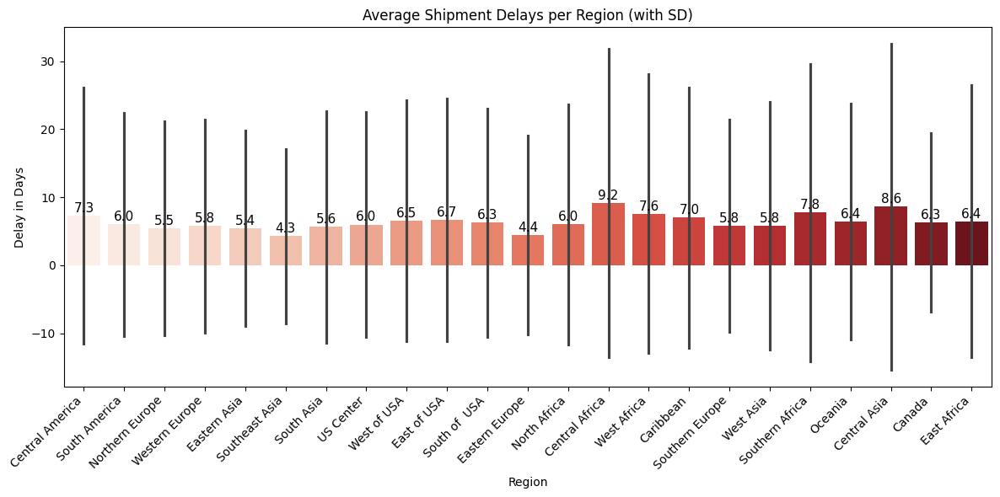

In [79]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='Customer Region', y='Delays', data=df_copy, hue='Customer Region', dodge=False, legend=False, palette='Reds', estimator=np.mean, errorbar='sd')
plt.xticks(rotation=45, ha='right')
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.0, height + 0.5, f'{height:.1f}', ha='center', fontsize=11)
plt.title('Average Shipment Delays per Region (with SD)')
plt.xlabel('Region')
plt.ylabel('Delay in Days')
plt.tight_layout()
plt.show()

### **plot 28 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 28 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 79: generate visualization.

This cell generate visualization.

In [80]:
"""# Bar Chart with Error Bars: Average Shipment Delays per Region
# This chart shows the average delay along with the standard deviation as error bars.

plt.figure(figsize=(12, 6))
sns.barplot(
    x='Customer Region',
    y='Delays',
    data=df_copy,
    hue='Customer Region',
    dodge=False,
    legend=False,
    palette='Reds',
    estimator=np.mean,
    errorbar='sd'  # Displays standard deviation as error bars
)
plt.xticks(rotation=45, ha='right')
plt.title('Average Shipment Delays per Region (with SD)')
plt.xlabel('Region')
plt.ylabel('Delay in Days')
plt.tight_layout()
plt.show() """

"# Bar Chart with Error Bars: Average Shipment Delays per Region\n# This chart shows the average delay along with the standard deviation as error bars.\n\nplt.figure(figsize=(12, 6))\nsns.barplot(\n    x='Customer Region',\n    y='Delays',\n    data=df_copy,\n    hue='Customer Region',\n    dodge=False,\n    legend=False,\n    palette='Reds',\n    estimator=np.mean,\n    errorbar='sd'  # Displays standard deviation as error bars\n)\nplt.xticks(rotation=45, ha='right')\nplt.title('Average Shipment Delays per Region (with SD)')\nplt.xlabel('Region')\nplt.ylabel('Delay in Days')\nplt.tight_layout()\nplt.show() "

### **plot 29 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 29 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 80: generate visualization.

This cell generate visualization.

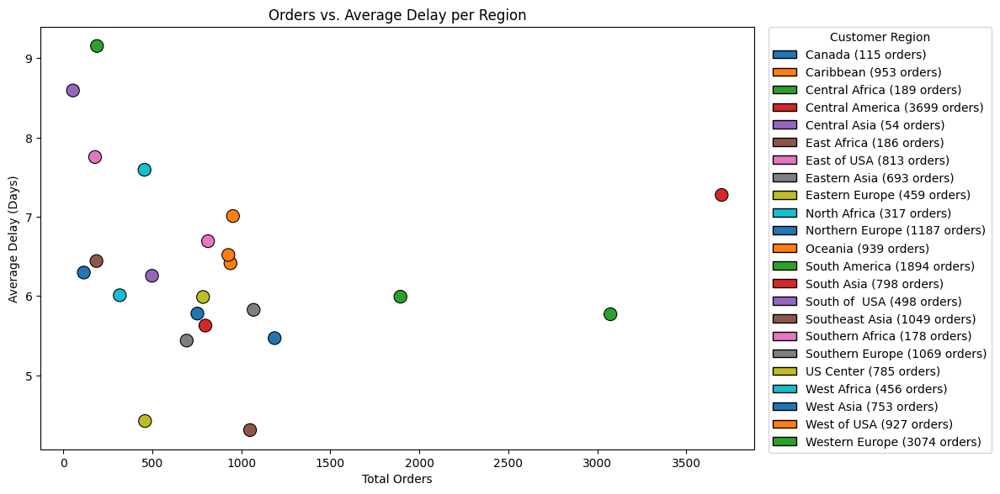

In [81]:
from matplotlib.patches import Patch
plt.figure(figsize=(12, 6))
palette = sns.color_palette('tab10', n_colors=len(region_summary))
region_colors = dict(zip(region_summary['Customer Region'], palette))
sns.scatterplot(x='total_orders', y='avg_delay', data=region_summary, hue='Customer Region', palette=region_colors, s=120, edgecolor='black', linewidth=0.8)
plt.title('Orders vs. Average Delay per Region')
plt.xlabel('Total Orders')
plt.ylabel('Average Delay (Days)')
custom_legend = [Patch(facecolor=region_colors[region], edgecolor='black', label=f'{region} ({orders} orders)') for region, orders in zip(region_summary['Customer Region'], region_summary['total_orders'])]
plt.legend(handles=custom_legend, title='Customer Region', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.tight_layout()
plt.show()

### **plot 30 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 30 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 81: generate visualization.

This cell generate visualization.

In [82]:
"""# Scatter Plot: Orders vs. Average Delay per Region
# This chart compares the total orders and the average delay across regions.

plt.figure(figsize=(12, 6))
scatter_plot = sns.scatterplot(
    x='total_orders',
    y='avg_delay',
    data=region_summary,
    hue='Customer Region',
    s=120,
    palette='tab10',
    edgecolor='black',
    linewidth=0.8
)
plt.title('Orders vs. Average Delay per Region')
plt.xlabel('Total Orders')
plt.ylabel('Average Delay (Days)')

# Position the legend on the side for clarity
plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    borderaxespad=0,
    title='Customer Region'
)

plt.tight_layout()
plt.show()
"""

"# Scatter Plot: Orders vs. Average Delay per Region\n# This chart compares the total orders and the average delay across regions.\n\nplt.figure(figsize=(12, 6))\nscatter_plot = sns.scatterplot(\n    x='total_orders',\n    y='avg_delay',\n    data=region_summary,\n    hue='Customer Region',\n    s=120,\n    palette='tab10',\n    edgecolor='black',\n    linewidth=0.8\n)\nplt.title('Orders vs. Average Delay per Region')\nplt.xlabel('Total Orders')\nplt.ylabel('Average Delay (Days)')\n\n# Position the legend on the side for clarity\nplt.legend(\n    bbox_to_anchor=(1.02, 1),\n    loc='upper left',\n    borderaxespad=0,\n    title='Customer Region'\n)\n\nplt.tight_layout()\nplt.show()\n"

### **plot 31 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 31 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 2
2. Does high order volume cause high delays in relation to the warehouse location?

Features Involved:

* Order ID

* Order date

* Delay

* Warehouse country

### Step 82: merge or join dataframes.

This cell merge or join dataframes.

In [83]:
df_copy = df.copy()
df_copy.loc[:, 'Order Month'] = df_copy['Order Date'].dt.to_period('M')
order_trend = df_copy.groupby(['Warehouse Country', 'Order Month'])['Order ID'].count().reset_index()
order_trend.rename(columns={'Order ID': 'Total Orders'}, inplace=True)
delay_trend = df_copy.groupby(['Warehouse Country', 'Order Month'])['Delays'].mean().reset_index()
delay_trend.rename(columns={'Delays': 'Average Delay'}, inplace=True)
warehouse_analysis = pd.merge(order_trend, delay_trend, on=['Warehouse Country', 'Order Month'])

### Step 83: generate visualization.

This cell generate visualization.

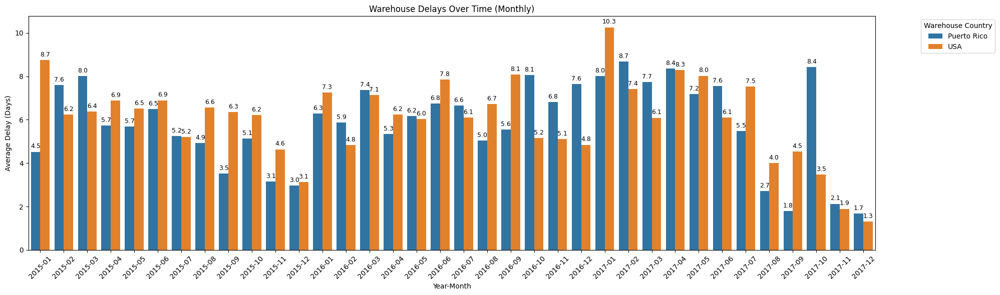

In [84]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20, 6))
ax = sns.barplot(data=warehouse_analysis, x='Order Month', y='Average Delay', hue='Warehouse Country', palette='tab10')
for p in ax.patches:
    height = p.get_height()
    if not pd.isna(height) and height > 0:
        ax.annotate(f'{height:.1f}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='bottom', fontsize=9, xytext=(0, 3), textcoords='offset points')
plt.title('Warehouse Delays Over Time (Monthly)')
plt.xlabel('Year-Month')
plt.ylabel('Average Delay (Days)')
plt.xticks(rotation=45)
plt.legend(title='Warehouse Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### **plot 32 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 32 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 84: generate visualization.

This cell generate visualization.

In [85]:
"""plt.figure(figsize=(14, 6))
sns.barplot(data=warehouse_analysis, x='Order Month', y='Average Delay', hue='Warehouse Country', palette='tab10')
plt.title("Warehouse Delays Over Time (Monthly)")
plt.xlabel("Year-Month")
plt.ylabel("Average Delay (Days)")
plt.xticks(rotation=45)
plt.legend(title="Warehouse Country", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
"""

'plt.figure(figsize=(14, 6))\nsns.barplot(data=warehouse_analysis, x=\'Order Month\', y=\'Average Delay\', hue=\'Warehouse Country\', palette=\'tab10\')\nplt.title("Warehouse Delays Over Time (Monthly)")\nplt.xlabel("Year-Month")\nplt.ylabel("Average Delay (Days)")\nplt.xticks(rotation=45)\nplt.legend(title="Warehouse Country", bbox_to_anchor=(1.05, 1), loc=\'upper left\')\nplt.tight_layout()\nplt.show()\n'

### **plot 33 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 33 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 85: generate visualization.

This cell generate visualization.

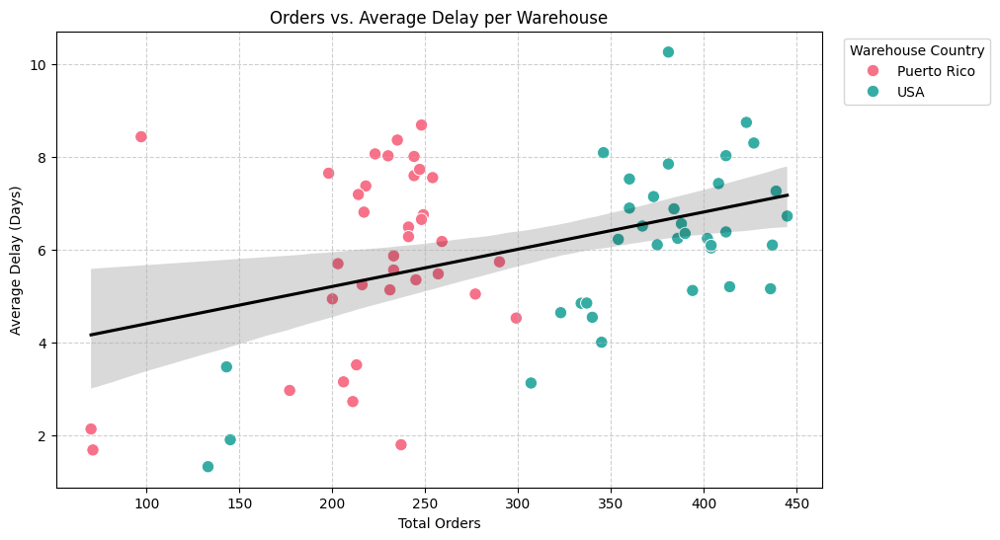

In [86]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Total Orders', y='Average Delay', hue='Warehouse Country', data=warehouse_analysis, s=80, palette='husl')
sns.regplot(x='Total Orders', y='Average Delay', data=warehouse_analysis, scatter=False, color='black')
plt.title('Orders vs. Average Delay per Warehouse')
plt.xlabel('Total Orders')
plt.ylabel('Average Delay (Days)')
plt.legend(title='Warehouse Country', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### **plot 34 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 34 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 3
3. How do shipping mode, warehouse country, and customer country affect shipments that exceed scheduled shipment days?

Features Involved:

* Delay

* Shipping mode

* Warehouse country

* Customer country

### Step 86: generate visualization.

This cell generate visualization.

In [87]:
df_copy = df.copy()
sns.set_theme(style='whitegrid')

### **plot 35 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 35 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 87: generate visualization.

This cell generate visualization.

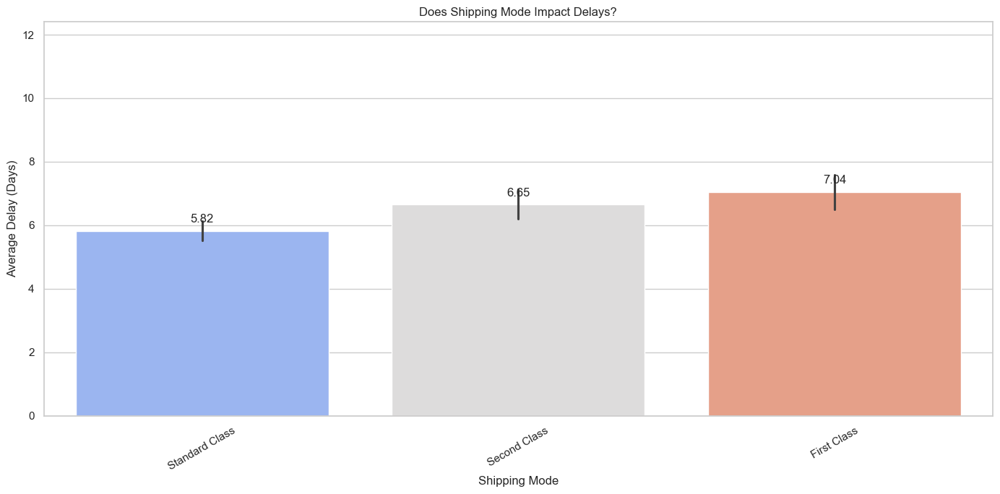

In [88]:
plt.figure(figsize=(14, 7))
sns.barplot(x='Shipment Mode', y='Delays', data=df_copy, estimator=np.mean, hue='Shipment Mode', palette='coolwarm', legend=False)
plt.title('Does Shipping Mode Impact Delays?')
plt.xlabel('Shipping Mode')
plt.ylabel('Average Delay (Days)')
plt.xticks(rotation=30)
plt.ylim(0, df_copy['Delays'].mean() * 2)
ax = plt.gca()
for bar in ax.patches:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.2, f'{height:.2f}', ha='center', va='bottom')
plt.tight_layout()
plt.show()

### **plot 36 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 36 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 88: generate visualization.

This cell generate visualization.

In [89]:
"""# Bar chart showing average delays by shipment mode
plt.figure(figsize=(14, 7))
sns.barplot(
    x="Shipment Mode",
    y="Delays",
    data=df_copy,
    estimator=np.mean,
    hue="Shipment Mode",  # Assign x variable to hue
    palette="coolwarm",
    legend=False
)
plt.title("Does Shipping Mode Impact Delays?")
plt.xlabel("Shipping Mode")
plt.ylabel("Average Delay (Days)")
plt.xticks(rotation=30)
plt.ylim(0, df_copy["Delays"].mean() * 2)
plt.tight_layout()
plt.show()
"""

'# Bar chart showing average delays by shipment mode\nplt.figure(figsize=(14, 7))\nsns.barplot(\n    x="Shipment Mode",\n    y="Delays",\n    data=df_copy,\n    estimator=np.mean,\n    hue="Shipment Mode",  # Assign x variable to hue\n    palette="coolwarm",\n    legend=False\n)\nplt.title("Does Shipping Mode Impact Delays?")\nplt.xlabel("Shipping Mode")\nplt.ylabel("Average Delay (Days)")\nplt.xticks(rotation=30)\nplt.ylim(0, df_copy["Delays"].mean() * 2)\nplt.tight_layout()\nplt.show()\n'

### **plot 37 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 37 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 89: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

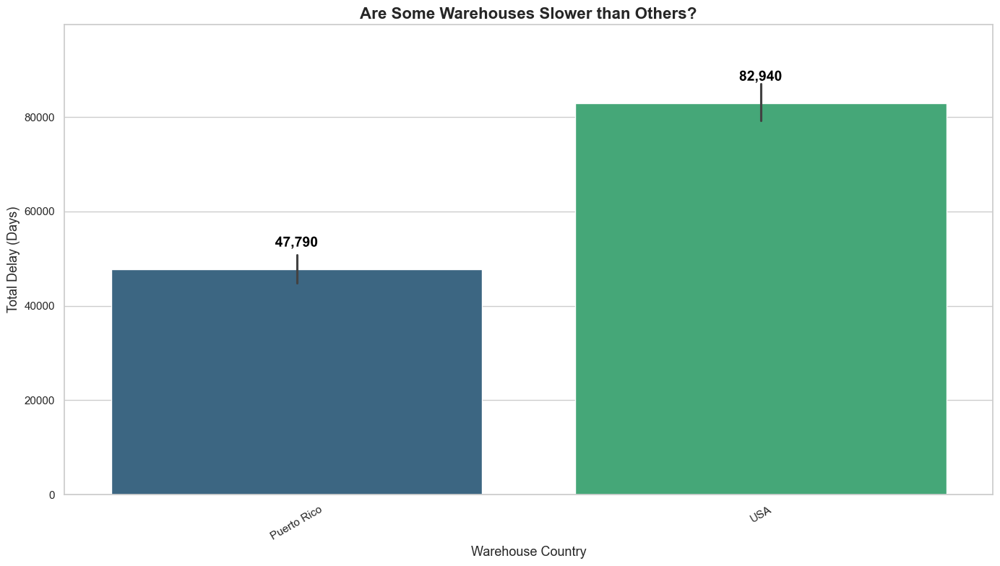

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patheffects import withStroke
max_delay = df_copy.groupby('Warehouse Country')['Delays'].sum().max()
plt.figure(figsize=(14, 8))
ax = sns.barplot(x='Warehouse Country', y='Delays', data=df_copy, estimator=np.sum, hue='Warehouse Country', palette='viridis', legend=False)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.0, height + max_delay * 0.05, f'{int(height):,}', ha='center', va='bottom', fontsize=14, fontweight='bold', color='black', path_effects=[withStroke(linewidth=3, foreground='white')])
plt.title('Are Some Warehouses Slower than Others?', fontsize=16, fontweight='bold')
plt.xlabel('Warehouse Country', fontsize=13)
plt.ylabel('Total Delay (Days)', fontsize=13)
plt.xticks(rotation=30)
plt.ylim(0, max_delay * 1.2)
plt.tight_layout()
plt.show()

### **plot 38 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 38 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 90: generate visualization.

This cell generate visualization.

In [91]:
"""# Bar chart showing average delays by warehouse country
plt.figure(figsize=(14, 7))
sns.barplot(
    x="Warehouse Country",
    y="Delays",
    data=df_copy,
    estimator=np.mean,
    hue="Warehouse Country",  # Assign x variable to hue
    palette="viridis",
    legend=False
)
plt.title("Are Some Warehouses Slower than Others?")
plt.xlabel("Warehouse Country")
plt.ylabel("Average Delay (Days)")
plt.xticks(rotation=30)
plt.ylim(0, df_copy["Delays"].mean() * 2)
plt.tight_layout()
plt.show()
"""

'# Bar chart showing average delays by warehouse country\nplt.figure(figsize=(14, 7))\nsns.barplot(\n    x="Warehouse Country",\n    y="Delays",\n    data=df_copy,\n    estimator=np.mean,\n    hue="Warehouse Country",  # Assign x variable to hue\n    palette="viridis",\n    legend=False\n)\nplt.title("Are Some Warehouses Slower than Others?")\nplt.xlabel("Warehouse Country")\nplt.ylabel("Average Delay (Days)")\nplt.xticks(rotation=30)\nplt.ylim(0, df_copy["Delays"].mean() * 2)\nplt.tight_layout()\nplt.show()\n'

### **plot 39 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 39 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 91: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

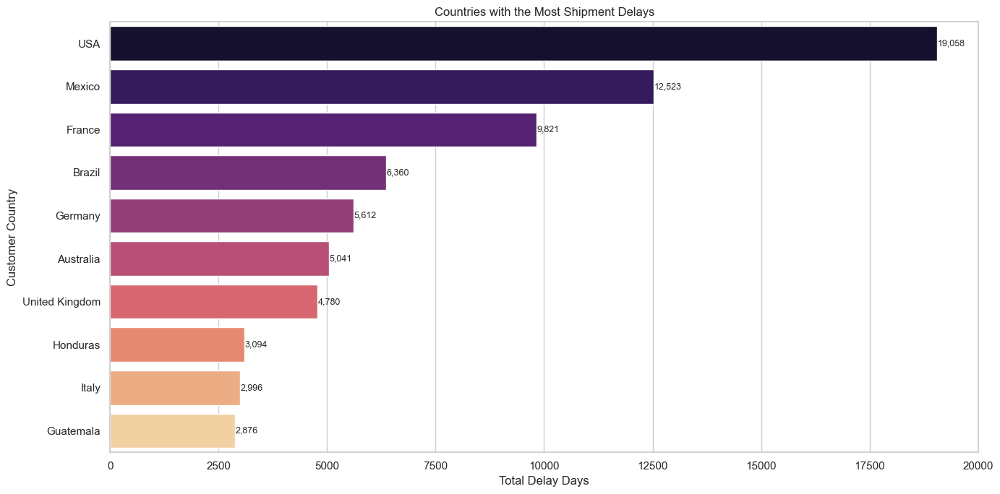

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
top_countries = df_copy.groupby('Customer Country')['Delays'].sum().sort_values(ascending=False).head(10)
top_countries_df = top_countries.reset_index()
plt.figure(figsize=(14, 7))
ax = sns.barplot(x='Delays', y='Customer Country', data=top_countries_df, hue='Customer Country', palette='magma', legend=False)
for p in ax.patches:
    width = p.get_width()
    if not pd.isna(width) and width > 0:
        ax.annotate(f'{width:,.0f}', (width + 10, p.get_y() + p.get_height() / 2), ha='left', va='center', fontsize=9)
plt.title('Countries with the Most Shipment Delays')
plt.xlabel('Total Delay Days')
plt.ylabel('Customer Country')
plt.tight_layout()
plt.show()

### **plot 40 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 40 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 92: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [93]:
"""# Create a DataFrame for the top 10 countries with the highest total delays
top_countries = df_copy.groupby("Customer Country")["Delays"].sum().sort_values(ascending=False).head(10)
top_countries_df = top_countries.reset_index()  # Columns: Customer Country, Delays

# Horizontal bar chart showing total delay days by customer country (top 10)
plt.figure(figsize=(14, 7))
sns.barplot(
    x="Delays",
    y="Customer Country",
    data=top_countries_df,
    hue="Customer Country",  # Assign the y variable to hue
    palette="magma",
    legend=False
)
plt.title("Countries with the Most Shipment Delays")
plt.xlabel("Total Delay Days")
plt.ylabel("Customer Country")
plt.tight_layout()
plt.show()
"""

'# Create a DataFrame for the top 10 countries with the highest total delays\ntop_countries = df_copy.groupby("Customer Country")["Delays"].sum().sort_values(ascending=False).head(10)\ntop_countries_df = top_countries.reset_index()  # Columns: Customer Country, Delays\n\n# Horizontal bar chart showing total delay days by customer country (top 10)\nplt.figure(figsize=(14, 7))\nsns.barplot(\n    x="Delays",\n    y="Customer Country",\n    data=top_countries_df,\n    hue="Customer Country",  # Assign the y variable to hue\n    palette="magma",\n    legend=False\n)\nplt.title("Countries with the Most Shipment Delays")\nplt.xlabel("Total Delay Days")\nplt.ylabel("Customer Country")\nplt.tight_layout()\nplt.show()\n'

### **plot 41 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 41 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 4
4. Based on the most frequent customer, does delay factor into their frequent ordering?

Features Involved:

* Customer ID

* Delay

* Order quantity

* Order date

### Step 93: data manipulation / transformation.

This cell data manipulation / transformation.

In [94]:
most_frequent_customer = df['Customer ID'].value_counts().idxmax()
most_frequent_count = df['Customer ID'].value_counts().max()
print(f'Most Frequent Customer ID: {most_frequent_customer} (Appeared {most_frequent_count} times)')

Most Frequent Customer ID: 9897 (Appeared 16 times)


### Step 94: data manipulation / transformation.

This cell data manipulation / transformation.

In [95]:
df_copy = df.copy()
customer_data = df_copy[df_copy['Customer ID'] == 6300]

### Step 95: generate visualization.

This cell generate visualization.

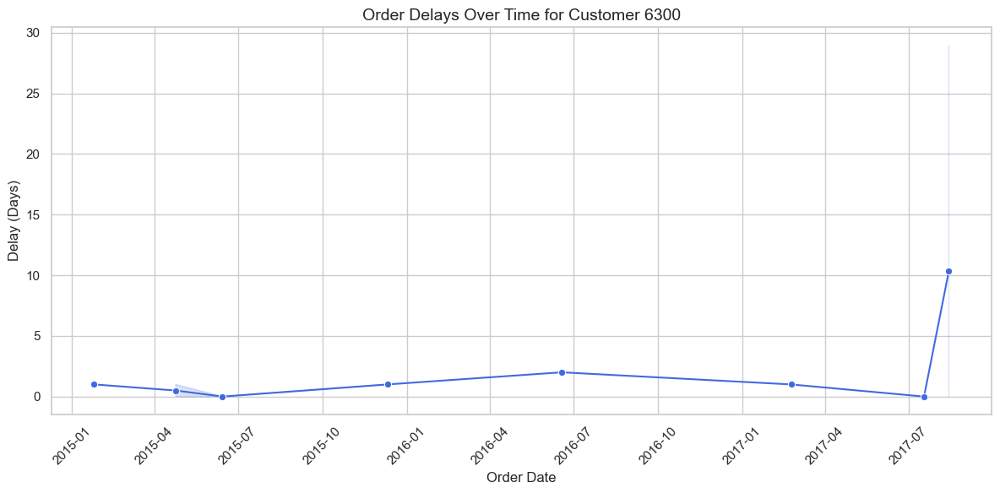

In [96]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Order Date', y='Delays', data=customer_data, marker='o', color='royalblue')
plt.xlabel('Order Date', fontsize=12)
plt.ylabel('Delay (Days)', fontsize=12)
plt.title('Order Delays Over Time for Customer 6300', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **plot 42 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 42 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 5
5. How does inventory cost per unit affect gross sales of a product?

Features Involved:

* Inventory cost per unit

* Gross sales

* Product name

* Warehouse inventory

* Profit

### Adding needed dataset file (inventory)

### Step 96: data manipulation / transformation.

This cell data manipulation / transformation.

In [97]:
inv.columns = inv.columns.str.strip()

### Step 97: data manipulation / transformation.

This cell data manipulation / transformation.

In [98]:
inv.columns

Index(['Product Name', 'Year Month', 'Warehouse Inventory',
       'Inventory Cost Per Unit'],
      dtype='object')

### Step 98: merge or join dataframes.

This cell merge or join dataframes.

In [99]:
merged_df = pd.merge(df, inv, on='Product Name', how='inner')
merged_df = merged_df.drop_duplicates(subset='Product Name')

### Step 99: data manipulation / transformation.

This cell data manipulation / transformation.

In [100]:
top_products = merged_df.nlargest(10, 'Gross Sales').copy()
top_products['Normalized Inventory Cost'] = top_products['Inventory Cost Per Unit'] / top_products['Inventory Cost Per Unit'].max()
top_products['Normalized Gross Sales'] = top_products['Gross Sales'] / top_products['Gross Sales'].max()

### Step 100: generate visualization.

This cell generate visualization.

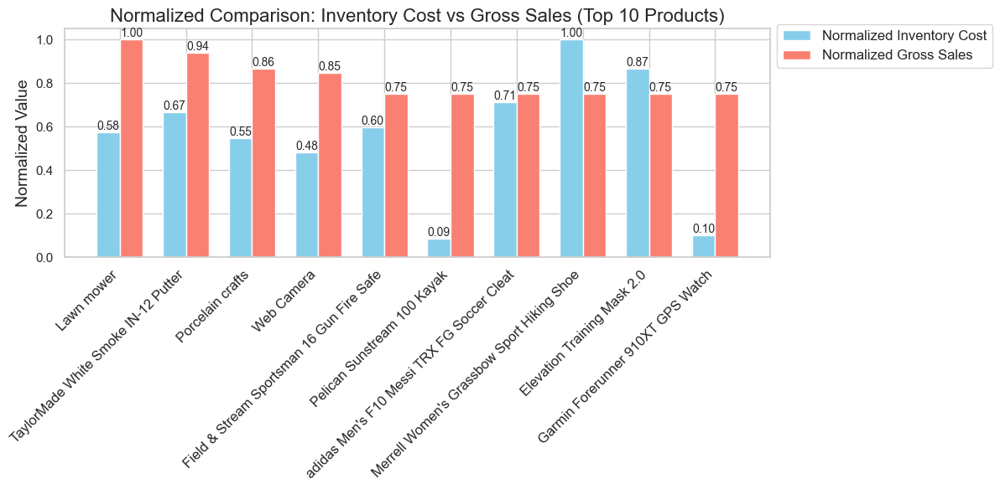

In [101]:
import numpy as np
import matplotlib.pyplot as plt
labels = top_products['Product Name']
x = np.arange(len(labels))
width = 0.35
fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width / 2, top_products['Normalized Inventory Cost'], width, label='Normalized Inventory Cost', color='skyblue')
rects2 = ax.bar(x + width / 2, top_products['Normalized Gross Sales'], width, label='Normalized Gross Sales', color='salmon')
for rect in rects1 + rects2:
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom', fontsize=10)
ax.set_ylabel('Normalized Value', fontsize=14)
ax.set_title('Normalized Comparison: Inventory Cost vs Gross Sales (Top 10 Products)', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=12)
ax.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1, 1.05), ncol=1)
plt.tight_layout()
plt.show()

### **plot 43 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 43 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 101: generate visualization.

This cell generate visualization.

In [102]:
"""import numpy as np
import matplotlib.pyplot as plt  # Load required libraries

# Define labels and positions for the bars
labels = top_products["Product Name"]
x = np.arange(len(labels))
width = 0.35  # Width of each bar

# Create the figure and axis for the grouped bar chart
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the bars for Normalized Inventory Cost and Normalized Gross Sales
rects1 = ax.bar(x - width/2, top_products["Normalized Inventory Cost"], width, label="Normalized Inventory Cost", color="skyblue")
rects2 = ax.bar(x + width/2, top_products["Normalized Gross Sales"], width, label="Normalized Gross Sales", color="salmon")

# Add labels, title, and custom x-tick labels
ax.set_ylabel("Normalized Value", fontsize=14)
ax.set_title("Normalized Comparison: Inventory Cost vs Gross Sales (Top 10 Products)", fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=12)
ax.legend(fontsize=12)

plt.tight_layout()
plt.show()
"""

'import numpy as np\nimport matplotlib.pyplot as plt  # Load required libraries\n\n# Define labels and positions for the bars\nlabels = top_products["Product Name"]\nx = np.arange(len(labels))\nwidth = 0.35  # Width of each bar\n\n# Create the figure and axis for the grouped bar chart\nfig, ax = plt.subplots(figsize=(12, 6))\n\n# Plot the bars for Normalized Inventory Cost and Normalized Gross Sales\nrects1 = ax.bar(x - width/2, top_products["Normalized Inventory Cost"], width, label="Normalized Inventory Cost", color="skyblue")\nrects2 = ax.bar(x + width/2, top_products["Normalized Gross Sales"], width, label="Normalized Gross Sales", color="salmon")\n\n# Add labels, title, and custom x-tick labels\nax.set_ylabel("Normalized Value", fontsize=14)\nax.set_title("Normalized Comparison: Inventory Cost vs Gross Sales (Top 10 Products)", fontsize=16)\nax.set_xticks(x)\nax.set_xticklabels(labels, rotation=45, ha="right", fontsize=12)\nax.legend(fontsize=12)\n\nplt.tight_layout()\nplt.show()\

### **plot 44 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 44 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 6
6. How do Product Category and Product Name affect Gross Sales and Profit, particularly when accounting for the Discount % applied?

Features Involved:

* Product Category

* Product Name

* Gross Sales

* Profit

* Discount %

### Step 102: generate visualization.

This cell generate visualization.

In [103]:
df_copy = df.copy()
sns.set_theme(style='whitegrid')

### **plot 45 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 45 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 103: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\6230986.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(gross_sales[i] + 1000, y_pos[i] - bar_height/2, f"${gross_sales[i]:,.0f}", va='center', fontsize=9)
C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\6230986.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(profit[i] + 1000, y_pos[i] + bar_height/2, f"${profit[i]:,.0f}", va='center', fontsize=9)


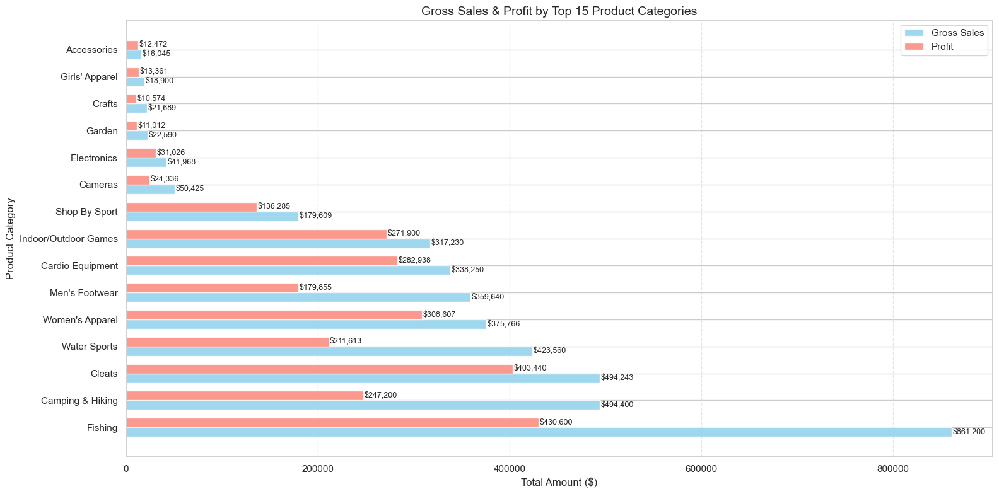

In [104]:
category_sales = df_copy.groupby('Product Category')[['Gross Sales', 'Profit']].sum().sort_values(by='Gross Sales', ascending=False).head(15)
plt.figure(figsize=(16, 8))
categories = category_sales.index
gross_sales = category_sales['Gross Sales']
profit = category_sales['Profit']
y_pos = np.arange(len(categories))
bar_height = 0.35
plt.barh(y_pos - bar_height / 2, gross_sales, height=bar_height, label='Gross Sales', color='skyblue', alpha=0.8)
plt.barh(y_pos + bar_height / 2, profit, height=bar_height, label='Profit', color='salmon', alpha=0.8)
for i in range(len(categories)):
    plt.text(gross_sales[i] + 1000, y_pos[i] - bar_height / 2, f'${gross_sales[i]:,.0f}', va='center', fontsize=9)
    plt.text(profit[i] + 1000, y_pos[i] + bar_height / 2, f'${profit[i]:,.0f}', va='center', fontsize=9)
plt.yticks(y_pos, categories)
plt.title('Gross Sales & Profit by Top 15 Product Categories', fontsize=14)
plt.xlabel('Total Amount ($)', fontsize=12)
plt.ylabel('Product Category', fontsize=12)
plt.legend(loc='upper right')
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### **plot 46 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 46 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 104: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [105]:
"""# Aggregate total sales and profit by product category and select the top 15 categories
category_sales = (
    df_copy.groupby("Product Category")[["Gross Sales", "Profit"]]
    .sum()
    .sort_values(by="Gross Sales", ascending=False)
    .head(15)
)

plt.figure(figsize=(14, 7))
category_sales.plot(kind="barh", colormap="coolwarm", alpha=0.8)
plt.title("Gross Sales & Profit by Top 15 Product Categories", fontsize=14)
plt.xlabel("Total Amount ($)", fontsize=12)
plt.ylabel("Product Category", fontsize=12)
plt.legend(["Gross Sales", "Profit"], loc="upper right")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()
"""

'# Aggregate total sales and profit by product category and select the top 15 categories\ncategory_sales = (\n    df_copy.groupby("Product Category")[["Gross Sales", "Profit"]]\n    .sum()\n    .sort_values(by="Gross Sales", ascending=False)\n    .head(15)\n)\n\nplt.figure(figsize=(14, 7))\ncategory_sales.plot(kind="barh", colormap="coolwarm", alpha=0.8)\nplt.title("Gross Sales & Profit by Top 15 Product Categories", fontsize=14)\nplt.xlabel("Total Amount ($)", fontsize=12)\nplt.ylabel("Product Category", fontsize=12)\nplt.legend(["Gross Sales", "Profit"], loc="upper right")\nplt.grid(axis="x", linestyle="--", alpha=0.5)\nplt.tight_layout()\nplt.show()\n'

### **plot 47 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 47 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 105: generate visualization.

This cell generate visualization.

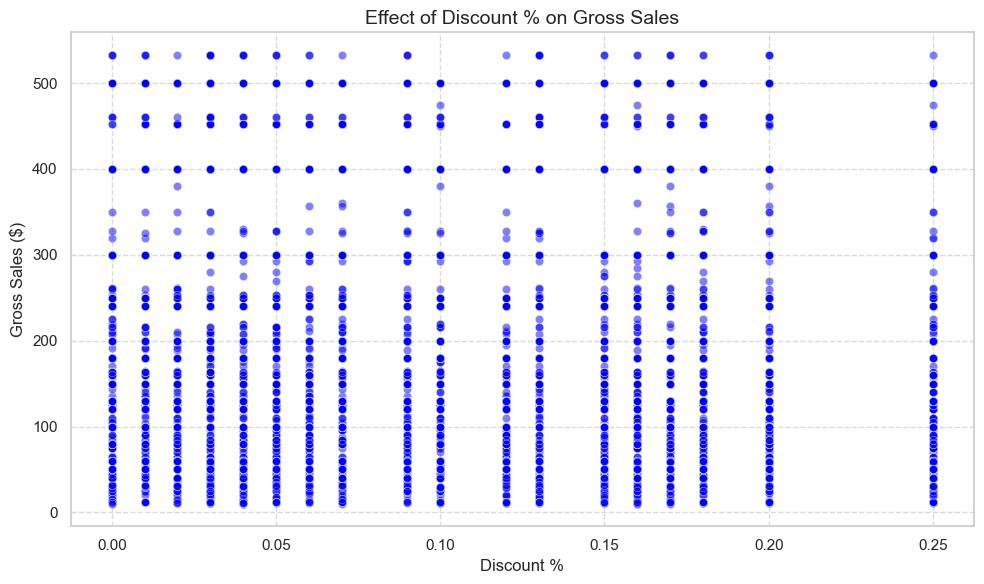

In [106]:
df_copy['Discount %'] = pd.to_numeric(df_copy['Discount %'], errors='coerce').fillna(0)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_copy['Discount %'], y=df_copy['Gross Sales'], alpha=0.5, color='blue')
plt.title('Effect of Discount % on Gross Sales', fontsize=14)
plt.xlabel('Discount %', fontsize=12)
plt.ylabel('Gross Sales ($)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### **plot 48 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 48 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 106: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

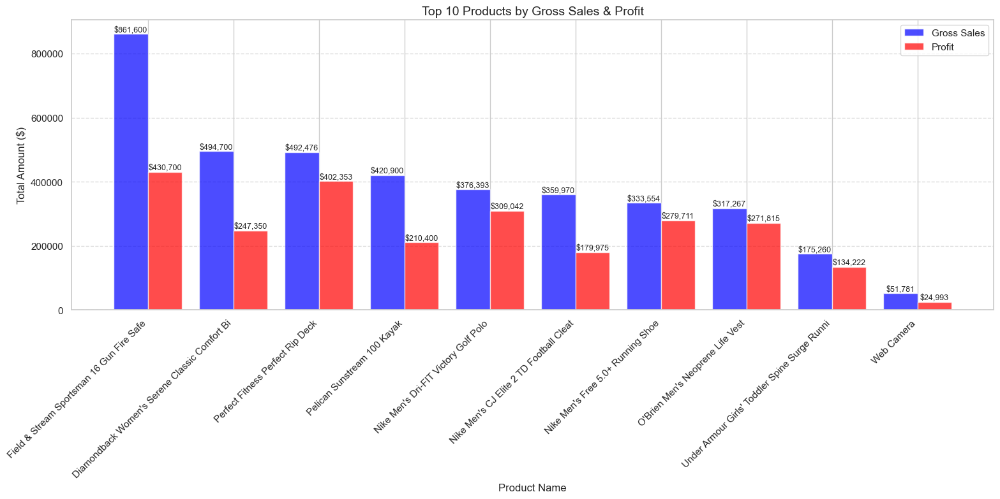

In [107]:
top_products = df_copy.groupby('Product Name')[['Gross Sales', 'Profit']].sum().sort_values(by='Gross Sales', ascending=False).head(10)
products = top_products.index
gross_sales = top_products['Gross Sales']
profit = top_products['Profit']
x = np.arange(len(products))
bar_width = 0.4
plt.figure(figsize=(16, 8))
bars1 = plt.bar(x - bar_width / 2, gross_sales, width=bar_width, label='Gross Sales', color='blue', alpha=0.7)
bars2 = plt.bar(x + bar_width / 2, profit, width=bar_width, label='Profit', color='red', alpha=0.7)
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 500, f'${height:,.0f}', ha='center', va='bottom', fontsize=9)
for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 500, f'${height:,.0f}', ha='center', va='bottom', fontsize=9)
plt.title('Top 10 Products by Gross Sales & Profit', fontsize=14)
plt.xlabel('Product Name', fontsize=12)
plt.ylabel('Total Amount ($)', fontsize=12)
plt.xticks(x, products, rotation=45, ha='right')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### **plot 49 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 49 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 107: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [108]:
"""# Aggregate total sales and profit by product name and select the top 10 best-selling products
top_products = (
    df_copy.groupby("Product Name")[["Gross Sales", "Profit"]]
    .sum()
    .sort_values(by="Gross Sales", ascending=False)
    .head(10)
)

# A bar chart to compare the Gross Sales & Profit of these top products.
plt.figure(figsize=(12, 6))
top_products.plot(kind="bar", color=["blue", "red"], alpha=0.7, width=0.8)  # Blue for Sales, Red for Profit

#  Add labels and formatting
plt.title("Top 10 Products by Gross Sales & Profit")
plt.xlabel("Product Name")
plt.ylabel("Total Amount ($)")
plt.xticks(rotation=45, ha="right")
plt.legend(["Gross Sales", "Profit"])
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()
"""

'# Aggregate total sales and profit by product name and select the top 10 best-selling products\ntop_products = (\n    df_copy.groupby("Product Name")[["Gross Sales", "Profit"]]\n    .sum()\n    .sort_values(by="Gross Sales", ascending=False)\n    .head(10)\n)\n\n# A bar chart to compare the Gross Sales & Profit of these top products.\nplt.figure(figsize=(12, 6))\ntop_products.plot(kind="bar", color=["blue", "red"], alpha=0.7, width=0.8)  # Blue for Sales, Red for Profit\n\n#  Add labels and formatting\nplt.title("Top 10 Products by Gross Sales & Profit")\nplt.xlabel("Product Name")\nplt.ylabel("Total Amount ($)")\nplt.xticks(rotation=45, ha="right")\nplt.legend(["Gross Sales", "Profit"])\nplt.grid(axis="y", linestyle="--", alpha=0.7)\nplt.show()\n'

### **plot 50 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 50 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 7
7. How do seasonal variations (Order Month and Shipment Month) affect sales metrics like Gross Sales and Profit across various Product Categories?

Features Involved:

* Order date

* Shipment Month // To be Removed

* Gross Sales

* Profit

* Product Category

### Step 108: data manipulation / transformation.

This cell data manipulation / transformation.

In [109]:
df_copy = df.copy()
df_copy['Order Date'] = pd.to_datetime(df_copy['Order Date'], errors='coerce')
df_copy['Order Month'] = df_copy['Order Date'].dt.month

### Step 109: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

             Gross Sales  Profit
Order Month                     
1                 389467  254136
2                 376832  239714
3                 370963  240784
4                 389354  251246
5                 368259  237621


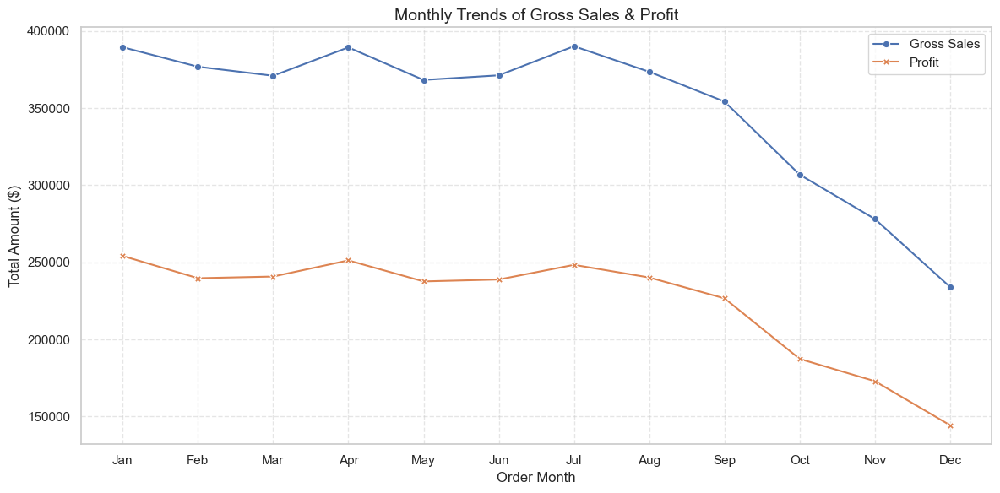

In [110]:
monthly_sales = df_copy.groupby('Order Month')[['Gross Sales', 'Profit']].sum()
print(monthly_sales.head())
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sales, markers=True, dashes=False)
plt.title('Monthly Trends of Gross Sales & Profit', fontsize=14)
plt.xlabel('Order Month', fontsize=12)
plt.ylabel('Total Amount ($)', fontsize=12)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid(True, which='both', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### **plot 51 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 51 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 110: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

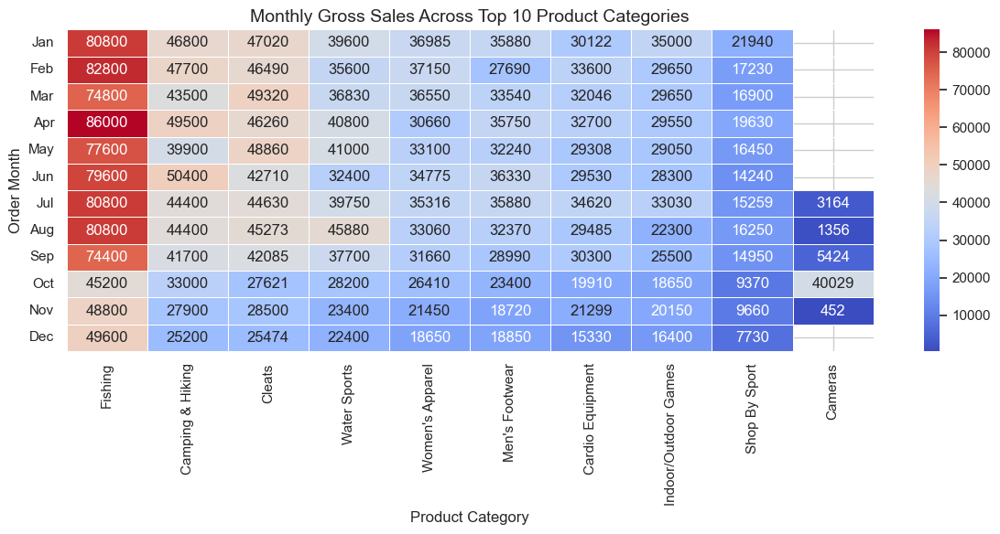

In [111]:
category_month_sales = df_copy.groupby(['Order Month', 'Product Category'])['Gross Sales'].sum().unstack()
top_categories = category_month_sales.sum().sort_values(ascending=False).head(10).index
filtered_data = category_month_sales[top_categories]
plt.figure(figsize=(12, 6))
sns.heatmap(filtered_data, cmap='coolwarm', annot=True, fmt='.0f', linewidths=0.5)
plt.title('Monthly Gross Sales Across Top 10 Product Categories', fontsize=14)
plt.xlabel('Product Category', fontsize=12)
plt.ylabel('Order Month', fontsize=12)
plt.yticks(ticks=np.arange(12) + 0.5, labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
plt.tight_layout()
plt.show()

### **plot 52 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 52 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 8
8. How do the customer market, region, and country impact Order Quantity, Gross Sales, and Profit, and which product category is most profitable within each market?

Features Involved:

* Customer Market

* Customer Region

* Customer Country

* Order Quantity

* Gross sales

* Profit

* Product Category

### Step 111: generate visualization.

This cell generate visualization.

In [112]:
df_copy = df.copy()
sns.set_theme(style='whitegrid')

### **plot 53 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 53 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 112: generate visualization.

This cell generate visualization.

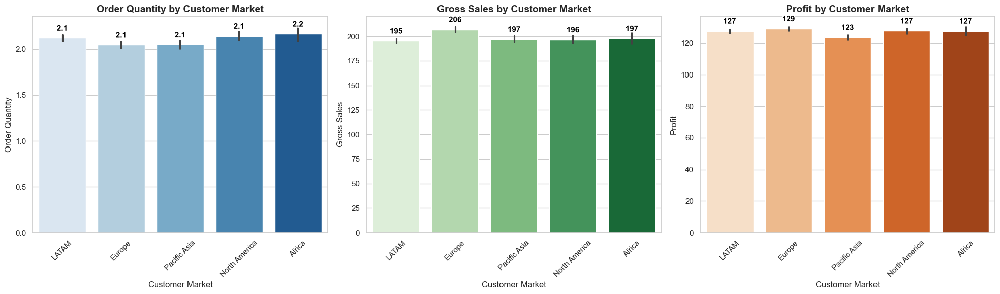

In [113]:
from matplotlib.patheffects import withStroke
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
charts = [('Order Quantity', 'Blues', 'Order Quantity by Customer Market'), ('Gross Sales', 'Greens', 'Gross Sales by Customer Market'), ('Profit', 'Oranges', 'Profit by Customer Market')]
for ax, (y_col, color, title) in zip(axes, charts):
    sns.barplot(x='Customer Market', y=y_col, data=df_copy, ax=ax, hue='Customer Market', palette=color, legend=False)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel('Customer Market', fontsize=12)
    ax.set_ylabel(y_col, fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.0, height + 0.03 * height, f'{int(height):,}' if height > 100 else f'{height:.1f}', ha='center', va='bottom', fontsize=11, fontweight='bold', color='black', path_effects=[withStroke(linewidth=3, foreground='white')])
plt.tight_layout()
plt.show()

### **plot 54 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 54 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 113: generate visualization.

This cell generate visualization.

In [114]:
"""# Create a figure with 1 row and 3 columns for the bar charts
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Bar chart for Order Quantity by Customer Market
sns.barplot(
    x="Customer Market",
    y="Order Quantity",
    data=df_copy,
    ax=axes[0],
    hue="Customer Market",
    palette="Blues",
    legend=False
)
axes[0].set_title("Order Quantity by Customer Market")

# Bar chart for Gross Sales by Customer Market
sns.barplot(
    x="Customer Market",
    y="Gross Sales",
    data=df_copy,
    ax=axes[1],
    hue="Customer Market",
    palette="Greens",
    legend=False
)
axes[1].set_title("Gross Sales by Customer Market")

# Bar chart for Profit by Customer Market
sns.barplot(
    x="Customer Market",
    y="Profit",
    data=df_copy,
    ax=axes[2],
    hue="Customer Market",
    palette="Oranges",
    legend=False
)
axes[2].set_title("Profit by Customer Market")

plt.tight_layout()
plt.show()
"""

'# Create a figure with 1 row and 3 columns for the bar charts\nfig, axes = plt.subplots(1, 3, figsize=(18, 5))\n\n# Bar chart for Order Quantity by Customer Market\nsns.barplot(\n    x="Customer Market",\n    y="Order Quantity",\n    data=df_copy,\n    ax=axes[0],\n    hue="Customer Market",\n    palette="Blues",\n    legend=False\n)\naxes[0].set_title("Order Quantity by Customer Market")\n\n# Bar chart for Gross Sales by Customer Market\nsns.barplot(\n    x="Customer Market",\n    y="Gross Sales",\n    data=df_copy,\n    ax=axes[1],\n    hue="Customer Market",\n    palette="Greens",\n    legend=False\n)\naxes[1].set_title("Gross Sales by Customer Market")\n\n# Bar chart for Profit by Customer Market\nsns.barplot(\n    x="Customer Market",\n    y="Profit",\n    data=df_copy,\n    ax=axes[2],\n    hue="Customer Market",\n    palette="Oranges",\n    legend=False\n)\naxes[2].set_title("Profit by Customer Market")\n\nplt.tight_layout()\nplt.show()\n'

### **plot 55 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 55 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 114: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\2934667611.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_categories = category_profit.groupby("Customer Market", group_keys=False).apply(lambda x: x.nlargest(5, "Profit")).reset_index(drop=True)


<Figure size 1200x600 with 0 Axes>

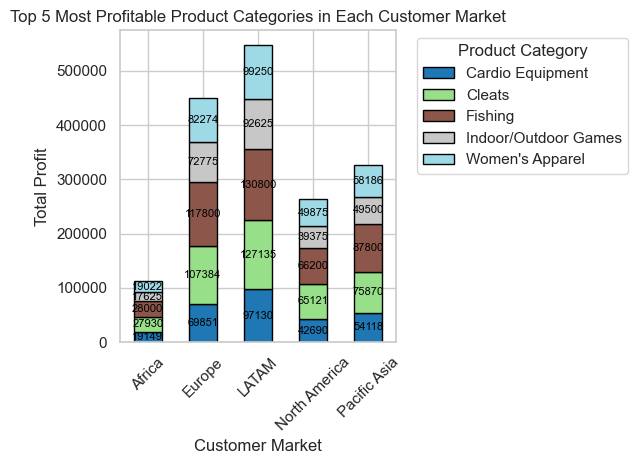

In [115]:
category_profit = df_copy.groupby(['Customer Market', 'Product Category'], as_index=False)['Profit'].sum()
top_categories = category_profit.groupby('Customer Market', group_keys=False).apply(lambda x: x.nlargest(5, 'Profit')).reset_index(drop=True)
category_pivot = top_categories.pivot(index='Customer Market', columns='Product Category', values='Profit')
plt.figure(figsize=(12, 6))
ax = category_pivot.plot(kind='bar', stacked=True, colormap='tab20', edgecolor='black')
for container in ax.containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width() / 2, bar.get_y() + height / 2, f'{height:.0f}', ha='center', va='center', fontsize=8, color='black')
plt.title('Top 5 Most Profitable Product Categories in Each Customer Market')
plt.xlabel('Customer Market')
plt.ylabel('Total Profit')
plt.xticks(rotation=45)
plt.legend(title='Product Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### **plot 56 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 56 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 115: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [116]:
"""# Group by Customer Market and Product Category to sum Profit
category_profit = df_copy.groupby(["Customer Market", "Product Category"], as_index=False)["Profit"].sum()

# Get the top 5 most profitable categories for each Customer Market
top_categories = category_profit.groupby("Customer Market", group_keys=False).apply(lambda x: x.nlargest(5, "Profit")).reset_index(drop=True)

# Pivot the data for a stacked bar chart
category_pivot = top_categories.pivot(index="Customer Market", columns="Product Category", values="Profit")

# Plot the stacked bar chart
plt.figure(figsize=(12, 6))
category_pivot.plot(kind="bar", stacked=True, colormap="tab20", edgecolor="black")
plt.title("Top 5 Most Profitable Product Categories in Each Customer Market")
plt.xlabel("Customer Market")
plt.ylabel("Total Profit")
plt.xticks(rotation=45)
plt.legend(title="Product Category", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()
"""

'# Group by Customer Market and Product Category to sum Profit\ncategory_profit = df_copy.groupby(["Customer Market", "Product Category"], as_index=False)["Profit"].sum()\n\n# Get the top 5 most profitable categories for each Customer Market\ntop_categories = category_profit.groupby("Customer Market", group_keys=False).apply(lambda x: x.nlargest(5, "Profit")).reset_index(drop=True)\n\n# Pivot the data for a stacked bar chart\ncategory_pivot = top_categories.pivot(index="Customer Market", columns="Product Category", values="Profit")\n\n# Plot the stacked bar chart\nplt.figure(figsize=(12, 6))\ncategory_pivot.plot(kind="bar", stacked=True, colormap="tab20", edgecolor="black")\nplt.title("Top 5 Most Profitable Product Categories in Each Customer Market")\nplt.xlabel("Customer Market")\nplt.ylabel("Total Profit")\nplt.xticks(rotation=45)\nplt.legend(title="Product Category", bbox_to_anchor=(1.05, 1), loc="upper left")\nplt.tight_layout()\nplt.show()\n'

### **plot 57 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 57 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 9
9. Which product names exhibit the highest customer repurchase rates, and how do their discount percentages and profit margins compare to products with lower repurchase rates?

Features Involved:

* Product Name

* Customer ID (to track repeat purchases)

* Discount %

* Profit

* Order Quantity

### Step 116: merge or join dataframes.

This cell merge or join dataframes.

In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
df_copy = df.copy()
df_copy['Discount %'] = pd.to_numeric(df_copy['Discount %'], errors='coerce')
df_copy['Profit'] = pd.to_numeric(df_copy['Profit'], errors='coerce')
repurchase_counts = df_copy.groupby(['Customer ID', 'Product Name']).size().reset_index(name='Purchase Count')
repurchase_rates = repurchase_counts.groupby('Product Name')['Purchase Count'].mean().reset_index()
repurchase_rates['Purchase Count'] = repurchase_rates['Purchase Count'].round(5)
repurchase_rates = repurchase_rates.sort_values(by=['Purchase Count', 'Product Name'], ascending=[False, True], kind='stable').reset_index(drop=True)
high_repurchase = repurchase_rates.head(10)
low_repurchase = repurchase_rates.tail(10)
product_stats = df_copy.groupby('Product Name').agg({'Discount %': 'mean', 'Profit': 'mean'}).reset_index()
high_repurchase = high_repurchase.merge(product_stats, on='Product Name', how='left')
low_repurchase = low_repurchase.merge(product_stats, on='Product Name', how='left')

### Step 117: generate visualization.

This cell generate visualization.

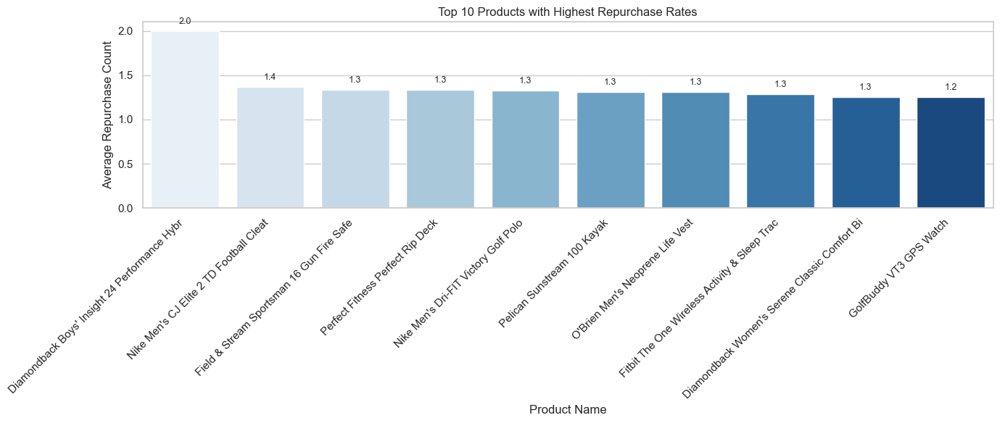

In [118]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(14, 6))
ax = sns.barplot(data=high_repurchase, x='Product Name', y='Purchase Count', hue='Product Name', palette='Blues', legend=False)
for p in ax.patches:
    height = p.get_height()
    if not pd.isna(height) and height > 0:
        ax.annotate(f'{height:.1f}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='bottom', fontsize=9, xytext=(0, 5), textcoords='offset points')
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Products with Highest Repurchase Rates')
plt.xlabel('Product Name')
plt.ylabel('Average Repurchase Count')
plt.tight_layout()
plt.show()

### **plot 58 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 58 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 118: generate visualization.

This cell generate visualization.

In [119]:
"""plt.figure(figsize=(14, 6))
sns.barplot(
    data=high_repurchase,
    x='Product Name',
    y='Purchase Count',
    hue='Product Name',
    palette='Blues',
    legend=False
)
plt.xticks(rotation=45, ha='right')
plt.title("Top 10 Products with Highest Repurchase Rates")
plt.xlabel("Product Name")
plt.ylabel("Average Repurchase Count")
plt.tight_layout()
plt.show()
"""

'plt.figure(figsize=(14, 6))\nsns.barplot(\n    data=high_repurchase,\n    x=\'Product Name\',\n    y=\'Purchase Count\',\n    hue=\'Product Name\',\n    palette=\'Blues\',\n    legend=False\n)\nplt.xticks(rotation=45, ha=\'right\')\nplt.title("Top 10 Products with Highest Repurchase Rates")\nplt.xlabel("Product Name")\nplt.ylabel("Average Repurchase Count")\nplt.tight_layout()\nplt.show()\n'

### **plot 59 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 59 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 119: generate visualization.

This cell generate visualization.

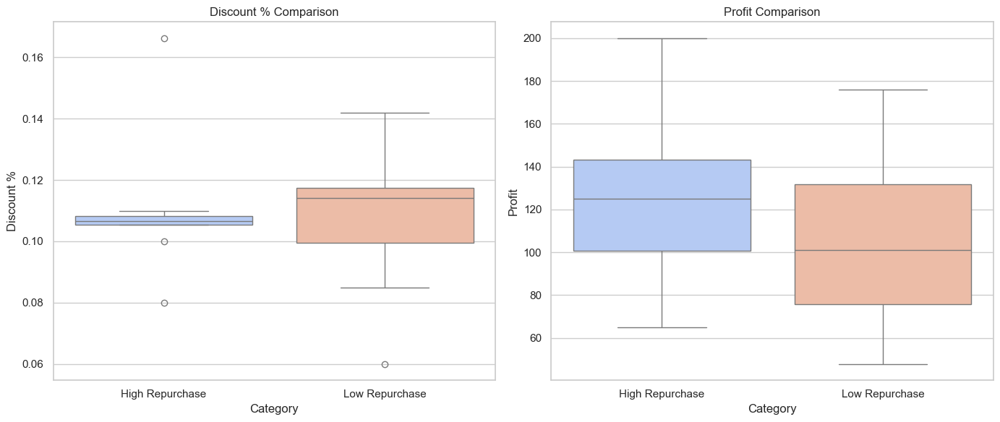

In [120]:
high_repurchase['Category'] = 'High Repurchase'
low_repurchase['Category'] = 'Low Repurchase'
comparison_df = pd.concat([high_repurchase, low_repurchase])
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.boxplot(data=comparison_df, x='Category', y='Discount %', hue='Category', palette='coolwarm')
plt.title('Discount % Comparison')
plt.legend([], [], frameon=False)
plt.subplot(1, 2, 2)
sns.boxplot(data=comparison_df, x='Category', y='Profit', hue='Category', palette='coolwarm')
plt.title('Profit Comparison')
plt.legend([], [], frameon=False)
plt.tight_layout()
plt.show()

### **plot 60 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 60 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 120: generate visualization.

This cell generate visualization.

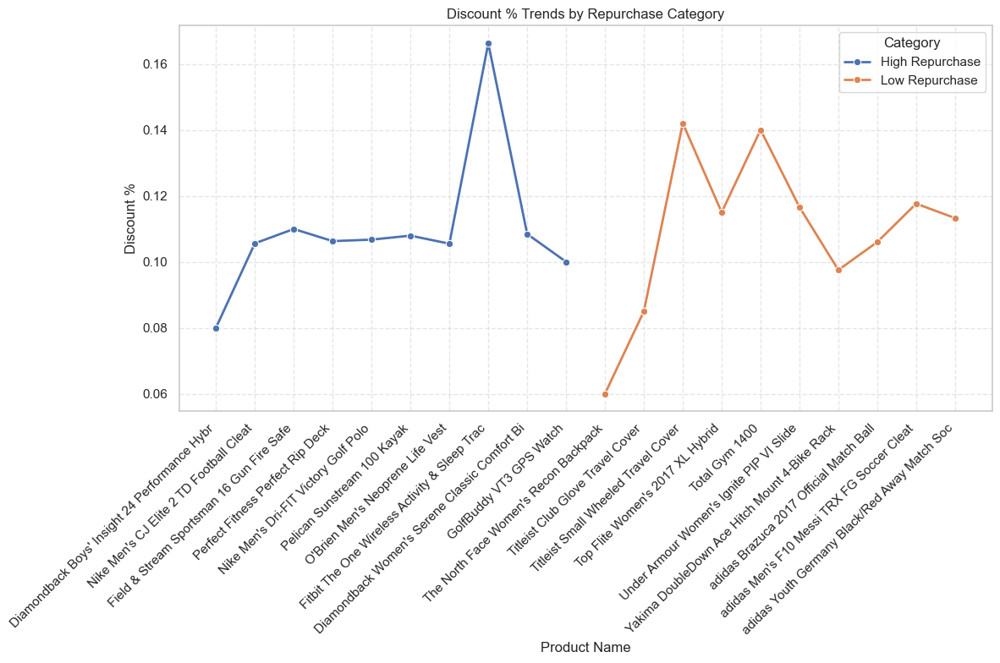

In [121]:
plt.figure(figsize=(12, 8))
sns.lineplot(data=comparison_df, x='Product Name', y='Discount %', hue='Category', marker='o', linewidth=2)
plt.xticks(rotation=45, ha='right')
plt.title('Discount % Trends by Repurchase Category')
plt.xlabel('Product Name')
plt.ylabel('Discount %')
plt.legend(title='Category')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### **plot 61 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 61 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 121: generate visualization.

This cell generate visualization.

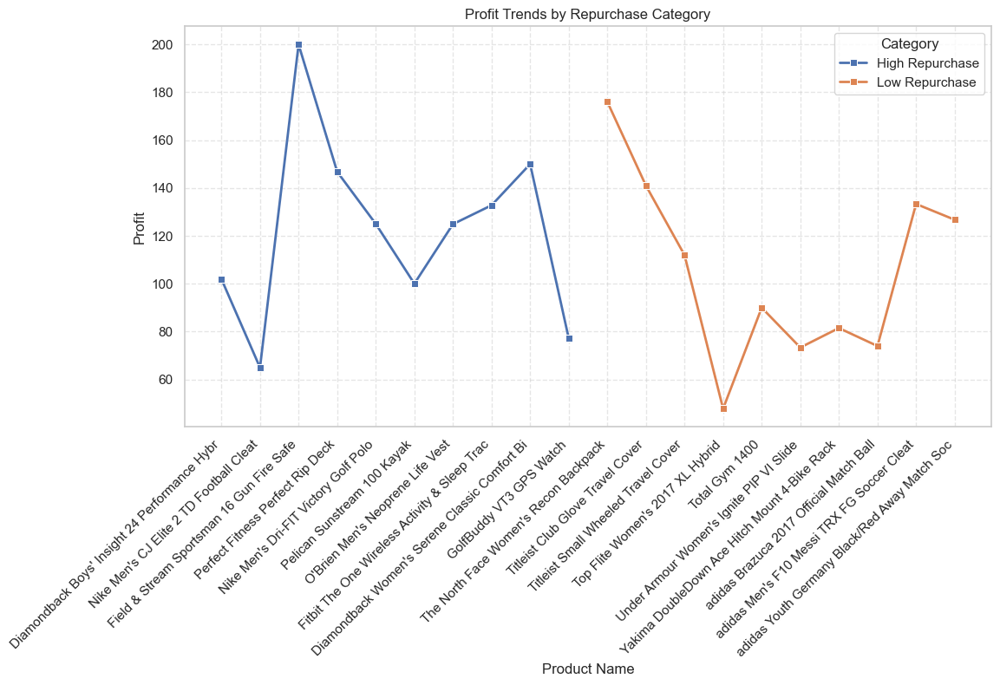

In [122]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=comparison_df, x='Product Name', y='Profit', hue='Category', marker='s', linewidth=2)
plt.xticks(rotation=45, ha='right')
plt.title('Profit Trends by Repurchase Category')
plt.xlabel('Product Name')
plt.ylabel('Profit')
plt.legend(title='Category')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

### **plot 62 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 62 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### 10
10. Which department has the highest demand and profit in each region?

Features Involved:

* Product department

* Customer region

* Profit

* Order Quantity

### Step 122: data manipulation / transformation.

This cell data manipulation / transformation.

In [123]:
print(df['Customer Region'].unique())

['Central America' 'South America' 'Northern Europe' 'Western Europe'
 'Eastern Asia' 'Southeast Asia' 'South Asia' 'US Center' 'West of USA'
 'East of USA' 'South of  USA' 'Eastern Europe' 'North Africa'
 'Central Africa' 'West Africa' 'Caribbean' 'Southern Europe' 'West Asia'
 'Southern Africa' 'Oceania' 'Central Asia' 'Canada' 'East Africa']


### Step 123: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [124]:
import pandas as pd
import plotly.express as px
region_mapping = {'South America': 'Brazil', 'Central America': 'Mexico', 'Northern Europe': 'United Kingdom', 'Western Europe': 'Germany', 'Eastern Asia': 'China', 'Southeast Asia': 'Indonesia', 'South Asia': 'India', 'US Center': 'United States', 'West of USA': 'United States', 'East of USA': 'United States', 'South of  USA': 'United States', 'North Africa': 'Egypt', 'Central Africa': 'Democratic Republic of the Congo', 'Eastern Europe': 'Poland', 'West Africa': 'Nigeria', 'East Africa': 'Kenya', 'Southern Europe': 'Italy', 'West Asia': 'Turkey', 'Southern Africa': 'South Africa', 'Oceania': 'Australia', 'Caribbean': 'Dominican Republic', 'Central Asia': 'Kazakhstan', 'Canada': 'Canada'}
df_copy = df.copy()
df_copy['Mapped Region'] = df_copy['Customer Region'].replace(region_mapping)
region_department = df_copy.groupby(['Mapped Region', 'Product Department']).agg(total_orders=('Order Quantity', 'sum'), total_profit=('Profit', 'sum')).reset_index()
fig_orders = px.choropleth(region_department, locations='Mapped Region', locationmode='country names', color='total_orders', color_continuous_scale='Reds', labels={'total_orders': 'Total Orders'}, hover_data=['total_profit'], animation_frame='Product Department', title='Product Demand by Region (Total Orders)')
fig_orders.update_layout(geo=dict(showcoastlines=True, projection_type='natural earth'), coloraxis_colorbar=dict(title='Total Orders'), margin={'r': 0, 't': 50, 'l': 0, 'b': 0})
fig_orders.show()
fig_profit = px.choropleth(region_department, locations='Mapped Region', locationmode='country names', color='total_profit', color_continuous_scale='Greens', labels={'total_profit': 'Total Profit'}, hover_data=['total_orders'], animation_frame='Product Department', title='Product Demand by Region (Total Profit)')
fig_profit.update_layout(geo=dict(showcoastlines=True, projection_type='natural earth'), coloraxis_colorbar=dict(title='Total Profit'), margin={'r': 0, 't': 50, 'l': 0, 'b': 0})
fig_profit.show()

# Web scrapping

# Cleaning scraped dataset

### Step 124: data manipulation / transformation.

This cell data manipulation / transformation.

In [125]:
"""
# Import necessary modules
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.common.exceptions import TimeoutException

import csv

# Configure Selenium to use Chrome (you need ChromeDriver installed and in PATH)
chrome_options = Options()
chrome_options.add_argument("--headless")  # Remove if you want to see the browser
driver = webdriver.Chrome(options=chrome_options)

try:
    # Navigate to the UN Data ComTrade page with the filter for HS code 95.
    url = "https://data.un.org/Data.aspx?d=ComTrade&f=_l1Code%3A95"
    driver.get(url)

    wait = WebDriverWait(driver, 15)  # up to 15s for elements

    # Wait for the initial table and grab it
    header = wait.until(EC.presence_of_element_located(
        (By.XPATH, "//th[contains(., 'Country or Area')]")
    ))
    table = header.find_element(By.XPATH, "./ancestor::table")

    # Open CSV for writing
    with open("comtrade_data.csv", mode="w", newline="", encoding="utf-8") as file:
        writer = csv.writer(file)
        writer.writerow([
            "Country or Area", "Year", "Commodity", "Flow",
            "Trade (USD)", "Weight (kg)", "Quantity Unit", "Quantity"
        ])

        page = 1
        max_pages = 200

        while True:
            # --- SCRAPE CURRENT PAGE ---
            rows = table.find_elements(By.XPATH, ".//tr[td]")
            for row in rows:
                cells = row.find_elements(By.TAG_NAME, "td")
                # handle hidden-code columns
                if len(cells) == 10:
                    country, year = cells[1].text, cells[2].text
                    commodity, flow = cells[4].text, cells[5].text
                    trade_usd, weight_kg = cells[6].text, cells[7].text
                    qty_unit, quantity = cells[8].text, cells[9].text
                elif len(cells) == 8:
                    country, year = cells[0].text, cells[1].text
                    commodity, flow = cells[2].text, cells[3].text
                    trade_usd, weight_kg = cells[4].text, cells[5].text
                    qty_unit, quantity = cells[6].text, cells[7].text
                else:
                    continue
                writer.writerow([
                    country, year, commodity, flow,
                    trade_usd, weight_kg, qty_unit, quantity
                ])

            # stop if reached max pages
            if page >= max_pages:
                print(f"Reached max page limit ({max_pages}). Stopping.")
                break

            # try to find and click the Next arrow
            try:
                next_btn = wait.until(EC.element_to_be_clickable(
                    (By.CSS_SELECTOR, "img[src*='GoToNext.gif']")
                ))
            except TimeoutException:
                print("No Next button found or not clickable. Ending pagination.")
                break

            # remember old table, click, then wait for staleness
            old_table = table
            next_btn.click()
            try:
                wait.until(EC.staleness_of(old_table))
            except TimeoutException:
                print("Old table did not go stale in time; stopping.")
                break

            # wait for new table header to appear, then re-locate table
            try:
                header = wait.until(EC.presence_of_element_located(
                    (By.XPATH, "//th[contains(., 'Country or Area')]")
                ))
                table = header.find_element(By.XPATH, "./ancestor::table")
            except TimeoutException:
                print("New table did not load in time; stopping.")
                break

            page += 1
            print(f"Navigated to page {page}...")

    print("Data scraping complete. CSV file has been saved.")

finally:
    driver.quit()
    """

'\n# Import necessary modules\nfrom selenium import webdriver\nfrom selenium.webdriver.chrome.options import Options\nfrom selenium.webdriver.common.by import By\nfrom selenium.webdriver.support.ui import WebDriverWait\nfrom selenium.webdriver.support import expected_conditions as EC\nfrom selenium.common.exceptions import TimeoutException\n\nimport csv\n\n# Configure Selenium to use Chrome (you need ChromeDriver installed and in PATH)\nchrome_options = Options()\nchrome_options.add_argument("--headless")  # Remove if you want to see the browser\ndriver = webdriver.Chrome(options=chrome_options)\n\ntry:\n    # Navigate to the UN Data ComTrade page with the filter for HS code 95.\n    url = "https://data.un.org/Data.aspx?d=ComTrade&f=_l1Code%3A95"\n    driver.get(url)\n\n    wait = WebDriverWait(driver, 15)  # up to 15s for elements\n\n    # Wait for the initial table and grab it\n    header = wait.until(EC.presence_of_element_located(\n        (By.XPATH, "//th[contains(., \'Country or 

### Step 125: load dataset(s) into dataframe(s).

This cell load dataset(s) into dataframe(s).

In [126]:
ds = pd.read_csv('C:\\Users\\abdel\\Downloads\\Project phase 2\\comtrade_data.csv', na_values=['', ' ', '  ', '   '])
ds.head()

,Country or Area,Year,Commodity,Flow,Trade (USD),Weight (kg),Quantity Unit,Quantity
0,Afghanistan,2019,"Tricycles, scooters, pedal cars and similar wh...",Export,229,480,Weight in kilograms,480
1,Afghanistan,2019,"Tricycles, scooters, pedal cars and similar wh...",Re-Export,229,480,Weight in kilograms,480
2,Afghanistan,2019,"Tricycles, scooters, pedal cars and similar wh...",Import,"1,012,089","375,645",Weight in kilograms,"375,645"
3,Afghanistan,2019,"Festive, carnival or other entertainment artic...",Import,"8,127","8,888",Weight in kilograms,"8,888"
4,Afghanistan,2019,Golf balls,Export,402,210,No Quantity,NaN


### Step 126: data manipulation / transformation.

This cell data manipulation / transformation.

In [127]:
ds.columns

Index(['Country or Area', 'Year', 'Commodity', 'Flow', 'Trade (USD)',
       'Weight (kg)', 'Quantity Unit', 'Quantity'],
      dtype='object')

### Step 127: data manipulation / transformation.

This cell data manipulation / transformation.

In [128]:
ds.columns = ds.columns.str.strip()
for col in ds.select_dtypes(include='object').columns:
    ds.loc[:, col] = ds[col].str.strip()
ds.loc[:, 'Year'] = pd.to_numeric(ds['Year'], errors='coerce')
ds = ds.loc[(ds['Year'] >= 2015) & (ds['Year'] <= 2017)]

### Step 128: data manipulation / transformation.

This cell data manipulation / transformation.

In [129]:
ds.head()

,Country or Area,Year,Commodity,Flow,Trade (USD),Weight (kg),Quantity Unit,Quantity
12,Afghanistan,2017,Wheeled toys designed to be ridden by children...,Import,"5,764",NaN,Weight in kilograms,"4,383"
13,Afghanistan,2017,Toys representing animals/non-human creatures ...,Import,"129,458",NaN,No Quantity,NaN
14,Afghanistan,2017,Golf equipment; other than clubs and balls,Import,"415,894","7,760",Weight in kilograms,"7,760"
15,Afghanistan,2016,Wheeled toys designed to be ridden by children...,Import,"289,931",NaN,No Quantity,NaN
16,Afghanistan,2015,Wheeled toys designed to be ridden by children...,Import,"1,615,886",NaN,No Quantity,NaN


### Step 129: data manipulation / transformation.

This cell data manipulation / transformation.

In [130]:
ds = ds.drop(columns=['Flow', 'Quantity Unit'])

### Step 130: data manipulation / transformation.

This cell data manipulation / transformation.

In [131]:
ds.duplicated().sum()

266

### Step 131: remove duplicates.

This cell remove duplicates.

In [132]:
ds.drop_duplicates(inplace=True)

### Step 132: data manipulation / transformation.

This cell data manipulation / transformation.

In [133]:
ds.duplicated().sum()

0

### Step 133: data manipulation / transformation.

This cell data manipulation / transformation.

In [134]:
ds.isnull().sum()

Country or Area      0
Year                 0
Commodity            0
Trade (USD)          0
Weight (kg)         96
Quantity           589
dtype: int64

### Step 134: data manipulation / transformation.

This cell data manipulation / transformation.

In [135]:
ds = ds.bfill().ffill()

### Step 135: data manipulation / transformation.

This cell data manipulation / transformation.

In [136]:
ds.isnull().sum()

Country or Area    0
Year               0
Commodity          0
Trade (USD)        0
Weight (kg)        0
Quantity           0
dtype: int64

### Step 136: data manipulation / transformation.

This cell data manipulation / transformation.

In [137]:
ds.tail()

,Country or Area,Year,Commodity,Trade (USD),Weight (kg),Quantity
38215,Brunei Darussalam,2015,Fishing reels,585,8,63
38216,Brunei Darussalam,2015,"Fishing tackle n.e.c., butterfly nets, decoy b...","424,252","13,735","368,042"
38217,Brunei Darussalam,2015,Travelling circuses and travelling menageries,204,4,4
38218,Brunei Darussalam,2015,"Roundabouts, swings, shooting galleries, other...","907,992","57,243","57,243"
38219,Brunei Darussalam,2015,"Roundabouts, swings, shooting galleries, other...","34,871","1,379","1,379"


# Merge both datasets

### Step 137: merge or join dataframes.

This cell merge or join dataframes.

In [138]:
ds['Trade (USD)'] = ds['Trade (USD)'].replace(',', '', regex=True).astype(float)
ds['Weight (kg)'] = pd.to_numeric(ds['Weight (kg)'], errors='coerce')
ds['Quantity'] = pd.to_numeric(ds['Quantity'], errors='coerce')
ds_summary = ds.groupby('Year', as_index=False).agg({'Trade (USD)': 'sum', 'Weight (kg)': 'sum', 'Quantity': 'sum'})
merged = df.merge(ds_summary, left_on='Order Year', right_on='Year', how='left', suffixes=('', '_ds'))
merged.drop(columns=['Year'], inplace=True)
merged.to_csv('Final.csv', index=False)

### Step 138: data manipulation / transformation.

This cell data manipulation / transformation.

In [139]:
merged.head()

,Order ID,Order Item ID,Order Time,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,...,IsDelayed,Delays,Order Year,Shipment Year,Delay Category,Shipment Day,delay_category,Trade (USD),Weight (kg),Quantity
0,3535,8793,14:07,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,...,True,2.0,2015,2015,Delayed,27,120 or Below,1.299453e+10,90073.0,76318.0
1,4133,10320,07:37,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,...,False,0.0,2015,2015,On Time,6,120 or Below,1.299453e+10,90073.0,76318.0
2,7396,18517,22:47,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Northern Europe,...,False,0.0,2015,2015,On Time,20,120 or Below,1.299453e+10,90073.0,76318.0
3,11026,27608,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,...,False,0.0,2015,2015,On Time,12,120 or Below,1.299453e+10,90073.0,76318.0
4,11026,27609,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,...,False,0.0,2015,2015,On Time,12,120 or Below,1.299453e+10,90073.0,76318.0


### Step 139: data manipulation / transformation.

This cell data manipulation / transformation.

In [140]:
merged.columns

Index(['Order ID', 'Order Item ID', 'Order Time', 'Order Quantity',
       'Product Department', 'Product Category', 'Product Name', 'Customer ID',
       'Customer Market', 'Customer Region', 'Customer Country',
       'Warehouse Country', 'Shipment Mode', 'Shipment Days - Scheduled',
       'Gross Sales', 'Discount %', 'Profit', 'Order Date', 'Shipment Date',
       'Product ID', 'IsDelayed', 'Delays', 'Order Year', 'Shipment Year',
       'Delay Category', 'Shipment Day', 'delay_category', 'Trade (USD)',
       'Weight (kg)', 'Quantity'],
      dtype='object')

### Step 140: data manipulation / transformation.

This cell data manipulation / transformation.

In [141]:
merged.shape

(21085, 30)

# Questions and visualization

### New question 1: how does the trade value (usd) of commodities relate to the number of orders placed in the corresponding
New Question 1:
How does the trade value (USD) of commodities relate to the number of orders placed in the corresponding countries over time?
📊 Uses: Country or Area, Trade (USD), Order Year, Order ID
🧠 Goal: Correlate trade volume (macroeconomic activity) with customer ordering behavior.

### Step 141: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\123726402.py:24: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



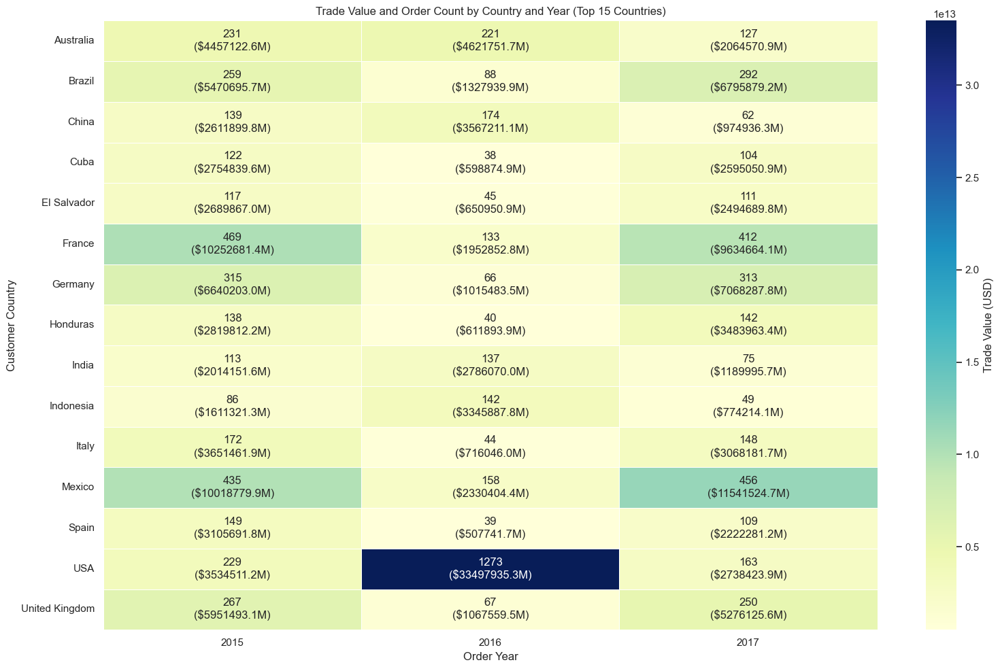

In [188]:
summary = merged.groupby(['Customer Country', 'Order Year']).agg({'Order ID': 'nunique', 'Trade (USD)': 'sum'}).reset_index()
top_countries = summary.groupby('Customer Country')['Order ID'].sum().sort_values(ascending=False).head(15).index
summary_top = summary[summary['Customer Country'].isin(top_countries)]
order_pivot = summary_top.pivot(index='Customer Country', columns='Order Year', values='Order ID')
trade_pivot = summary_top.pivot(index='Customer Country', columns='Order Year', values='Trade (USD)')
annotations = order_pivot.fillna(0).astype(int).astype(str) + '\n($' + trade_pivot.fillna(0).applymap(lambda x: f'{x / 1000000.0:.1f}M') + ')'
plt.figure(figsize=(16, 10))
sns.heatmap(trade_pivot, cmap='YlGnBu', annot=annotations, fmt='', linewidths=0.5, cbar_kws={'label': 'Trade Value (USD)'})
plt.title('Trade Value and Order Count by Country and Year (Top 15 Countries)')
plt.xlabel('Order Year')
plt.ylabel('Customer Country')
plt.tight_layout()
plt.show()

### **plot 63 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 63 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### New question 2: which commodities are associated with the most delayed shipments, and how do their weights and quantitie
New Question 2:
Which commodities are associated with the most delayed shipments, and how do their weights and quantities influence these delays?
📊 Uses: Commodity, Weight (kg), Quantity, IsDelayed, Delays
🧠 Goal: Explore whether heavier or bulkier commodities correlate with higher delays.

### Step 142: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\1064007051.py:25: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



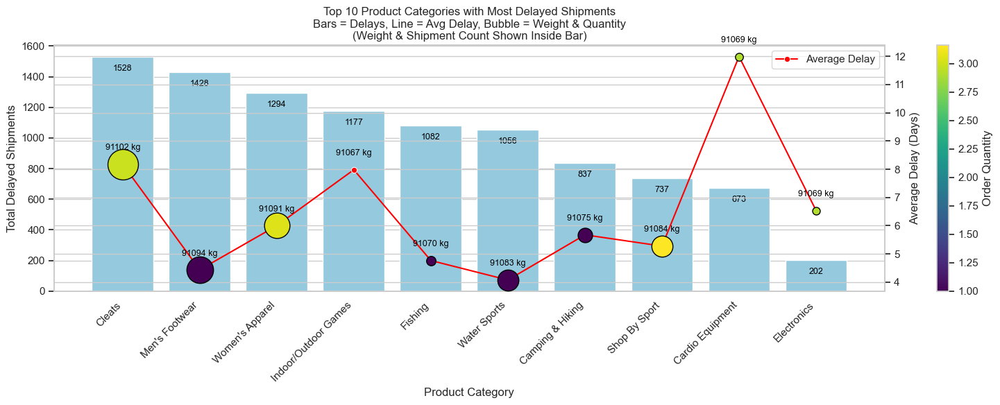

In [191]:
q2_df = merged.groupby('Product Category').agg({'IsDelayed': 'sum', 'Delays': 'mean', 'Weight (kg)': 'mean', 'Order Quantity': 'mean'}).reset_index()
top_categories = q2_df.sort_values('IsDelayed', ascending=False).head(10)
norm = plt.Normalize(top_categories['Order Quantity'].min(), top_categories['Order Quantity'].max())
colors = cm.viridis(norm(top_categories['Order Quantity']))
min_w = top_categories['Weight (kg)'].min()
max_w = top_categories['Weight (kg)'].max()
top_categories['Size'] = 1000 * (top_categories['Weight (kg)'] - min_w) / (max_w - min_w + 1e-06)
fig, ax1 = plt.subplots(figsize=(16, 6))
barplot = sns.barplot(data=top_categories, x='Product Category', y='IsDelayed', color='skyblue', ax=ax1)
ax1.set_ylabel('Total Delayed Shipments')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
for i, bar in enumerate(barplot.patches):
    height = bar.get_height()
    ax1.text(x=i, y=height - 50, s=str(int(height)), ha='center', va='top', fontsize=9, color='Black')
ax2 = ax1.twinx()
sns.lineplot(data=top_categories, x='Product Category', y='Delays', ax=ax2, color='red', marker='o', label='Average Delay')
ax2.set_ylabel('Average Delay (Days)')
for idx, row in top_categories.iterrows():
    ax2.scatter(x=row['Product Category'], y=row['Delays'], s=row['Size'], color=cm.viridis(norm(row['Order Quantity'])), edgecolor='black', zorder=5)
    ax2.text(x=row['Product Category'], y=row['Delays'] + 0.5, s=f"{int(row['Weight (kg)'])} kg", ha='center', fontsize=9, color='black')
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=ax2, orientation='vertical', label='Order Quantity')
plt.title('Top 10 Product Categories with Most Delayed Shipments\nBars = Delays, Line = Avg Delay, Bubble = Weight & Quantity\n(Weight & Shipment Count Shown Inside Bar)')
plt.tight_layout()
plt.show()

### **plot 64 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 64 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### New question 3: which shipment mode is frequently used by high trade value countries, and are they more or less prone to
New Question 3:
Which shipment mode is frequently used by high trade value countries, and are they more or less prone to delays?
📊 Uses: Country or Area, Trade (USD), Shipment Mode, IsDelayed
🧠 Goal: Analyze the effectiveness of logistics methods across international trade volumes.

### Step 143: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

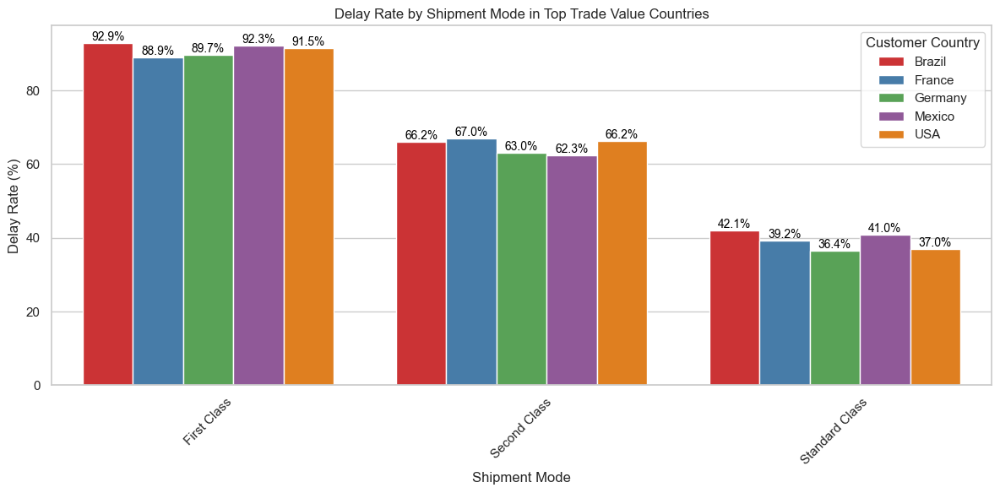

In [181]:
top_countries = merged.groupby('Customer Country')['Trade (USD)'].sum().nlargest(5).index
merged_top = merged[merged['Customer Country'].isin(top_countries)]
summary = merged_top.groupby(['Customer Country', 'Shipment Mode']).agg(Total_Shipments=('IsDelayed', 'count'), Delayed_Shipments=('IsDelayed', 'sum')).reset_index()
summary['Delay Rate (%)'] = summary['Delayed_Shipments'] / summary['Total_Shipments'] * 100
plt.figure(figsize=(12, 6))
ax = sns.barplot(data=summary, x='Shipment Mode', y='Delay Rate (%)', hue='Customer Country', palette='Set1')
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{height:,.1f}%', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
plt.title('Delay Rate by Shipment Mode in Top Trade Value Countries')
plt.ylabel('Delay Rate (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **plot 65 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 65 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Question 4: how do trade values (usd) and gross sales differ between domestic shipments (warehouse country = customer co
Question 4: How do trade values (USD) and gross sales differ between domestic shipments (warehouse country = customer country) and international shipments, and how do these patterns vary by product category and order year?
Columns involved:

Trade (USD)

Gross Sales

Warehouse Country

Customer Country

Product Category

Order Year

### Step 144: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [1]:
merged['Shipment Type'] = merged['Warehouse Country'] == merged['Customer Country']
merged['Shipment Type'] = merged['Shipment Type'].map({True: 'Domestic', False: 'International'})
summary = merged.groupby(['Shipment Type', 'Product Category', 'Order Year']).agg(Total_Trade_Value=('Trade (USD)', 'sum')).reset_index()
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=summary, x='Order Year', y='Total_Trade_Value', hue='Shipment Type', ci=None, palette='Set1')
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{height:,.0f}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
plt.title('Trade Value by Shipment Type and Order Year')
plt.ylabel('Total Trade Value (USD)')
plt.xlabel('Order Year')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

NameError: name 'merged' is not defined

### **plot 66 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 66 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 145: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

In [3]:
summary = merged.groupby(['Shipment Type', 'Product Category', 'Order Year']).agg(Total_Trade_Value=('Trade (USD)', 'sum'), Total_Gross_Sales=('Gross Sales', 'sum')).reset_index()
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=summary, x='Order Year', y='Total_Gross_Sales', hue='Shipment Type', ci=None, palette='dark')
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{height:,.0f}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
plt.title('Gross Sales by Shipment Type and Order Year')
plt.ylabel('Total Gross Sales (USD)')
plt.xlabel('Order Year')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

NameError: name 'merged' is not defined

### **plot 67 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 67 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Question 5: how do order quantities correlate with the day of the week on which shipments occur and with shipment weight
Question 5: How do order quantities correlate with the day of the week on which shipments occur and with shipment weights, and how do these factors collectively influence profitability for different product categories?
Columns involved:

Order Quantity

Shipment Day

Weight (kg)

Profit

Product Category

### Step 146: clean missing data.

This cell clean missing data.

In [172]:
merged['Shipment Date'] = pd.to_datetime(merged['Shipment Date'], errors='coerce')
merged['Shipment Weekday'] = merged['Shipment Date'].dt.day_name()
preview_weekday = merged[['Shipment Date', 'Shipment Weekday']].dropna().head()
print(preview_weekday)

  Shipment Date Shipment Weekday
0    2015-02-27           Friday
1    2015-03-06           Friday
2    2015-04-20           Monday
3    2015-06-12           Friday
4    2015-06-12           Friday


### Step 147: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

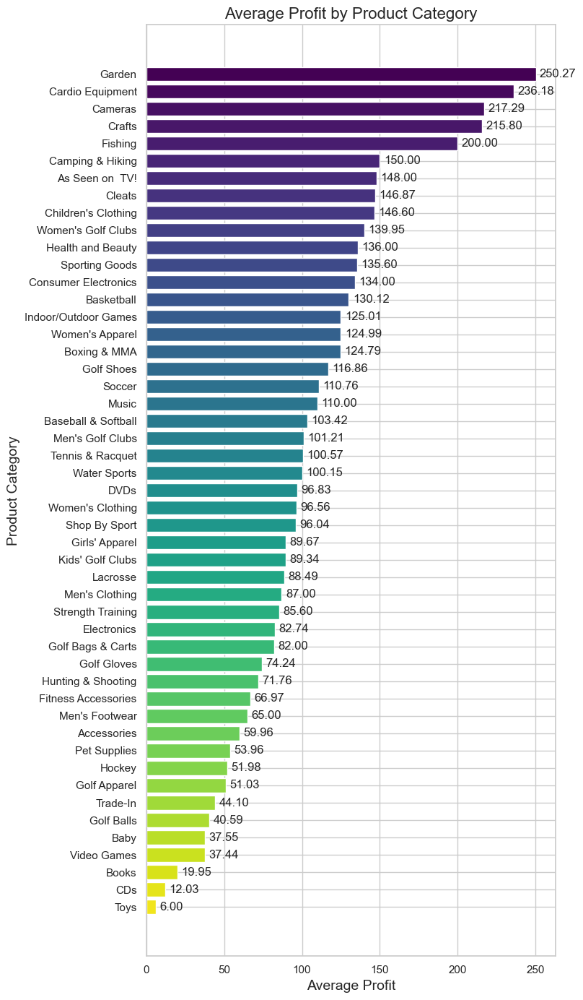

In [175]:
avg_profit = merged.groupby('Product Category')['Profit'].mean().sort_values(ascending=False)
categories = avg_profit.index.tolist()
profits = avg_profit.values.tolist()
cmap = plt.get_cmap('viridis')
colors = [cmap(i / len(profits)) for i in range(len(profits))]
plt.figure(figsize=(12, 14))
bars = plt.barh(categories, profits, color=colors)
plt.xlabel('Average Profit', fontsize=14)
plt.ylabel('Product Category', fontsize=14)
plt.title('Average Profit by Product Category', fontsize=16)
plt.gca().invert_yaxis()
for bar in bars:
    width = bar.get_width()
    plt.text(width + max(profits) * 0.01, bar.get_y() + bar.get_height() / 2, '{:.2f}'.format(width), va='center', fontsize=12)
plt.tight_layout()
plt.subplots_adjust(left=0.5)
plt.show()

### **plot 68 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 68 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Question 6: how do orders with the highest trade (usd) values compare to those with the lowest trade values in terms of
Question 6: How do orders with the highest trade (USD) values compare to those with the lowest trade values in terms of product department, customer market, and profitability (gross sales vs profit)? Note: get the mean and below the mean low abouve is high
Columns involved:

Trade (USD)

Product Department

Customer Market

Gross Sales

Profit

### Step 148: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

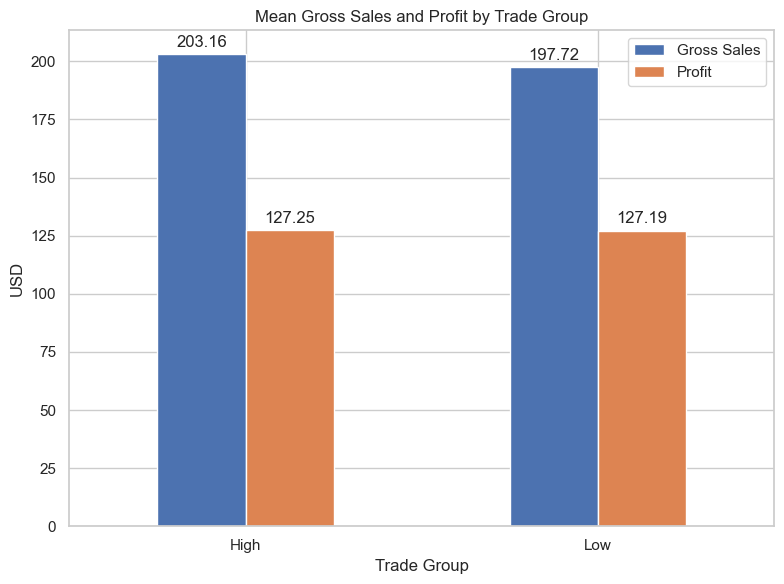

In [258]:
import matplotlib.pyplot as plt
mean_trade = merged['Trade (USD)'].mean()
merged['Trade Group'] = merged['Trade (USD)'] > mean_trade
pattern = 'Gross Sales|Profit'
cols_to_plot = merged.filter(regex=pattern).columns
profit_sales = merged.groupby(merged['Trade Group'].map({True: 'High', False: 'Low'}))[cols_to_plot].mean()
ax = profit_sales.plot(kind='bar', figsize=(8, 6), rot=0)
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', padding=3)
ax.set_ylabel('USD')
ax.set_title('Mean Gross Sales and Profit by Trade Group')
plt.tight_layout()
plt.show()

### **plot 69 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 69 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 149: generate visualization.

This cell generate visualization.

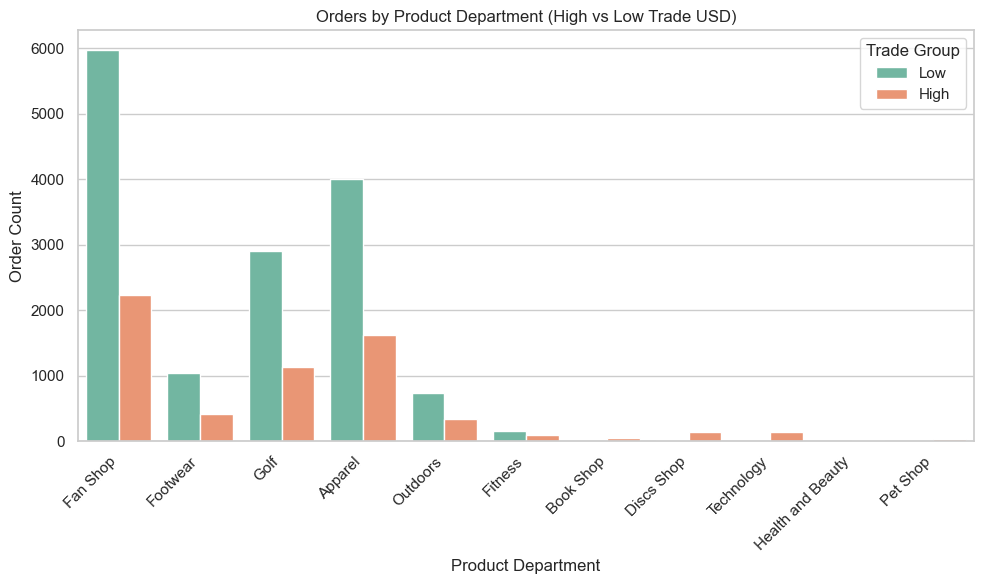

In [179]:
plt.figure(figsize=(10, 6))
sns.countplot(data=merged, x='Product Department', hue=merged['Trade Group'].map({True: 'High', False: 'Low'}), palette='Set2')
plt.title('Orders by Product Department (High vs Low Trade USD)')
plt.xlabel('Product Department')
plt.ylabel('Order Count')
plt.legend(title='Trade Group')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### **plot 70 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 70 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Step 150: generate visualization.

This cell generate visualization.

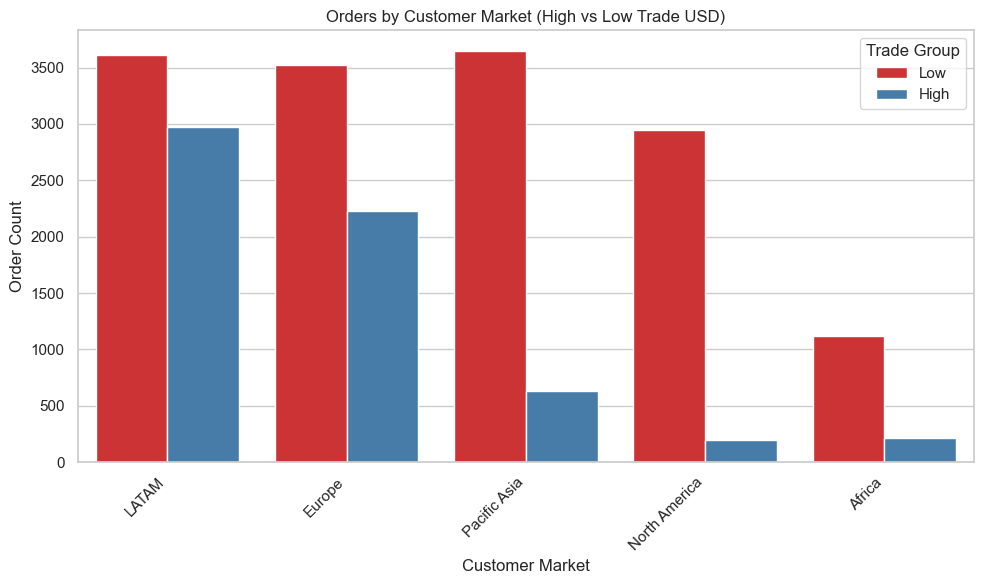

In [180]:
plt.figure(figsize=(10, 6))
sns.countplot(data=merged, x='Customer Market', hue=merged['Trade Group'].map({True: 'High', False: 'Low'}), palette='Set1')
plt.title('Orders by Customer Market (High vs Low Trade USD)')
plt.xlabel('Customer Market')
plt.ylabel('Order Count')
plt.legend(title='Trade Group')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### **plot 71 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 71 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Question 7: which regions have shifted from high-quantity to high-value imports for specific commodities across years? (
Question 7: Which regions have shifted from high-quantity to high-value imports for specific commodities across years?
(Columns: Customer Region, Year, Quantity, Trade (USD), Commodity)

### Step 151: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

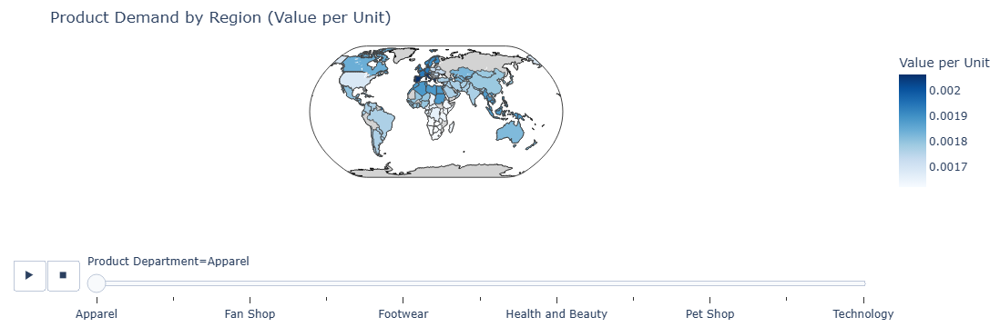

In [255]:
import plotly.express as px
df = df[df['Quantity'] != 0]
df['Value per Unit'] = df['Gross Sales'] / df['Quantity']
df = df.dropna(subset=['Customer Region', 'Product Department', 'Value per Unit'])
region_to_countries = {'Central America': ['Mexico', 'Guatemala', 'Panama', 'Cuba', 'Nicaragua', 'El Salvador', 'Costa Rica', 'Honduras'], 'South America': ['Brazil', 'Argentina', 'Chile', 'Colombia', 'Perú', 'Venezuela', 'Uruguay', 'Ecuador', 'Paraguay', 'French Guiana'], 'Northern Europe': ['Denmark', 'Sweden', 'Ireland', 'Finland', 'Norway', 'United Kingdom'], 'Western Europe': ['Netherlands', 'France', 'Germany', 'Belgium', 'Switzerland', 'Austria'], 'Eastern Asia': ['China', 'Japan', 'South Korea', 'Hong Kong', 'Taiwan', 'Mongolia'], 'Southeast Asia': ['Indonesia', 'Vietnam', 'Malaysia', 'Singapore', 'Thailand', 'Cambodia', 'Myanmar', 'Philippines', 'Papua New Guinea'], 'South Asia': ['India', 'Pakistan', 'Bangladesh', 'Sri Lanka', 'Nepal', 'Afghanistan'], 'US Center': ['USA'], 'West of USA': ['USA'], 'East of USA': ['USA'], 'South of  USA': ['USA'], 'Eastern Europe': ['Poland', 'Romania', 'Ukraine', 'Hungary', 'Belarus', 'Bulgaria', 'Czech Republic (Czechia)', 'Slovakia', 'Croatia', 'Moldova', 'Lithuania', 'Estonia', 'Bosnia and Herzegovina', 'Albania', 'Montenegro'], 'North Africa': ['Egypt', 'Sudan', 'Algeria', 'Morocco', 'Tunisia', 'Libya'], 'Central Africa': ['Democratic Republic of Congo', 'Republic of Congo', 'Cameroon', 'Gabon', 'Chad', 'Central African Republic'], 'West Africa': ['Nigeria', 'Ghana', 'Ivory Coast', 'Togo', 'Benín', 'Mali', 'Senegal', 'Guinea', 'Sierra Leone', 'Liberia', 'Niger', 'Guinea-Bissau', 'Gambia'], 'East Africa': ['Kenya', 'Ethiopia', 'Tanzania', 'Uganda', 'Rwanda', 'Somalia', 'Madagascar'], 'Caribbean': ['Dominican Republic', 'Haiti', 'Jamaica', 'Trinidad and Tobago', 'Barbados', 'Martinique', 'Guadalupe'], 'Southern Europe': ['Italy', 'Spain', 'Portugal', 'Greece'], 'West Asia': ['Turkey', 'Iran', 'Iraq', 'Israel', 'Saudi Arabia', 'Syria', 'Jordan', 'Lebanon', 'Qatar', 'UAE', 'Oman'], 'Southern Africa': ['South Africa', 'Namibia', 'Botswana', 'Zimbabwe', 'Zambia', 'Angola', 'Lesotho'], 'Oceania': ['Australia', 'New Zealand'], 'Central Asia': ['Uzbekistan', 'Kazakhstan', 'Turkmenistan', 'Kyrgyzstan', 'Azerbaijan'], 'Canada': ['Canada']}
df['Mapped Countries'] = df['Customer Region'].map(region_to_countries)
df = df.dropna(subset=['Mapped Countries'])
df = df.explode('Mapped Countries')
df['Mapped Region'] = df['Mapped Countries']
df = df.drop(columns=['Mapped Countries'])
grouped = df.groupby(['Mapped Region', 'Customer Region', 'Product Department'], as_index=False)['Value per Unit'].mean()
fig = px.choropleth(grouped, locations='Mapped Region', locationmode='country names', color='Value per Unit', hover_name='Customer Region', animation_frame='Product Department', color_continuous_scale='Blues', title='Product Demand by Region (Value per Unit)', labels={'Value per Unit': 'Value per Unit (USD)'})
fig.update_geos(showcoastlines=True, coastlinecolor='Black', showland=True, landcolor='lightgray')
fig.update_layout(geo=dict(showcoastlines=True, projection_type='natural earth'), coloraxis_colorbar=dict(title='Value per Unit'), margin={'r': 0, 't': 50, 'l': 0, 'b': 0})
fig.show()

### Step 152: aggregate/group data.

This cell aggregate/group data.

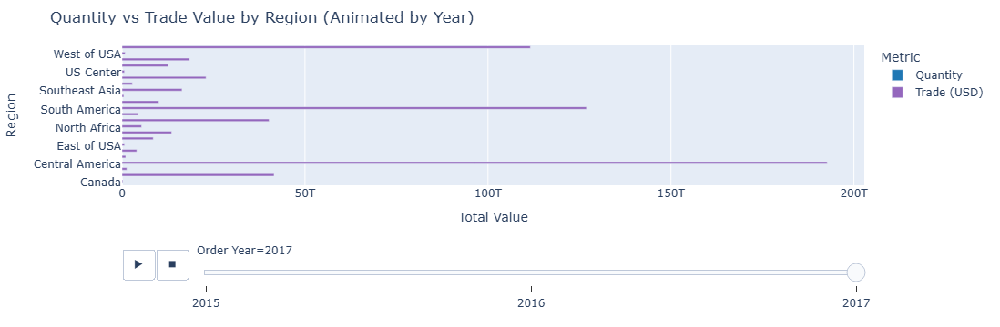

In [256]:
bar_data = df.groupby(['Customer Region', 'Order Year'], as_index=False).agg({'Quantity': 'sum', 'Trade (USD)': 'sum'})
bar_data_melted = bar_data.melt(id_vars=['Customer Region', 'Order Year'], value_vars=['Quantity', 'Trade (USD)'], var_name='Metric', value_name='Value')
fig = px.bar(bar_data_melted, y='Customer Region', x='Value', color='Metric', animation_frame='Order Year', barmode='group', orientation='h', title='Quantity vs Trade Value by Region (Animated by Year)', labels={'Value': 'Total', 'Customer Region': 'Region'}, color_discrete_sequence=['#1f77b4', '#9467bd'])
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 2500
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 700
fig.update_layout(height=700, margin={'r': 20, 't': 50, 'l': 100, 'b': 80}, xaxis_title='Total Value', yaxis_title='Region')
fig.show()

### Question 8: comparison of discount strategies across regions with different trade capacities features:  customer region
Question 8: Comparison of discount strategies across regions with different trade capacities
Features:

Customer Region

Discount %

Trade (USD)

Gross Sales

### Step 153: load dataset(s) into dataframe(s).

This cell load dataset(s) into dataframe(s).

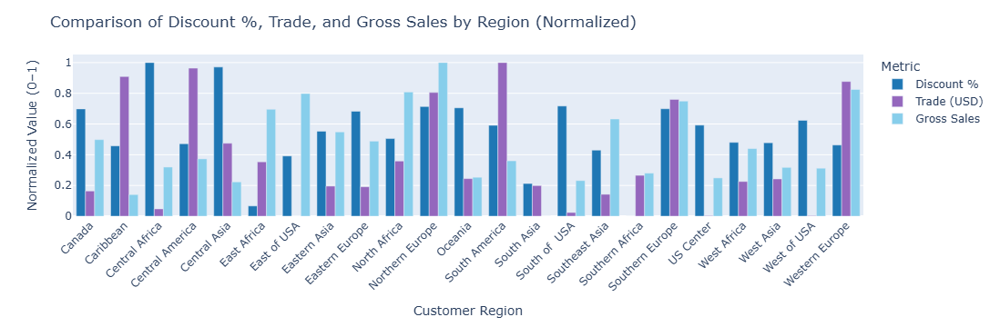

In [265]:
from sklearn.preprocessing import MinMaxScaler
df = pd.read_csv('Final.csv')

def clean_numeric(col):
    return pd.to_numeric(df[col].astype(str).str.extract('([-+]?\\d*\\.?\\d+)')[0], errors='coerce')
df['Discount %'] = clean_numeric('Discount %')
df['Trade (USD)'] = clean_numeric('Trade (USD)')
df['Gross Sales'] = clean_numeric('Gross Sales')
df = df.dropna(subset=['Customer Region', 'Discount %', 'Trade (USD)', 'Gross Sales'])
grouped = df.groupby('Customer Region')[['Discount %', 'Trade (USD)', 'Gross Sales']].mean().reset_index()
melted_raw = grouped.melt(id_vars='Customer Region', var_name='Metric', value_name='Actual Value')
scaler = MinMaxScaler()
grouped_scaled = grouped.copy()
grouped_scaled[['Discount %', 'Trade (USD)', 'Gross Sales']] = scaler.fit_transform(grouped[['Discount %', 'Trade (USD)', 'Gross Sales']])
melted_scaled = grouped_scaled.melt(id_vars='Customer Region', var_name='Metric', value_name='Normalized Value')
merged = melted_scaled.copy()
merged['Actual Value'] = melted_raw['Actual Value']
custom_colors = {'Discount %': '#1f77b4', 'Trade (USD)': '#9467bd', 'Gross Sales': '#87CEEB'}
fig = px.bar(merged, x='Customer Region', y='Normalized Value', color='Metric', barmode='group', color_discrete_map=custom_colors, hover_data={'Actual Value': True, 'Normalized Value': False})
fig.update_layout(title='Comparison of Discount %, Trade, and Gross Sales by Region (Normalized)', xaxis_title='Customer Region', yaxis_title='Normalized Value (0–1)', xaxis_tickangle=-45, height=600)
fig.show()

### Step 154: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

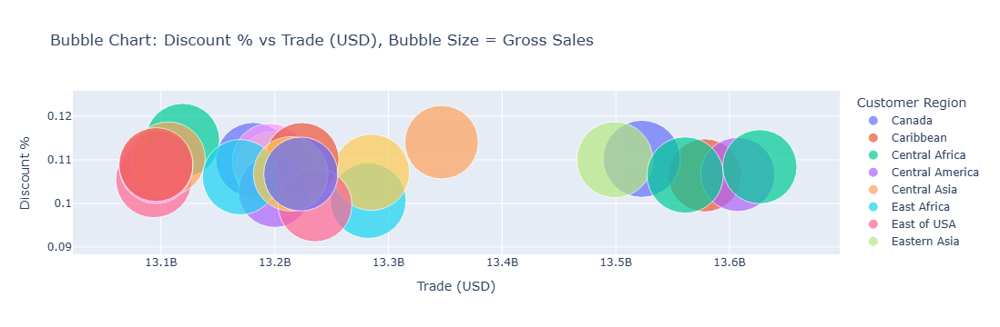

In [266]:
import pandas as pd
import plotly.express as px

def clean_numeric(col):
    return pd.to_numeric(df[col].astype(str).str.extract('([-+]?\\d*\\.?\\d+)')[0], errors='coerce')
df['Discount %'] = clean_numeric('Discount %')
df['Trade (USD)'] = clean_numeric('Trade (USD)')
df['Gross Sales'] = clean_numeric('Gross Sales')
df = df.dropna(subset=['Customer Region', 'Discount %', 'Trade (USD)', 'Gross Sales'])
grouped = df.groupby('Customer Region')[['Discount %', 'Trade (USD)', 'Gross Sales']].mean().reset_index()
fig = px.scatter(grouped, x='Trade (USD)', y='Discount %', size='Gross Sales', color='Customer Region', hover_name='Customer Region', title='Bubble Chart: Discount % vs Trade (USD), Bubble Size = Gross Sales', size_max=60)
fig.update_layout(height=600)
fig.show()

### Question 9: which product departments have the highest trade value per kilogram across different countries or areas and
Question 9: Which product departments have the highest trade value per kilogram across different countries or areas and years?
(Columns: Product Department, Trade (USD), Weight (kg), Country or Area, Year)

### Step 155: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

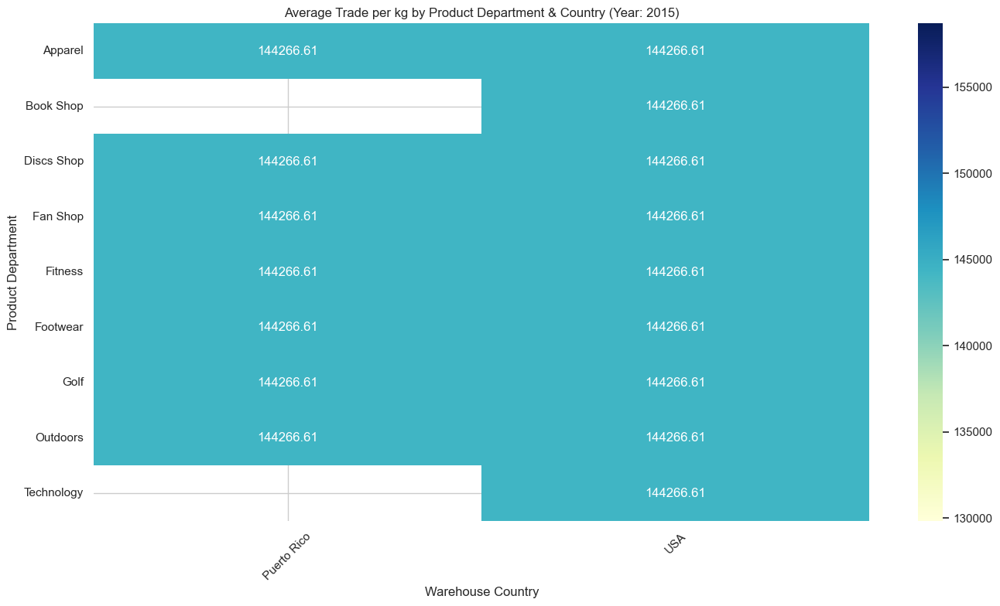

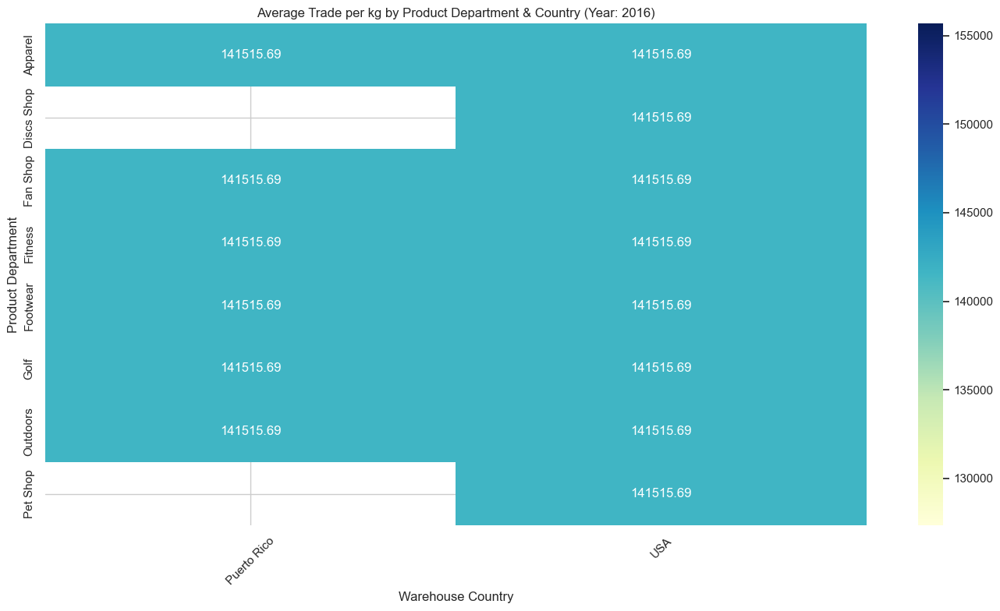

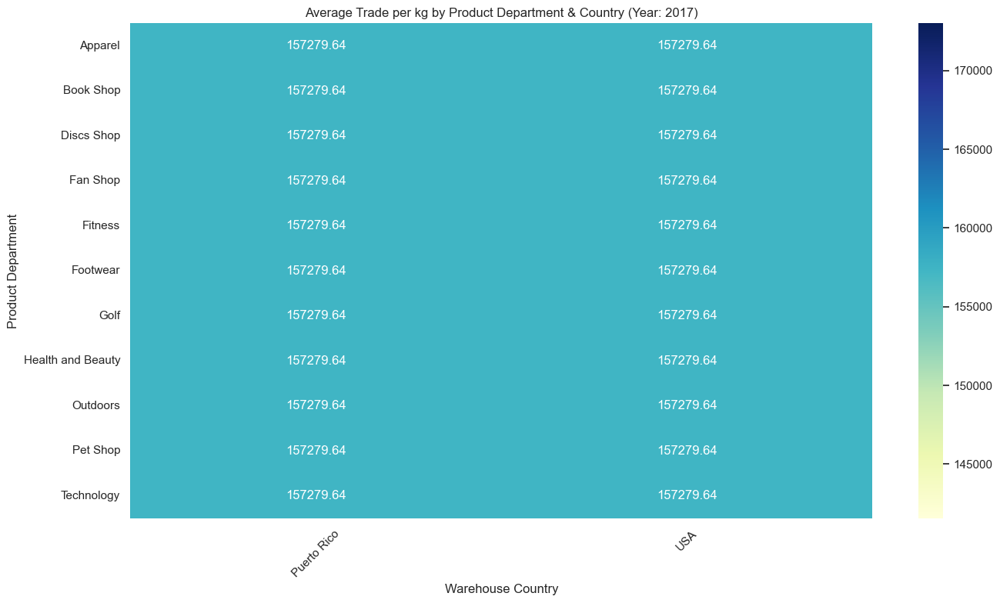

In [252]:
merged['Trade per kg'] = merged['Trade (USD)'] / merged['Weight (kg)']
grouped = merged.groupby(['Product Department', 'Warehouse Country', 'Order Year'])['Trade per kg'].mean().reset_index()
years = grouped['Order Year'].unique()
for year in sorted(years):
    yearly_data = grouped[grouped['Order Year'] == year]
    pivot = yearly_data.pivot(index='Product Department', columns='Warehouse Country', values='Trade per kg')
    plt.figure(figsize=(14, 8))
    sns.heatmap(pivot, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title(f'Average Trade per kg by Product Department & Country (Year: {year})')
    plt.xlabel('Warehouse Country')
    plt.ylabel('Product Department')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### **plot 72 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 72 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

### Question 10: which customer countries consistently order high-quantity, low-profit products that also have low trade val
Question 10: Which customer countries consistently order high-quantity, low-profit products that also have low trade value?
(Columns: Customer Country, Quantity, Profit, Trade (USD), Product Name)

### Step 156: aggregate data and possibly visualize results.

This cell aggregate data and possibly visualize results.

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\3309495921.py:31: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



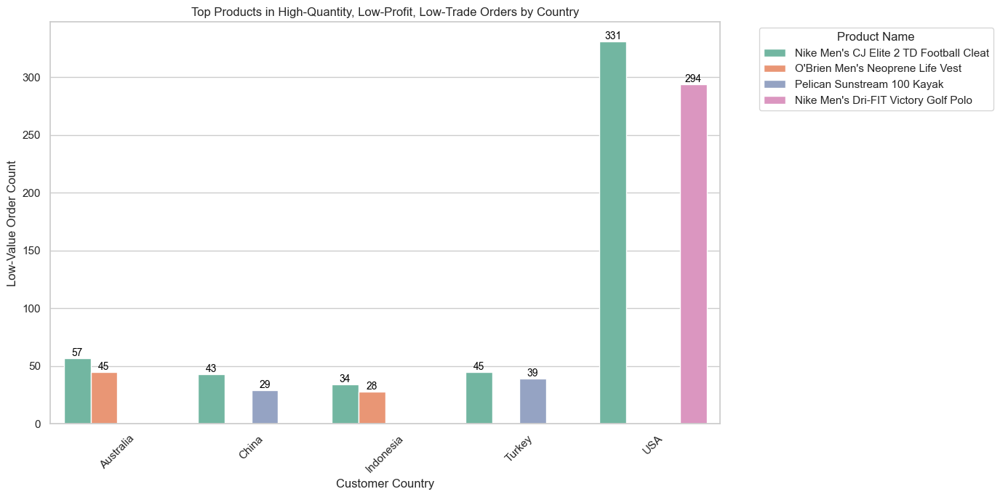

In [259]:
high_quantity_thresh = merged['Quantity'].quantile(0.5)
low_profit_thresh = merged['Profit'].quantile(0.5)
low_trade_thresh = merged['Trade (USD)'].quantile(0.5)
filtered = merged[(merged['Quantity'] >= high_quantity_thresh) & (merged['Profit'] <= low_profit_thresh) & (merged['Trade (USD)'] <= low_trade_thresh)]
grouped = filtered.groupby(['Customer Country', 'Product Name']).size().reset_index(name='LowValueOrderCount')
top_countries = grouped.groupby('Customer Country')['LowValueOrderCount'].sum().sort_values(ascending=False).head(5).index
filtered_top = grouped[grouped['Customer Country'].isin(top_countries)]
top_products = filtered_top.groupby(['Customer Country']).apply(lambda x: x.sort_values(by='LowValueOrderCount', ascending=False).head(2)).reset_index(drop=True)
plt.figure(figsize=(14, 7))
ax = sns.barplot(data=top_products, x='Customer Country', y='LowValueOrderCount', hue='Product Name', palette='Set2')
plt.title('Top Products in High-Quantity, Low-Profit, Low-Trade Orders by Country')
plt.xlabel('Customer Country')
plt.ylabel('Low-Value Order Count')
plt.xticks(rotation=45)
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2.0, height), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
plt.legend(title='Product Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### **plot 73 – description & interpretation**  - intent: visualize data distribution or trend
**Plot 73 – Description & Interpretation**

- Intent: visualize data distribution or trend.
- The plot displays aggregated metrics such as counts or averages.
- Interpretation: assess key patterns or outliers to inform decisions.

# Hypothesis and testing

### **h1** alternate hypothesis: shipments weighing more than the average weight (91,085 kg) are more likely to be labeled s
**H1** Alternate Hypothesis: Shipments weighing more than the average weight (91,085 kg) are more likely to be labeled Second class than First class.

**H0** Null Hypothesis: There is no difference in the likelihood of being labeled Second class versus First class for shipments above or below the average weight (91,085 kg).

significase = 5%

### Step 157: data manipulation / transformation.

This cell data manipulation / transformation.

In [196]:
weight_mean = merged['Weight (kg)'].mean()
weight_mean_rounded = round(weight_mean)
print(weight_mean_rounded)

91085


### Step 158: data manipulation / transformation.

This cell data manipulation / transformation.

In [200]:
threshold = 91085
merged['Weight Category'] = merged['Weight (kg)'].apply(lambda x: 'Heavy' if x > threshold else 'Light')

# Preparing df

### Step 159: data manipulation / transformation.

This cell data manipulation / transformation.

In [207]:
rows = merged['Weight Category'].unique()
cols = merged['Shipment Mode'].unique()

### Step 160: data manipulation / transformation.

This cell data manipulation / transformation.

In [208]:
matrix = []
for i in rows:
    row = []
    for j in cols:
        count = len(merged[(merged['Weight Category'] == i) & (merged['Shipment Mode'] == j)])
        row.append(count)
    matrix.append(row)
print('Rows: Weight Category (', rows, ')')
print('Cols: Shipment Mode (', cols, ')')
print('Matrix (counts):')
for r in matrix:
    print(r)

Rows: Weight Category ( ['Light' 'Heavy'] )
Cols: Shipment Mode ( ['Standard Class' 'Second Class' 'First Class'] )
Matrix (counts):
[4485, 1507, 1280]
[8612, 2879, 2322]


### Step 161: data manipulation / transformation.

This cell data manipulation / transformation.

In [209]:
pd.DataFrame(matrix, index=rows, columns=cols)

,Standard Class,Second Class,First Class
Light,4485,1507,1280
Heavy,8612,2879,2322


### Step 162: data manipulation / transformation.

This cell data manipulation / transformation.

In [230]:
observed_values = pd.DataFrame(matrix, index=rows, columns=cols)

### Step 163: data manipulation / transformation.

This cell data manipulation / transformation.

In [231]:
total_y = observedValues.sum()

### Step 164: data manipulation / transformation.

This cell data manipulation / transformation.

In [233]:
observedValues.loc['Total'] = observedValues.sum()

### Step 165: data manipulation / transformation.

This cell data manipulation / transformation.

In [234]:
observedValues

,Standard Class,Second Class,First Class
Light,4485,1507,1280
Heavy,8612,2879,2322
Total,13097,4386,3602


### Step 166: data manipulation / transformation.

This cell data manipulation / transformation.

In [235]:
observedValues['Total'] = observedValues.sum(axis=1)

### Step 167: data manipulation / transformation.

This cell data manipulation / transformation.

In [236]:
observedValues

,Standard Class,Second Class,First Class,Total
Light,4485,1507,1280,7272
Heavy,8612,2879,2322,13813
Total,13097,4386,3602,21085


### Step2: calculate expected frequency data

### Step 168: data manipulation / transformation.

This cell data manipulation / transformation.

In [237]:
matrix = []
for i in rows:
    l = []
    for j in cols:
        print(observedValues.loc[i, 'Total'])
        print(observedValues.loc['Total', j])
        print(observedValues.loc['Total', 'Total'])
        break
    break

7272
13097
21085


### Step 169: data manipulation / transformation.

This cell data manipulation / transformation.

In [238]:
matrix = []
for i in rows:
    l = []
    for j in cols:
        v = observedValues.loc[i, 'Total'] * observedValues.loc['Total', j] / observedValues.loc['Total', 'Total']
        l.append(v)
    matrix.append(l)
matrix

[[4517.020820488499, 1512.6863647142518, 1242.2928147972493],
 [8579.979179511502, 2873.313635285748, 2359.7071852027507]]

### Step 170: data manipulation / transformation.

This cell data manipulation / transformation.

In [239]:
expected_f = pd.DataFrame(matrix, index=rows, columns=cols)
expected_f

,Standard Class,Second Class,First Class
Light,4517.02082,1512.686365,1242.292815
Heavy,8579.97918,2873.313635,2359.707185


### Step 171: data manipulation / transformation.

This cell data manipulation / transformation.

In [240]:
observedValues.drop('Total', axis=1, inplace=True)
observedValues.drop('Total', axis=0, inplace=True)

### Step 172: data manipulation / transformation.

This cell data manipulation / transformation.

In [241]:
observedValues

,Standard Class,Second Class,First Class
Light,4485,1507,1280
Heavy,8612,2879,2322


### Determine degrees of freedom

### Step 173: data manipulation / transformation.

This cell data manipulation / transformation.

In [242]:
expectedF.shape

(2, 3)

### Step 174: data manipulation / transformation.

This cell data manipulation / transformation.

In [243]:
free_dom = (expectedF.shape[0] - 1) * (expectedF.shape[1] - 1)
free_dom

2

### Calculate the chi square

### Step 175: data manipulation / transformation.

This cell data manipulation / transformation.

In [244]:
observedValues.values.flatten()

array([4485, 1507, 1280, 8612, 2879, 2322], dtype=int64)

### Step 176: data manipulation / transformation.

This cell data manipulation / transformation.

In [254]:
chi_score_table = pd.DataFrame(observedValues.values.flatten(), columns=['O'])
chi_score_table

,O
0,4485
1,1507
2,1280
3,8612
4,2879
5,2322


### Step 177: data manipulation / transformation.

This cell data manipulation / transformation.

In [246]:
chiScoreTable['E'] = expectedF.values.flatten()
chiScoreTable

,O,E
0,4485,4517.020820
1,1507,1512.686365
2,1280,1242.292815
3,8612,8579.979180
4,2879,2873.313635
5,2322,2359.707185


### Step 178: data manipulation / transformation.

This cell data manipulation / transformation.

In [247]:
chiScoreTable['O-E'] = chiScoreTable['O'] - chiScoreTable['E']
chiScoreTable

,O,E,O-E
0,4485,4517.020820,-32.020820
1,1507,1512.686365,-5.686365
2,1280,1242.292815,37.707185
3,8612,8579.979180,32.020820
4,2879,2873.313635,5.686365
5,2322,2359.707185,-37.707185


### Step 179: data manipulation / transformation.

This cell data manipulation / transformation.

In [248]:
chiScoreTable['(O-E)^2'] = chiScoreTable['O-E'] ** 2
chiScoreTable

,O,E,O-E,(O-E)^2
0,4485,4517.020820,-32.020820,1025.332945
1,1507,1512.686365,-5.686365,32.334744
2,1280,1242.292815,37.707185,1421.831816
3,8612,8579.979180,32.020820,1025.332945
4,2879,2873.313635,5.686365,32.334744
5,2322,2359.707185,-37.707185,1421.831816


### Step 180: data manipulation / transformation.

This cell data manipulation / transformation.

In [249]:
chiScoreTable['((O-E)^2)\\E'] = chiScoreTable['(O-E)^2'] / chiScoreTable['E']
chiScoreTable

<>:2: SyntaxWarning:

invalid escape sequence '\E'

<>:2: SyntaxWarning:

invalid escape sequence '\E'

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\3929198520.py:2: SyntaxWarning:

invalid escape sequence '\E'



,O,E,O-E,(O-E)^2,((O-E)^2)\E
0,4485,4517.020820,-32.020820,1025.332945,0.226993
1,1507,1512.686365,-5.686365,32.334744,0.021376
2,1280,1242.292815,37.707185,1421.831816,1.144522
3,8612,8579.979180,32.020820,1025.332945,0.119503
4,2879,2873.313635,5.686365,32.334744,0.011253
5,2322,2359.707185,-37.707185,1421.831816,0.602546


### Step 181: data manipulation / transformation.

This cell data manipulation / transformation.

In [250]:
chi_score = chiScoreTable['((O-E)^2)\\E'].sum()
chi_score

<>:1: SyntaxWarning:

invalid escape sequence '\E'

<>:1: SyntaxWarning:

invalid escape sequence '\E'

C:\Users\DELL\AppData\Local\Temp\ipykernel_26780\480349939.py:1: SyntaxWarning:

invalid escape sequence '\E'



2.1261934846281414

### 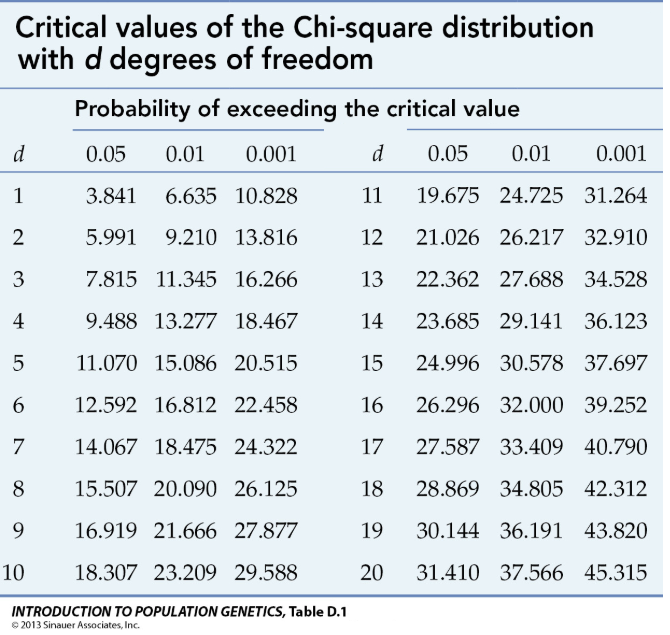

### Step 182: data manipulation / transformation.

This cell data manipulation / transformation.

In [251]:
from scipy.stats import chi2
deg_f = 2
sig = 0.05
chi2.ppf(1 - sig, deg_f)

5.991464547107979

# Final answer:
since the chi score is less than the tabular value then the null hypothesis is accepted

### Step 183: data manipulation / transformation.

This cell data manipulation / transformation.